# Classification: Initial tinkering with E. coli iModulon data to see if we can train a CNN to classify promoters into iModulons

# Try reweighting BCE loss with class weights AND ALSO doing data augmentation

In [1]:
import copy
import pandas as pd
import numpy as np
import utils as u
import matplotlib.pyplot as plt
import matplotlib
import scipy.stats


import altair as alt
import seaborn as sns
import torch_utils as tu

import torch
import torch.nn as nn

import random

import utils as u 
import torch_utils as tu
import models as m

from sklearn.metrics import multilabel_confusion_matrix,ConfusionMatrixDisplay
from sklearn.metrics import classification_report

from skorch import NeuralNetRegressor,NeuralNetClassifier
from skorch.callbacks import EarlyStopping,Checkpoint,GradientNormClipping
from skorch.dataset import Dataset
from skorch.helper import predefined_split


In [2]:
def set_seed(seed: int = 42) -> None:
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    # When running on the CuDNN backend, two further options must be set
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    # Set a fixed value for the hash seed
    #os.environ["PYTHONHASHSEED"] = str(seed)
    print(f"Random seed set as {seed}")


In [3]:
set_seed(46)

Random seed set as 46


## Load data

In [4]:
fname = 'ec_iMod_out/ecoli_seq_M_opFilt.tsv' 
XY = pd.read_csv(fname,sep='\t')
print(XY.shape)
display(XY.head())

loc2seq = dict([(x,z) for (x,z) in XY[['locus_tag','upstream_region']].values])

print(loc2seq['b3575'])

(2129, 99)


,locus_tag,gene,product,type,strand,start,upstream_region,0,1,2,...,82,83,84,85,86,87,88,89,90,91
0,b0005,yaaX,DUF2502 domain-containing protein YaaX,CDS,1,5233,GGCAGAACGTGCTGATTTACCCTTGCTTTCACATAATCTGCCCGCC...,0.008229,-0.000685,-0.005215,...,-0.006856,0.010676,0.008874,0.018497,0.000700,-0.013267,0.015265,0.016886,-0.015319,-0.020727
1,b0007,yaaJ,putative transporter YaaJ,CDS,-1,6528,AGGGAGGTCAATTTGTCCGTCATGATAGTATTTCTCTTTAAACAGC...,0.008111,-0.003929,0.003207,...,-0.000337,-0.010468,0.016122,0.010361,-0.003899,-0.022839,-0.003665,-0.001823,-0.023604,-0.012765
2,b0008,talB,transaldolase B,CDS,1,8237,ATGAAGGAGAAAAAATCTGGCATGCATATCCCTCTTATTGCCGGTC...,0.008629,-0.001270,-0.005664,...,0.000394,0.007215,-0.000707,-0.012959,-0.002329,0.006391,-0.003650,-0.008537,0.002898,-0.000891
3,b0009,mog,molybdopterin adenylyltransferase,CDS,1,9305,AGGGGCTATCGAACGTAAACTGTCTTACACCGGCGAAGTGAAAGCG...,0.002952,0.002053,-0.002882,...,-0.009291,-0.000226,0.016013,0.002179,0.004891,-0.002365,-0.003490,-0.006066,-0.011982,0.011477
4,b0010,satP,acetate/succinate:H(+) symporter,CDS,-1,9927,CATGGTTTGCTGCGCGGCGCGGGGCTGGGAGGCCCTGTAGGTGCGG...,0.006142,0.000884,0.008166,...,-0.009214,-0.010588,0.001363,0.003979,-0.005208,0.003190,-0.015137,-0.005784,-0.001302,0.010800


TCAATCAGCATCAACCCGCGAAACAGACTCTGGCTTCCGGCTGGACGCTCTTTTTCCTGCGCCATCTCGTTCTCTTTTTTTCCCATCACTTCTTTCCCCATTTTGTCGCGTCCTGATGGTAGCGCAAAGTGTGCCGTAGTTCACGATCTCGACAGATAATTTATAACCAATTGATTTTTATGTCTTTTGAAATTCATCAATCAGATTGCCTTGTTAAAAAGTGATCGATATATTTGAAATCAAGTTTCGCATATTGAAATTTTAAGCCAAAAAAGCGATCAAAAAAACAAGGAAGCCTGG


In [5]:
# get iModulon column labels
M = pd.read_csv('ec_iMod_out/iMod_download/M.csv',index_col=0)
imods = [x.strip() for x in M.columns]
imods[:5]

['0', '1', '2', '3', '4']

In [6]:
# load binarized version of M matrix
Mb = pd.read_csv('ec_iMod_out/iMod_download/gene_presence_matrix.csv',index_col=0).astype(int)
Mb.index.name='locus_tag'
Mb

,0,1,2,3,4,5,6,7,8,9,...,82,83,84,85,86,87,88,89,90,91
locus_tag,,,,,,,,,,,,,,,,,,,,,
b0002,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b0003,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b0004,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b0005,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b0006,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b4688,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b4693,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
b4696_1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
# Convert XY into binarazed version
XYb = pd.merge(XY.drop(imods,axis=1), Mb.reset_index(),on='locus_tag')
XYb

,locus_tag,gene,product,type,strand,start,upstream_region,0,1,2,...,82,83,84,85,86,87,88,89,90,91
0,b0005,yaaX,DUF2502 domain-containing protein YaaX,CDS,1,5233,GGCAGAACGTGCTGATTTACCCTTGCTTTCACATAATCTGCCCGCC...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,b0007,yaaJ,putative transporter YaaJ,CDS,-1,6528,AGGGAGGTCAATTTGTCCGTCATGATAGTATTTCTCTTTAAACAGC...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,b0008,talB,transaldolase B,CDS,1,8237,ATGAAGGAGAAAAAATCTGGCATGCATATCCCTCTTATTGCCGGTC...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,b0009,mog,molybdopterin adenylyltransferase,CDS,1,9305,AGGGGCTATCGAACGTAAACTGTCTTACACCGGCGAAGTGAAAGCG...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,b0010,satP,acetate/succinate:H(+) symporter,CDS,-1,9927,CATGGTTTGCTGCGCGGCGCGGGGCTGGGAGGCCCTGTAGGTGCGG...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2124,b4395,ytjC,putative phosphatase,CDS,1,4633796,TGCTGTCACCATCGATGCCAGCTTCAATCGCCACCCAAAAATCAGC...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2125,b4396,rob,DNA-binding transcriptional dual regulator Rob,CDS,-1,4634440,ATACGGTGTCGACCGAACCAATCTCTTCTGCATGAGCCAATGGCCC...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2126,b4397,creA,PF05981 family protein CreA,CDS,1,4635520,CTTTCGCCGCTACATTGTCGAGCGACAGGGGCTGATCCAGATGACC...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2127,b4401,arcA,DNA-binding transcriptional dual regulator ArcA,CDS,-1,4639589,ACAATTGAACTTGATATATGTCAACGAAGCGTAGTTTTATTGGGTG...,0,0,0,...,0,0,0,0,0,0,0,0,0,0


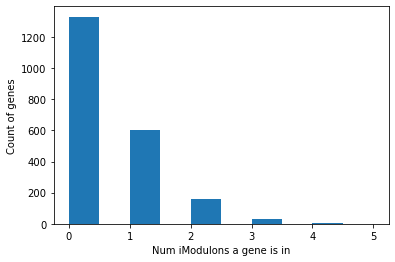

In [8]:
# distribution of ecoli genes and how many iMods they are in
plt.hist([sum(XYb.iloc[i][imods]) for i in range(XYb.shape[0])])
plt.xlabel("Num iModulons a gene is in")
plt.ylabel("Count of genes")
plt.show()

## Filter out uninformative iModulons (and genes?)
* Some iModulons have too few genes to learn from. Get rid of any less than 5. (after filtering out for genes in operons)
* Some genes aren't in any iModulons. Are those worth excluding too?

In [9]:
# make a list of imodulons above a certain threshold
thresh = 4
#mbc = dict([(Mb.iloc[i].name,sum(Mb.iloc[i])) for i in range(Mb.shape[0])])
XYim = XYb[imods]
mbc = dict([(XYim.T.iloc[i].name,sum(XYim.T.iloc[i])) for i in range(XYim.shape[1])])
imods_filt = [x for x in mbc if mbc[x]>thresh]
print("num iMods that pass:",len(imods_filt))

num iMods that pass: 58


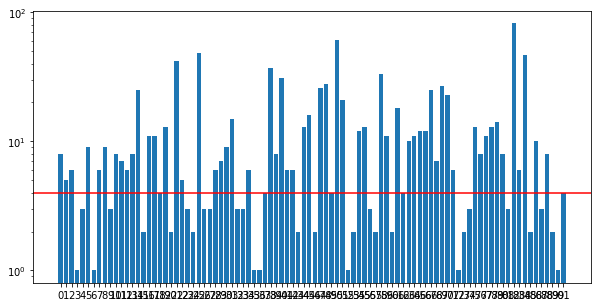

In [10]:
figure = plt.figure(figsize=(10,5))
plt.bar(imods,[mbc[x] for x in imods])
plt.axhline(thresh,c='r')
plt.yscale("log")

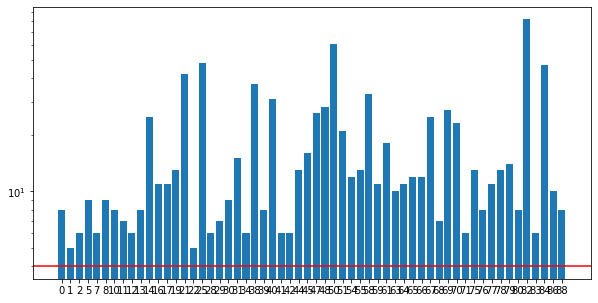

In [11]:
figure = plt.figure(figsize=(10,5))
plt.bar(imods_filt,[mbc[x] for x in imods_filt])
plt.axhline(thresh,c='r')
plt.yscale("log")


In [12]:
# these iMods seem too small to meaningfully try to predict
# (some are single-gene iMods)
imods_exclude = [x for x in mbc if mbc[x]<=thresh]
print(f"num iMods filtered out b/c fewer than {thresh} genes: {len(imods_exclude)}")

num iMods filtered out b/c fewer than 4 genes: 34


In [13]:
# drop excluded iMods and keep binary labels
XY = XYb.drop(imods_exclude,axis=1)
XY

,locus_tag,gene,product,type,strand,start,upstream_region,0,1,2,...,76,77,78,79,80,82,83,84,86,88
0,b0005,yaaX,DUF2502 domain-containing protein YaaX,CDS,1,5233,GGCAGAACGTGCTGATTTACCCTTGCTTTCACATAATCTGCCCGCC...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,b0007,yaaJ,putative transporter YaaJ,CDS,-1,6528,AGGGAGGTCAATTTGTCCGTCATGATAGTATTTCTCTTTAAACAGC...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,b0008,talB,transaldolase B,CDS,1,8237,ATGAAGGAGAAAAAATCTGGCATGCATATCCCTCTTATTGCCGGTC...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,b0009,mog,molybdopterin adenylyltransferase,CDS,1,9305,AGGGGCTATCGAACGTAAACTGTCTTACACCGGCGAAGTGAAAGCG...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,b0010,satP,acetate/succinate:H(+) symporter,CDS,-1,9927,CATGGTTTGCTGCGCGGCGCGGGGCTGGGAGGCCCTGTAGGTGCGG...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2124,b4395,ytjC,putative phosphatase,CDS,1,4633796,TGCTGTCACCATCGATGCCAGCTTCAATCGCCACCCAAAAATCAGC...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2125,b4396,rob,DNA-binding transcriptional dual regulator Rob,CDS,-1,4634440,ATACGGTGTCGACCGAACCAATCTCTTCTGCATGAGCCAATGGCCC...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2126,b4397,creA,PF05981 family protein CreA,CDS,1,4635520,CTTTCGCCGCTACATTGTCGAGCGACAGGGGCTGATCCAGATGACC...,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2127,b4401,arcA,DNA-binding transcriptional dual regulator ArcA,CDS,-1,4639589,ACAATTGAACTTGATATATGTCAACGAAGCGTAGTTTTATTGGGTG...,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## stratified splitting

In [14]:
def count_imod_train_test_labels(imods,ytr,yte):
    '''
    Given a train and test set of y labels, count how many trues
    are in each imodulon for each split
    '''
    # loop through each train example and count True labels for each imodulon
    imc_train = torch.tensor([0 for x in range(ytr.shape[1])])
    for s in ytr:
        imc_train += s.long()

    # loop through each test example and count True labels for each imodulon
    imc_test = torch.tensor([0 for x in range(yte.shape[1])])
    for s in yte:
        imc_test += s.long()
    
    # print warning for missing examples
    for i,im in enumerate(imods):
        if imc_train[i] == 0:
            print(f"WARNING: iMod {im} train set missing True example.")
        if imc_test[i] == 0:
            print(f"WARNING: iMod {im} test set missing True example.")
            
    # make sure the len of these imod vectors is the same
    assert len(imc_train) == len(imc_test) == len(imods)

    # stack into a pandas df, melt it, plot it
    ts = np.array(torch.stack((torch.tensor([int(x) for x in imods]), imc_train, imc_test)).T)
    imc_df = pd.DataFrame(data=ts,columns=['imod','train_count','test_count'])
    imc_df_melt = imc_df.melt(id_vars=['imod'],value_vars=['train_count','test_count'],var_name='split',value_name='count')
    
    # plot stuff
    plt.figure(figsize=(20,5))
    sns.barplot(data=imc_df_melt, x='imod', y='count', hue='split')
    #plt.yscale('log')
    
    #return imc_df_melt

def make_mt_skorch_dfs(df,seq_col='seq',target_cols=['highCu','noCu']):
    '''
    Make multi-task X,y matrix,vec for skorch fit() loop.
    '''
    seqs = list(df[seq_col].values)        
    ohe_seqs = torch.stack([torch.tensor(u.one_hot_encode(x)) for x in seqs])

    # number of labels = len(target_cols)
    labels = torch.tensor(list(df[target_cols].values))
    # bad dimension? fixed in model.forward for now
    
    return ohe_seqs.float(), labels.float()

In [15]:
X, y = make_mt_skorch_dfs(XY, seq_col="upstream_region",target_cols=imods_filt)
print("\nX:",X.shape)
print("y:",y.shape)


X: torch.Size([2129, 300, 4])
y: torch.Size([2129, 58])


In [16]:
from skmultilearn.model_selection import iterative_train_test_split


In [17]:
def augment_mutate(df,n,seq_col='upstream_region',mutation_rate=0.1):
    '''
    Given a dataframe of training data, augment it by adding 
    mutated versions back into the data frame
    '''
    mutation_dict = {
        'A':['C','G','T'],
        'C':['G','T','A'],
        'G':['T','A','C'],
        'T':['A','C','G']
    }
    new_rows = []
    # for each row in the original df
    for i,row in df.iterrows():
        seq = row[seq_col]
                
        # generate n mutants
        for j in range(n):
            new_row = copy.deepcopy(row)
            new_seq = list(seq)
            mutate_vec = [random.random() for x in range(len(seq))]
            
            # loop through mutation values along length of the seq
            for k in range(len(seq)):
                # if random value is below mutation rate, then make a change
                if mutate_vec[k] < mutation_rate:
                    cur_base = seq[k]
                    # select new base randomly
                    new_base = random.choice(mutation_dict[cur_base])
                    new_seq[k] = new_base
            
            new_row[seq_col] = ''.join(new_seq)
            new_row['seq_version'] = j+1
            new_rows.append(new_row.values)

    # put new rows into a df
    new_rows = pd.DataFrame(new_rows,columns=new_row.index)
    # add version to og df 
    df['seq_version'] = 0
    
    return pd.concat([df,new_rows])

def augment_only_imod_genes(df,n,imod_cols,seq_col='upstream_region',mutation_rate=0.1):
    '''
    Given a dataframe of genes to augments, selectively augment only datapoints where 
    the gene is in at least 1 iModulon. Don't both augmenting stuff that is just more
    empty examples
    '''
    df['no_imods'] = df.apply(lambda row: False if sum(row[imod_cols].values) > 0 else True,axis=1)
    
    augmented_df = augment_mutate(df[df['no_imods']==False],n,seq_col=seq_col, mutation_rate=mutation_rate)
    remaining_df = df[df['no_imods']==True]
    remaining_df['seq_version'] = 0
    
    return pd.concat([augmented_df,remaining_df])

In [18]:
# https://github.com/scikit-multilearn/scikit-multilearn/issues/206
def iterative_train_test_split_dataframe(X, y, test_size):
    # use iterative split but pass X as a df. Y is still an array?
    df_index = np.expand_dims(X.index.to_numpy(), axis=1)
    X_train, y_train, X_test, y_test = iterative_train_test_split(df_index, y, test_size = test_size)
    X_train = X.loc[X_train[:,0]]
    X_test = X.loc[X_test[:,0]]
    return X_train, y_train, X_test, y_test

In [19]:
# make n diff train test splits

def make_n_strat_splits(XYdf, ylabel, n, k, imod_cols):
    splits = {}
    # create n splits
    for i in range(n): 
        print("Creating split",i)
        # use DF form of XY
        Xfull_train_df, yfull_train, Xtest_df, ytest = iterative_train_test_split_dataframe(XYdf, ylabel, test_size = 0.2)
        Xtrain_df, ytrain, Xval_df, yval = iterative_train_test_split_dataframe(Xfull_train_df, yfull_train, test_size = 0.2)

        # augment the train set with k more samples per gene
        #Xtrain_df_aug = augment_mutate(Xtrain_df,k)
        Xtrain_df_aug = augment_only_imod_genes(Xtrain_df,k,imod_cols)

        # augment the val set with k more samples per gene
        #Xval_df_aug = augment_mutate(Xval_df,k)
        Xval_df_aug = augment_only_imod_genes(Xval_df,k,imod_cols)

        # combine train and val augmented into full train augmented (for later)
        Xfull_train_df_aug = pd.concat([Xtrain_df_aug, Xval_df_aug])

        # make into tensors
        Xfull_train,yfull_train = make_mt_skorch_dfs(Xfull_train_df, seq_col="upstream_region",target_cols=imod_cols)
        Xtest,ytest             = make_mt_skorch_dfs(Xtest_df, seq_col="upstream_region",target_cols=imod_cols)
        Xtrain, ytrain          = make_mt_skorch_dfs(Xtrain_df, seq_col="upstream_region",target_cols=imod_cols)
        Xtrain_aug, ytrain_aug  = make_mt_skorch_dfs(Xtrain_df_aug, seq_col="upstream_region",target_cols=imod_cols)
        Xval, yval              = make_mt_skorch_dfs(Xval_df, seq_col="upstream_region",target_cols=imod_cols)

        Xfull_train_aug,yfull_train_aug = make_mt_skorch_dfs(Xfull_train_df_aug, seq_col="upstream_region",target_cols=imod_cols)

        split = {
            'Xfull_train':Xfull_train,
            'yfull_train':yfull_train,
            'Xtest':Xtest,
            'ytest':ytest,
            'Xtrain':Xtrain,
            'ytrain':ytrain,
            'Xtrain_aug':Xtrain_aug,
            'ytrain_aug':ytrain_aug,
            'Xval':Xval,
            'yval':yval,
            'Xfull_train_aug':Xfull_train_aug,
            'yfull_train_aug':yfull_train_aug,
        }

        splits[i] = split
        
    return splits


In [20]:
splits = make_n_strat_splits(XY, y, 3, 10, imods_filt)

Creating split 0


/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

Creating split 1


/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

Creating split 2


/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

In [21]:
splits[0]['Xfull_train_aug'].shape

torch.Size([7463, 300, 4])

In [22]:
splits[0]['Xfull_train'].shape

torch.Size([1703, 300, 4])

In [23]:
# pick first split for now
s = splits[0]

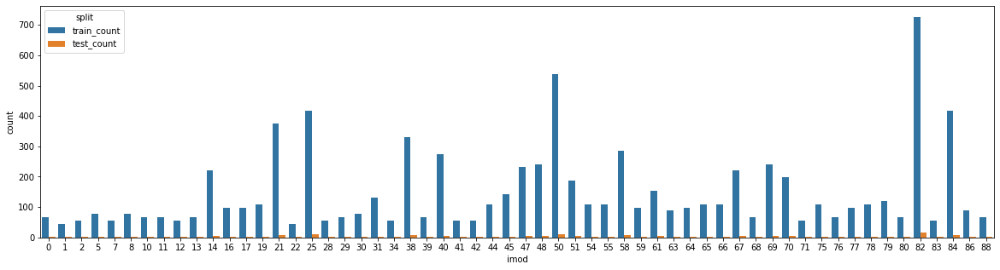

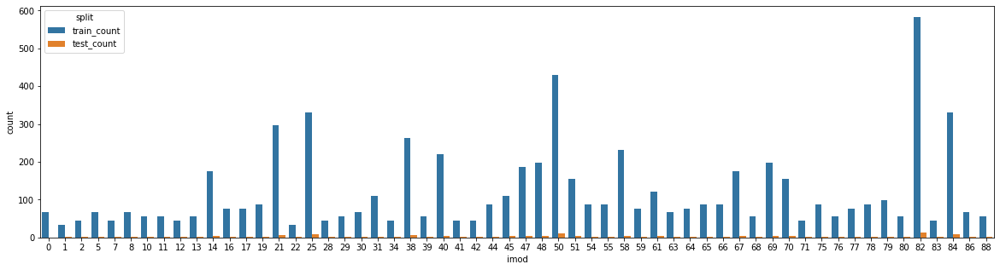

In [24]:
count_imod_train_test_labels(imods_filt,s['yfull_train_aug'],s['ytest'])
count_imod_train_test_labels(imods_filt,s['ytrain_aug'],s['yval'])

## pick some params

In [25]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
DEVICE

device(type='cuda')

In [26]:
from skorch.dataset import ValidSplit

# Viz model results

In [67]:
def sk_loss_plot(nets,yscaler=5):
    '''
    Draw the train/val losses from a skorch net
    '''
    # train loss plot
    fig = plt.figure(figsize=(10,5))
    smallest_val = 999
    for i,(net,name) in enumerate(nets):
        # plot net_regr's loss trace
        train_loss = net.history[:, 'train_loss']
        valid_loss = net.history[:, 'valid_loss']
        valid_acc = net.history[:, 'valid_acc']
        
        plt.plot(train_loss,'-',color=f"C{i}", label=f"{name} Train",linewidth=1.0,alpha=0.5)
        plt.plot(valid_loss,'-',color=f"C{i}", label=f"{name} Val",linewidth=3.0,alpha=0.5)
        
        
        val_min_ep,val_min = min(enumerate(valid_loss),key = lambda t: t[1])
        plt.axhline(val_min,linestyle='--',c=f"C{i}",linewidth=0.5)
        plt.axvline(val_min_ep,linestyle='--',c=f"C{i}",linewidth=0.5)
        #plt.axhline(5,c='k')
        
        if val_min < smallest_val:
            smallest_val = val_min

    plt.ylim(0,smallest_val*yscaler)
    plt.xlabel("Epoch",fontsize=14)
    plt.ylabel(f"Loss ({str(net.criterion)})",fontsize=14)
    plt.legend(bbox_to_anchor=(1,1),loc='upper left')
    plt.show()
    
    # val acc plot
    fig2 = plt.figure(figsize=(10,2))
    for i,(net,name) in enumerate(nets):
        # plot net_regr's loss trace
        valid_acc = net.history[:, 'valid_acc']
        plt.plot(valid_acc,'--',color=f"C{i}", label=f"{name} Val Acc")
    
    plt.ylim(0,1)
    plt.xlabel("Epoch",fontsize=14)
    plt.ylabel("Valid Accuracy",fontsize=14)
    plt.legend(bbox_to_anchor=(1,1),loc='upper left')
    plt.show()
    
#def plot_confusion_multi(models,genes,oracle,objs):
def plot_confusion_multi(models,Xs,ys,imods):
    '''Get class predictions and plot confusion matrix'''

    for sk_model,model_name in models:
        #model.eval()
        print(f"Running {model_name}")
        
        y_preds = sk_model.predict(Xs)
        
        confs = multilabel_confusion_matrix(ys, y_preds)

        # display the matrix
        #for i in range(y_preds.shape[1]):
        for i,imod in enumerate(imods):
            mats = []
            c = confs[i]
            mats.append((c,f"raw counts"))
            # get the normalized confusino matrix
            cp = np.zeros(c.shape)
            for i,row in enumerate(c):
                rowsum = sum(row)
                for j,item in enumerate(row):
                    val = item/rowsum
                    cp[i][j] = val

            mats.append((cp,f"normed counts"))
            #print(mats)
            
            f, axes = plt.subplots(1, 2, figsize=(5, 3))#, sharey='row')
            axes = list(axes)
            #axes_list = [item for sublist in axes for item in sublist]
            
            for i,(mat,title) in enumerate(mats):
                disp = ConfusionMatrixDisplay(confusion_matrix=mat)
                #disp.plot(ax=axes_list.pop(0))
                disp.plot(ax=axes.pop(0))
                disp.ax_.set_title(title)
            
            f.suptitle(f"{model_name}, iMod {imod}",fontsize=20)
            #plt.title(f"{model_name}, iMod {imod}")
            plt.tight_layout()
            # plt.show()
        
#    return dfs


def alt_cls_summary(df):
    heat = alt.Chart(df).mark_rect().encode(
        x=alt.X('imod:O'),
        y=alt.Y('metric:O'),
        color='score:Q',
        tooltip=['metric:N','score:Q']
    ).properties(width=600)

    support = alt.Chart(df).mark_circle().encode(
        x=alt.X('imod:O',title='',axis=alt.Axis(labels=False)),
        color=alt.Color('support:Q', legend=None,scale=alt.Scale(scheme='greys')),
        size='support:Q',
        tooltip=['support']
    ).properties(width=600)

    return alt.vconcat(support,heat
        ).resolve_scale(color='independent'
        ).configure_concat(
            spacing=0
        )

def alt_cls_summary2(df):
    heat = alt.Chart(df).mark_rect().encode(
        x=alt.X('imod:O'),
        y=alt.Y('metric:O'),
        color=alt.Color('score:Q',scale=alt.Scale(domain=(0.0,1.0))),
        tooltip=['metric:N','score:Q']
    ).properties(width=600)

    support = alt.Chart(df).mark_bar().encode(
        x=alt.X('imod:O',title='',axis=alt.Axis(labels=False)),
        color=alt.Color('support:Q', legend=None,scale=alt.Scale(scheme='greys')),
        y='support:Q',
        tooltip=['support']
    ).properties(width=600,height=50)

    return alt.vconcat(support,heat
        ).resolve_scale(color='independent'
        ).configure_concat(
            spacing=0
        )

def view_cls_report(sk_model,Xs,ys,imods):
    '''
    For a given model and set of X,y examples, save and display 
    a summary of the primary classification metrics
    '''
    # get the predictions and classification report
    y_preds = sk_model.predict(Xs)
    cls_rep = classification_report(ys, y_preds,target_names=imods,output_dict=True)
    
    # conver the dict into a df for viewing
    cls_df = pd.DataFrame.from_dict(cls_rep,orient='index')
    cls_df.index.name='imod'
    cls_df = cls_df.reset_index()
    
    # drop the micro/macro average colums
    cls_df = cls_df.drop(cls_df[~cls_df['imod'].isin(imods)].index)
    # convert to int for sorting
    cls_df['imod'] = cls_df['imod'].apply(lambda x: int(x))
    
    # melt the df for altair
    cls_melt = cls_df.melt(
        id_vars=['imod','support'],
        value_vars=['precision','recall','f1-score'],
        var_name='metric',
        value_name='score')
    
    #alt_cls_summary(cls_melt)
    display(alt_cls_summary2(cls_melt))

    return cls_df
    
    
    
    

In [28]:
# nets = [
#     (net_strat_val,'Net strat with val'),
# ]

# sk_loss_plot(nets)

In [29]:
#plot_confusion_multi(nets, Xval_strat,yval_strat,imods_filt)

In [30]:
# cls_full_train_df = view_cls_report(net_strat_val,Xtrain_strat,ytrain_strat,imods_filt)
# cls_test_df = view_cls_report(net_strat_val,Xval_strat,yval_strat,imods_filt)

## BCEwithlogitsloss reweighting?

In [31]:
def get_class_counts(ys):
    y_sum = torch.tensor(np.zeros(ys.shape[1]))
    for ex in ys:
        y_sum += ex

    return y_sum

# https://discuss.pytorch.org/t/weights-in-bcewithlogitsloss/27452/11?u=crypdick
def get_pos_weights(ys):
    class_counts = get_class_counts(ys)
    pos_weights = np.ones_like(class_counts)
    neg_counts = [len(ys)-pos_count for pos_count in class_counts]  # <-- HERE 
    
    for cdx, (pos_count, neg_count) in enumerate(zip(class_counts,  neg_counts)):
        print(f"{cdx}| pos:{pos_count}  neg:{neg_count}")
        print("val:", neg_count / (pos_count + 1e-5))
        pos_weights[cdx] = neg_count / (pos_count + 1e-5)
        

    return torch.as_tensor(pos_weights, dtype=torch.float)

In [32]:
# quick train without agumentation

In [33]:
# apparently i think DNA_2CNN_2FC_Multi should still work for multi-label classification
valid_ds = Dataset(s['Xval'], s['yval'])
# weight by the distribution of examples in non-augmented training set?
bce_pos_weights = get_pos_weights(s['ytrain'])

net = NeuralNetClassifier(
    m.DNA_2CNN_2FC_Multi, # my pytorch model
    criterion=torch.nn.BCEWithLogitsLoss(pos_weight=bce_pos_weights),
    train_split=predefined_split(valid_ds), # stratified =True
    module__seq_len=300, # pass arg to pytorch model
    module__n_tasks=y.shape[1],
    module__num_filters1=128,
    module__num_filters2=64,
    module__kernel_size1=8,
    module__kernel_size2=8,
    module__conv_pool_size1=3, 
    module__conv_pool_size2=1,
    module__fc_node_num1 = 100,
    module__fc_node_num2 = 100,
    module__dropout1 = 0.2,
    module__dropout2 = 0.2,
    max_epochs=2000,
    lr=0.001,
    device=DEVICE,  # uncomment this to train with CUDA
     callbacks=[
         EarlyStopping(patience=100),
         #Checkpoint(load_best=True),
         GradientNormClipping()
     ],
    optimizer=torch.optim.Adam,
    #optimizer=torch.optim.SGD,
    iterator_train__shuffle=True,
    #train_split=predefined_split(valid_ds)
    #train_split=None
)

0| pos:6.0  neg:1356.0
val: tensor(225.9996, dtype=torch.float64)
1| pos:3.0  neg:1359.0
val: tensor(452.9985, dtype=torch.float64)
2| pos:4.0  neg:1358.0
val: tensor(339.4992, dtype=torch.float64)
3| pos:6.0  neg:1356.0
val: tensor(225.9996, dtype=torch.float64)
4| pos:4.0  neg:1358.0
val: tensor(339.4992, dtype=torch.float64)
5| pos:6.0  neg:1356.0
val: tensor(225.9996, dtype=torch.float64)
6| pos:5.0  neg:1357.0
val: tensor(271.3995, dtype=torch.float64)
7| pos:5.0  neg:1357.0
val: tensor(271.3995, dtype=torch.float64)
8| pos:4.0  neg:1358.0
val: tensor(339.4992, dtype=torch.float64)
9| pos:5.0  neg:1357.0
val: tensor(271.3995, dtype=torch.float64)
10| pos:16.0  neg:1346.0
val: tensor(84.1249, dtype=torch.float64)
11| pos:7.0  neg:1355.0
val: tensor(193.5712, dtype=torch.float64)
12| pos:7.0  neg:1355.0
val: tensor(193.5712, dtype=torch.float64)
13| pos:8.0  neg:1354.0
val: tensor(169.2498, dtype=torch.float64)
14| pos:27.0  neg:1335.0
val: tensor(49.4444, dtype=torch.float64)
15| p

In [34]:
# train with non-augmented train set
net.fit(s['Xtrain'], s['ytrain'])


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.3806       0.0000        1.3523  3.1962
      2        1.3769       0.0000        1.3523  0.1542
      3        1.3763       0.0000        1.3524  0.1383
      4        1.3761       0.0000        1.3524  0.1381
      5        1.3752       0.0000        1.3526  0.1387
      6        1.3736       0.0000        1.3517  0.1383
      7        1.3695       0.0000        1.3514  0.1377
      8        1.3641       0.0000        1.3498  0.1382
      9        1.3527       0.0000        1.3469  0.1384
     10        1.3298       0.0000        1.3479  0.1383
     11        1.2905       0.0000        1.3484  0.1385
     12        1.2443       0.0000        1.3706  0.1390
     13        1.1874       0.0000        1.4253  0.1405
     14        1.1152       0.0000        1.5135  0.1388
     15        1.0265       0.0000        1.6402  0.1382
     16        0.9891       0.0

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=DNA_2CNN_2FC_Multi(
    (conv_net): Sequential(
      (0): Conv2d(1, 128, kernel_size=(4, 8), stride=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=(1, 3), stride=(1, 3), padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.2, inplace=False)
      (4): Conv2d(128, 64, kernel_size=(1, 8), stride=(1, 1))
      (5): ReLU()
      (6): Dropout(p=0.2, inplace=False)
      (7): Flatten()
      (8): Linear(in_features=5760, out_features=100, bias=True)
      (9): ReLU()
      (10): Linear(in_features=100, out_features=100, bias=True)
      (11): ReLU()
      (12): Linear(in_features=100, out_features=58, bias=True)
    )
  ),
)

In [35]:
print("Xtrain",s["Xtrain"].shape)
print("ytrain",s["ytrain"].shape)
print("Xval",s["Xval"].shape)
print("yval",s["yval"].shape)

Xtrain torch.Size([1362, 300, 4])
ytrain torch.Size([1362, 58])
Xval torch.Size([341, 300, 4])
yval torch.Size([341, 58])


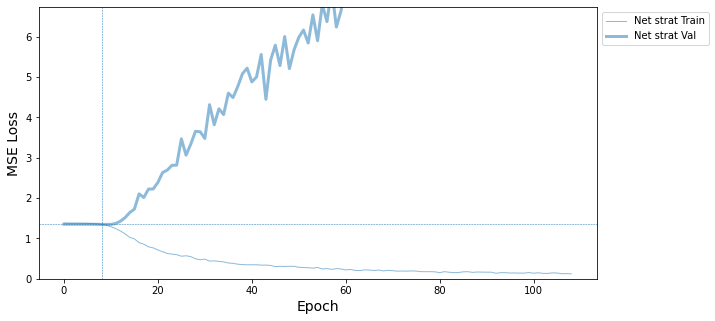

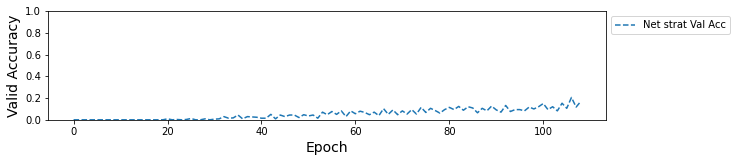

In [36]:
nets = [
    (net,'Net strat'),
    #(net_strat_bcew,'Net strat with BCE loss weights')
]

sk_loss_plot(nets)

In [37]:
_ = view_cls_report(net,s['Xtrain'],s['ytrain'],imods_filt)
_ = view_cls_report(net,s['Xval'],s['yval'],imods_filt)

/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


alt.VConcatChart(...)

/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


alt.VConcatChart(...)

# now run same params but with data augmented

In [68]:
# apparently i think DNA_2CNN_2FC_Multi should still work for multi-label classification
valid_ds = Dataset(s['Xval'], s['yval'])
# weight by the distribution of examples in AUGmented training set?
bce_pos_weights = get_pos_weights(s['ytrain_aug'])

net_da = NeuralNetClassifier(
    m.DNA_2CNN_2FC_Multi, # my pytorch model
    criterion=torch.nn.BCEWithLogitsLoss(pos_weight=bce_pos_weights),
    train_split=predefined_split(valid_ds), # stratified =True
    module__seq_len=300, # pass arg to pytorch model
    module__n_tasks=y.shape[1],
    module__num_filters1=128,
    module__num_filters2=64,
    module__kernel_size1=8,
    module__kernel_size2=8,
    module__conv_pool_size1=3, 
    module__conv_pool_size2=1,
    module__fc_node_num1 = 100,
    module__fc_node_num2 = 100,
    module__dropout1 = 0.2,
    module__dropout2 = 0.2,
    max_epochs=8000,
    lr=0.001,
    device=DEVICE,  # uncomment this to train with CUDA
     callbacks=[
         #EarlyStopping(patience=300),
         EarlyStopping(patience=3000,monitor='valid_acc',lower_is_better=False),
         #Checkpoint(load_best=True,monitor='valid_acc_best'),
         Checkpoint(monitor='valid_acc_best',dirname='data_aug_chks',f_pickle='model.pkl'),
         GradientNormClipping()
     ],
    optimizer=torch.optim.Adam,
    #optimizer=torch.optim.SGD,
    iterator_train__shuffle=True,
    #train_split=predefined_split(valid_ds)
    #train_split=None
)

0| pos:66.0  neg:5616.0
val: tensor(85.0909, dtype=torch.float64)
1| pos:33.0  neg:5649.0
val: tensor(171.1818, dtype=torch.float64)
2| pos:44.0  neg:5638.0
val: tensor(128.1363, dtype=torch.float64)
3| pos:66.0  neg:5616.0
val: tensor(85.0909, dtype=torch.float64)
4| pos:44.0  neg:5638.0
val: tensor(128.1363, dtype=torch.float64)
5| pos:66.0  neg:5616.0
val: tensor(85.0909, dtype=torch.float64)
6| pos:55.0  neg:5627.0
val: tensor(102.3091, dtype=torch.float64)
7| pos:55.0  neg:5627.0
val: tensor(102.3091, dtype=torch.float64)
8| pos:44.0  neg:5638.0
val: tensor(128.1363, dtype=torch.float64)
9| pos:55.0  neg:5627.0
val: tensor(102.3091, dtype=torch.float64)
10| pos:176.0  neg:5506.0
val: tensor(31.2841, dtype=torch.float64)
11| pos:77.0  neg:5605.0
val: tensor(72.7922, dtype=torch.float64)
12| pos:77.0  neg:5605.0
val: tensor(72.7922, dtype=torch.float64)
13| pos:88.0  neg:5594.0
val: tensor(63.5682, dtype=torch.float64)
14| pos:297.0  neg:5385.0
val: tensor(18.1313, dtype=torch.float

In [69]:
net_da.fit(s['Xtrain_aug'], s['ytrain_aug'])


  epoch    train_loss    valid_acc    valid_loss    cp     dur
-------  ------------  -----------  ------------  ----  ------
      1        1.3569       0.0000        0.9242     +  0.7049
      2        1.2457       0.0000        0.9020        0.5688
      3        0.7534       0.0000        1.2031        0.5730
      4        0.4709       0.0000        1.6972        0.5656
      5        0.3366       0.0088        1.9271     +  0.5611
      6        0.2549       0.0088        2.0776        0.5551
      7        0.2111       0.0176        2.4849     +  0.5662
      8        0.1679       0.0352        2.7900     +  0.5606
      9        0.1441       0.0293        3.0811        0.5568
     10        0.1191       0.0557        3.1733     +  0.5560
     11        0.1063       0.0616        3.1962     +  0.5593
     12        0.0940       0.0528        3.3765        0.5552
     13        0.0855       0.0880        3.7476     +  0.5535
     14        0.0745       0.1085        3.3926     + 

    119        0.0081       0.3460        8.3026        0.5547
    120        0.0050       0.4047        8.5887        0.5612
    121        0.0056       0.4164        9.0437        0.5664
    122        0.0053       0.3372        8.6395        0.5733
    123        0.0049       0.3812        8.6009        0.5705
    124        0.0043       0.4252        9.0007        0.5729
    125        0.0042       0.4282        9.2582        0.5576
    126        0.0060       0.3988        8.9286        0.5626
    127        0.0102       0.4457        8.5225     +  0.5594
    128        0.0059       0.4076        8.9688        0.5594
    129        0.0124       0.3695        6.9298        0.5570
    130        0.0066       0.4282        9.1022        0.5615
    131        0.0046       0.3842        9.0122        0.5709
    132        0.0065       0.3460        8.5235        0.5672
    133        0.0079       0.3666        8.5933        0.5646
    134        0.0045       0.4194        9.0378       

    248        0.0017       0.4340       11.2952        0.5613
    249        0.0013       0.4604       11.5813        0.5690
    250        0.0109       0.3548        8.2687        0.5649
    251        0.0049       0.4252        9.4428        0.5707
    252        0.0030       0.4370       10.3658        0.5737
    253        0.0020       0.4282       10.6000        0.5724
    254        0.0026       0.4457       10.7424        0.5626
    255        0.0010       0.4575       11.3296        0.5562
    256        0.0032       0.3900       11.0049        0.5534
    257        0.0027       0.4516       11.0296        0.5553
    258        0.0017       0.4428       11.5750        0.5552
    259        0.0019       0.4399       11.7216        0.5566
    260        0.0025       0.4311       11.1714        0.5546
    261        0.0015       0.4399       11.3580        0.5647
    262        0.0038       0.4076       10.7065        0.5654
    263        0.0185       0.3460        7.8925       

    378        0.0031       0.4282       12.1304        0.5564
    379        0.0019       0.4516       12.8467        0.5569
    380        0.0014       0.4282       12.8939        0.5562
    381        0.0024       0.4252       13.2199        0.5560
    382        0.0019       0.4135       13.3720        0.5560
    383        0.0019       0.4399       12.6831        0.5525
    384        0.0050       0.4076       12.2103        0.5564
    385        0.0013       0.4692       13.1163        0.5562
    386        0.0011       0.4311       12.9810        0.5556
    387        0.0011       0.4839       13.4648        0.5567
    388        0.0025       0.4516       13.1049        0.5561
    389        0.0017       0.4868       13.4618        0.5544
    390        0.0020       0.4868       13.0195        0.5551
    391        0.0015       0.4692       12.9100        0.5531
    392        0.0015       0.4633       12.9429        0.5560
    393        0.0010       0.4487       13.2681       

    508        0.0052       0.3666       12.6981        0.5557
    509        0.0031       0.4399       13.5930        0.5645
    510        0.0025       0.4516       13.4512        0.5699
    511        0.0040       0.4311       13.7041        0.5664
    512        0.0103       0.3460       11.9709        0.5638
    513        0.0030       0.3695       12.6578        0.5581
    514        0.0035       0.4106       12.7969        0.5571
    515        0.0136       0.3519       13.0619        0.5569
    516        0.0051       0.4076       12.7402        0.5576
    517        0.0019       0.4428       13.7241        0.5554
    518        0.0023       0.3900       13.3034        0.5583
    519        0.0026       0.4223       13.8025        0.5590
    520        0.0039       0.3695       13.1175        0.5543
    521        0.0023       0.3930       13.1507        0.5551
    522        0.0012       0.4282       13.7737        0.5586
    523        0.0021       0.4076       13.8251       

    639        0.0028       0.4780       17.9444        0.5538
    640        0.0035       0.4428       17.6108        0.5577
    641        0.0042       0.4106       16.9714        0.5558
    642        0.0016       0.4428       17.8153        0.5587
    643        0.0034       0.4575       18.5726        0.5561
    644        0.0024       0.4516       18.7204        0.5557
    645        0.0053       0.4633       17.3407        0.5561
    646        0.0034       0.4399       18.3287        0.5593
    647        0.0044       0.4399       17.6300        0.5570
    648        0.0026       0.4194       17.4592        0.5584
    649        0.0033       0.4282       18.1813        0.5563
    650        0.0020       0.4487       18.6552        0.5519
    651        0.0025       0.4340       18.0842        0.5658
    652        0.0022       0.4457       18.9090        0.5675
    653        0.0030       0.4340       18.8943        0.5678
    654        0.0012       0.4751       19.5416       

    769        0.0071       0.3842       19.1811        0.5626
    770        0.0050       0.4282       20.9454        0.5620
    771        0.0016       0.4516       21.3882        0.5613
    772        0.0028       0.4164       21.6260        0.5595
    773        0.0033       0.4457       21.5291        0.5615
    774        0.0015       0.4692       21.4587        0.5618
    775        0.0044       0.4106       20.0504        0.5604
    776        0.0068       0.4164       20.7270        0.5600
    777        0.0056       0.3988       19.5620        0.5588
    778        0.0026       0.4545       20.9417        0.5617
    779        0.0031       0.4604       22.0539        0.5615
    780        0.0203       0.3519       18.1025        0.5637
    781        0.0091       0.3812       19.9494        0.5629
    782        0.0040       0.4340       20.9285        0.5638
    783        0.0062       0.4194       20.0097        0.5591
    784        0.0041       0.4370       20.6363       

    900        0.0028       0.4252       21.4412        0.5731
    901        0.0050       0.3959       19.2731        0.5761
    902        0.0048       0.3959       20.8159        0.5736
    903        0.0034       0.3988       21.2128        0.5692
    904        0.0045       0.4370       23.4889        0.5675
    905        0.0051       0.4282       23.2826        0.5623
    906        0.0030       0.4311       22.7119        0.5622
    907        0.0026       0.4487       24.2713        0.5623
    908        0.0035       0.4751       24.7511        0.5606
    909        0.0040       0.4076       23.5884        0.5561
    910        0.0056       0.4311       24.5769        0.5551
    911        0.0030       0.4604       24.0816        0.5547
    912        0.0028       0.4545       23.8813        0.5592
    913        0.0124       0.3783       21.6435        0.5620
    914        0.0053       0.4370       23.6367        0.5642
    915        0.0035       0.4252       23.6419       

   1031        0.0142       0.4223       25.0705        0.5674
   1032        0.0195       0.3255       20.9061        0.5711
   1033        0.0058       0.4135       23.8648        0.5717
   1034        0.0035       0.4428       25.0439        0.5702
   1035        0.0052       0.4223       24.3466        0.5616
   1036        0.0080       0.4194       24.4372        0.5610
   1037        0.0033       0.4076       25.5062        0.5571
   1038        0.0048       0.4018       26.1464        0.5639
   1039        0.0328       0.3431       23.1437        0.5682
   1040        0.0078       0.3959       24.8275        0.5769
   1041        0.0094       0.3343       21.5696        0.5710
   1042        0.0041       0.3783       24.1528        0.5701
   1043        0.0041       0.3871       24.7037        0.5610
   1044        0.0037       0.4252       26.1737        0.5608
   1045        0.0051       0.3988       25.8838        0.5618
   1046        0.0056       0.3724       23.7633       

   1162        0.0018       0.4135       29.2629        0.5642
   1163        0.0055       0.3959       28.6838        0.5715
   1164        0.0043       0.3519       27.2441        0.5755
   1165        0.0069       0.3900       26.0559        0.5740
   1166        0.0027       0.4018       26.6604        0.5669
   1167        0.0075       0.3754       25.3363        0.5637
   1168        0.0028       0.4223       26.9061        0.5625
   1169        0.0031       0.4311       28.3406        0.5606
   1170        0.0082       0.4106       30.0368        0.5619
   1171        0.0032       0.4047       31.3205        0.5623
   1172        0.0050       0.3930       27.9307        0.5625
   1173        0.0024       0.4223       29.2532        0.5594
   1174        0.0017       0.4370       30.6071        0.5643
   1175        0.0014       0.4370       31.3345        0.5570
   1176        0.0017       0.4135       31.5583        0.5613
   1177        0.0014       0.4399       32.4483       

   1293        0.0037       0.3930       33.1130        0.5614
   1294        0.0028       0.3666       34.2295        0.5641
   1295        0.0054       0.3724       30.5279        0.5669
   1296        0.0033       0.3988       32.0747        0.5741
   1297        0.0027       0.3930       33.4030        0.5717
   1298        0.0024       0.4106       33.8368        0.5712
   1299        0.0020       0.4223       35.0664        0.5634
   1300        0.0079       0.3842       32.1093        0.5597
   1301        0.0069       0.3196       30.6103        0.5636
   1302        0.0057       0.4018       33.2790        0.5630
   1303        0.0047       0.4164       37.7804        0.5648
   1304        0.0090       0.3548       32.3739        0.5627
   1305        0.0043       0.4106       35.5458        0.5601
   1306        0.0031       0.3871       36.3542        0.5637
   1307        0.0034       0.3724       37.0537        0.5625
   1308        0.0097       0.3724       32.8312       

   1424        0.0043       0.4164       41.6840        0.5616
   1425        0.0025       0.4252       40.1058        0.5631
   1426        0.0038       0.4340       41.6512        0.5719
   1427        0.0033       0.4545       44.2763        0.5709
   1428        0.0015       0.4692       45.6304        0.5766
   1429        0.0021       0.4721       46.3120        0.5765
   1430        0.0160       0.4311       39.3427        0.5768
   1431        0.0086       0.3988       40.5298        0.5766
   1432        0.0079       0.3930       39.5611        0.5716
   1433        0.0060       0.3783       36.0463        0.5619
   1434        0.0044       0.3959       37.5728        0.5640
   1435        0.0102       0.4311       39.9554        0.5602
   1436        0.0116       0.3578       36.9731        0.5590
   1437        0.0063       0.3607       37.9322        0.5623
   1438        0.0064       0.4047       39.5641        0.5608
   1439        0.0069       0.3930       37.6912       

   1555        0.0114       0.3959       37.1674        0.5626
   1556        0.0039       0.4223       41.1594        0.5641
   1557        0.0025       0.4282       44.7020        0.5641
   1558        0.0033       0.4106       43.4088        0.5661
   1559        0.0022       0.4252       44.6846        0.5756
   1560        0.0033       0.3519       37.0496        0.5764
   1561        0.0105       0.3490       35.0217        0.5776
   1562        0.0110       0.3930       34.8660        0.5711
   1563        0.0090       0.3959       37.8318        0.5687
   1564        0.0039       0.3988       39.1837        0.5677
   1565        0.0027       0.4135       41.7624        0.5674
   1566        0.0088       0.4311       40.5712        0.5614
   1567        0.0093       0.4487       43.2744        0.5730
   1568        0.0045       0.4428       45.6708        0.5841
   1569        0.0054       0.4282       42.3685        0.5782
   1570        0.0045       0.4076       37.7853       

   1686        0.0159       0.3724       42.3308        0.5625
   1687        0.0055       0.3724       42.6395        0.5620
   1688        0.0081       0.4047       46.0315        0.5631
   1689        0.0043       0.3930       45.9422        0.5636
   1690        0.0093       0.3402       40.7380        0.5682
   1691        0.0165       0.3842       44.9572        0.5728
   1692        0.0140       0.3109       39.0754        0.5732
   1693        0.0095       0.3842       42.2130        0.5757
   1694        0.0171       0.3930       44.0653        0.5635
   1695        0.0049       0.4076       44.9890        0.5641
   1696        0.0067       0.3959       43.2102        0.5656
   1697        0.0106       0.4018       46.2080        0.5627
   1698        0.0075       0.4194       44.5640        0.5607
   1699        0.0067       0.4018       42.5792        0.5610
   1700        0.0214       0.4545       47.5229        0.5620
   1701        0.0173       0.3754       38.6881       

   1817        0.0060       0.3900       44.7884        0.5637
   1818        0.0075       0.3607       40.8287        0.5622
   1819        0.0056       0.3812       41.4411        0.5633
   1820        0.0066       0.3930       42.2892        0.5639
   1821        0.0107       0.4223       46.1649        0.5647
   1822        0.0041       0.4194       44.8776        0.5709
   1823        0.0032       0.4076       46.0020        0.5756
   1824        0.0103       0.3695       41.2681        0.5680
   1825        0.0066       0.3548       39.3288        0.5641
   1826        0.0043       0.4018       44.6283        0.5632
   1827        0.0058       0.4340       46.6014        0.5635
   1828        0.0041       0.4487       48.4949        0.5626
   1829        0.0257       0.3959       44.4930        0.5630
   1830        0.0045       0.3724       42.7093        0.5633
   1831        0.0062       0.4252       46.8229        0.5607
   1832        0.0033       0.4164       47.3747       

   1948        0.0033       0.4663       53.1570        0.5640
   1949        0.0119       0.4340       52.4621        0.5646
   1950        0.0087       0.4516       54.1185        0.5644
   1951        0.0035       0.4545       56.1862        0.5648
   1952        0.0039       0.4428       56.1536        0.5625
   1953        0.0085       0.4194       56.2315        0.5705
   1954        0.0111       0.3842       48.7915        0.5777
   1955        0.0159       0.4311       49.7090        0.5774
   1956        0.0050       0.4428       52.9974        0.5793
   1957        0.0106       0.4252       52.9498        0.5768
   1958        0.0130       0.4282       50.0249        0.5794
   1959        0.0180       0.3900       44.8845        0.5662
   1960        0.0142       0.3812       47.2822        0.5611
   1961        0.0126       0.4164       53.5615        0.5626
   1962        0.0075       0.3988       50.7084        0.5652
   1963        0.0040       0.4457       55.1014       

   2079        0.0078       0.3636       61.5587        0.5652
   2080        0.0099       0.3607       53.3246        0.5677
   2081        0.0062       0.3783       56.7733        0.5693
   2082        0.0049       0.3695       56.8924        0.5689
   2083        0.0051       0.3812       54.4864        0.5689
   2084        0.0044       0.4106       55.7664        0.5611
   2085        0.0031       0.4252       57.9761        0.5734
   2086        0.0128       0.3900       56.9844        0.5759
   2087        0.0201       0.3636       56.4227        0.5763
   2088        0.0049       0.3636       53.2923        0.5777
   2089        0.0245       0.3724       51.0343        0.5705
   2090        0.0148       0.4135       57.2223        0.5665
   2091        0.0230       0.3372       55.6700        0.5652
   2092        0.0142       0.3079       50.8446        0.5732
   2093        0.0136       0.3695       54.2712        0.5760
   2094        0.0241       0.3314       47.8394       

   2210        0.0043       0.3959       59.4880        0.5611
   2211        0.0033       0.4047       61.8588        0.5636
   2212        0.0096       0.3666       54.5314        0.5640
   2213        0.0054       0.4047       57.7074        0.5653
   2214        0.0040       0.3988       55.9656        0.5647
   2215        0.0081       0.3372       50.2372        0.5680
   2216        0.0043       0.3900       57.4583        0.5773
   2217        0.0165       0.3372       46.8840        0.5801
   2218        0.0209       0.3343       52.6895        0.5797
   2219        0.0062       0.3842       61.1845        0.5669
   2220        0.0157       0.3519       51.8462        0.5664
   2221        0.0097       0.3754       57.4375        0.5695
   2222        0.0071       0.3607       55.5410        0.5700
   2223        0.0143       0.3871       58.8222        0.5668
   2224        0.0110       0.3959       61.3621        0.5685
   2225        0.0056       0.3988       63.9951       

   2341        0.0326       0.3666       56.7714        0.5660
   2342        0.0197       0.3959       57.5724        0.5698
   2343        0.0082       0.3959       62.4976        0.5685
   2344        0.0147       0.4311       71.5069        0.5686
   2345        0.0170       0.3431       61.0181        0.5736
   2346        0.0152       0.3783       62.8230        0.5791
   2347        0.0134       0.3636       57.3825        0.5801
   2348        0.0334       0.4194       57.7692        0.5689
   2349        0.0219       0.2698       49.7162        0.5691
   2350        0.0118       0.3372       61.6454        0.5657
   2351        0.0160       0.3754       62.0456        0.5673
   2352        0.0118       0.3402       55.2625        0.5695
   2353        0.0091       0.3578       53.1496        0.5679
   2354        0.0104       0.3812       60.6747        0.5700
   2355        0.0239       0.3138       49.0775        0.5602
   2356        0.0163       0.3930       60.2507       

   2472        0.0059       0.4164       65.6496        0.5650
   2473        0.0170       0.3343       60.0837        0.5664
   2474        0.0378       0.2434       43.3725        0.5692
   2475        0.0157       0.3695       59.1223        0.5782
   2476        0.0244       0.3138       46.8213        0.5801
   2477        0.0179       0.4018       55.3730        0.5791
   2478        0.0127       0.3871       56.0761        0.5785
   2479        0.0091       0.3636       51.5923        0.5757
   2480        0.0054       0.4076       59.0202        0.5787
   2481        0.0031       0.4282       64.6214        0.5737
   2482        0.0057       0.4106       67.4163        0.5680
   2483        0.0264       0.3636       54.2671        0.5663
   2484        0.0105       0.3959       61.8984        0.5653
   2485        0.0200       0.3578       56.6914        0.5735
   2486        0.0168       0.2757       49.2407        0.5704
   2487        0.0194       0.3226       47.0560       

   2603        0.0161       0.4047       53.5909        0.5659
   2604        0.0056       0.4164       56.2815        0.5668
   2605        0.0040       0.4164       61.1915        0.5623
   2606        0.0027       0.4428       65.8954        0.5717
   2607        0.0178       0.4018       49.8202        0.5814
   2608        0.0189       0.3314       39.3884        0.5808
   2609        0.0122       0.3930       49.7856        0.5744
   2610        0.0120       0.3988       55.0374        0.5685
   2611        0.0169       0.3548       47.4237        0.5660
   2612        0.0074       0.3783       52.5739        0.5693
   2613        0.0039       0.4076       58.1392        0.5732
   2614        0.0080       0.4018       56.4432        0.5770
   2615        0.0059       0.3930       53.8431        0.5871
   2616        0.0082       0.3431       52.9501        0.5794
   2617        0.0081       0.4457       64.9609        0.5730
   2618        0.0176       0.3402       50.5159       

   2734        0.0048       0.4194       60.9080        0.5687
   2735        0.0188       0.3754       43.3493        0.5706
   2736        0.0157       0.4135       49.8367        0.5717
   2737        0.0101       0.4047       55.9807        0.5809
   2738        0.0092       0.3930       50.4866        0.5801
   2739        0.0065       0.4428       53.7160        0.5789
   2740        0.0064       0.4487       57.1654        0.5689
   2741        0.0104       0.4311       58.4299        0.5657
   2742        0.0119       0.4047       54.4773        0.5701
   2743        0.0081       0.3460       53.9370        0.5705
   2744        0.0153       0.3724       50.4871        0.5677
   2745        0.0115       0.3666       46.7184        0.5687
   2746        0.0242       0.3343       49.0478        0.5669
   2747        0.0270       0.3255       42.0714        0.5617
   2748        0.0127       0.3783       50.7487        0.5732
   2749        0.0065       0.3988       55.5477       

   2865        0.0304       0.3460       46.3140        0.5658
   2866        0.0100       0.3695       53.5597        0.5690
   2867        0.0209       0.3343       53.0912        0.5701
   2868        0.0119       0.3988       60.4249        0.5821
   2869        0.0068       0.4164       68.7352        0.5797
   2870        0.0120       0.3724       53.1513        0.5775
   2871        0.0106       0.4399       67.1077        0.5684
   2872        0.0182       0.3959       61.2444        0.5687
   2873        0.0143       0.3871       47.1781        0.5652
   2874        0.0100       0.4311       59.5510        0.5684
   2875        0.0132       0.3988       58.1003        0.5704
   2876        0.0220       0.3842       51.0735        0.5743
   2877        0.0126       0.3930       66.2184        0.5676
   2878        0.0096       0.3930       59.8258        0.5639
   2879        0.0228       0.3754       52.9885        0.5662
   2880        0.0097       0.4135       59.0856       

   2996        0.0181       0.4487       53.1111        0.5697
   2997        0.0104       0.4399       50.2693        0.5798
   2998        0.0635       0.3871       28.3008        0.5819
   2999        0.0513       0.4076       46.1756        0.5846
   3000        0.0209       0.3871       45.6226        0.5759
   3001        0.0148       0.4018       46.2604        0.5892
   3002        0.0133       0.4282       53.1154        0.5914
   3003        0.0092       0.4340       58.9168        0.5889
   3004        0.0132       0.4282       52.2333        0.5822
   3005        0.0567       0.2727       31.0539        0.5787
   3006        0.0420       0.3871       40.7447        0.5720
   3007        0.0787       0.3695       36.2918        0.5707
   3008        0.0238       0.3372       36.1022        0.5637
   3009        0.0201       0.4252       46.2726        0.5596
   3010        0.0246       0.4135       53.6517        0.5613
   3011        0.0232       0.4340       58.6317       

   3127        0.0191       0.4282       41.6297        0.5907
   3128        0.0212       0.4164       45.6008        0.5882
   3129        0.0620       0.4545       41.8237        0.5949
   3130        0.0256       0.4399       36.8158        0.5848
   3131        0.0154       0.4545       40.6958        0.5825
   3132        0.0181       0.4076       37.1636        0.5821
   3133        0.0176       0.3724       28.1366        0.5801
   3134        0.0355       0.3666       30.6918        0.5814
   3135        0.0276       0.4282       39.0481        0.5940
   3136        0.0266       0.4516       44.2391        0.5930
   3137        0.0138       0.4106       41.6126        0.5906
   3138        0.0166       0.4370       39.8863        0.5841
   3139        0.0287       0.4252       39.1138        0.5848
   3140        0.0165       0.4135       40.4939        0.5829
   3141        0.0093       0.4516       47.1427        0.5707
   3142        0.0108       0.4399       40.9938       

   3257        0.0192       0.3988       32.6081        0.5705
   3258        0.0124       0.4516       36.3190        0.5731
   3259        0.0185       0.4575       29.7142        0.5695
   3260        0.0155       0.4428       33.5757        0.5689
   3261        0.0089       0.4663       40.6442        0.5688
   3262        0.0736       0.4164       20.7751        0.5634
   3263        0.0262       0.4545       33.0954        0.5619
   3264        0.0156       0.4018       35.1763        0.5700
   3265        0.0078       0.4721       41.3247        0.5662
   3266        0.0450       0.4516       31.8784        0.5690
   3267        0.0300       0.4780       40.5231        0.5715
   3268        0.0188       0.4311       35.5014        0.5674
   3269        0.0103       0.4487       43.4549        0.5792
   3270        0.0092       0.4927       47.8501        0.5820
   3271        0.0329       0.4428       39.6217        0.5767
   3272        0.0096       0.4692       39.3599       

   3388        0.0159       0.4076       34.7342        0.5630
   3389        0.0235       0.4340       32.9134        0.5604
   3390        0.0190       0.4780       31.8498        0.5619
   3391        0.0174       0.4721       33.9971        0.5658
   3392        0.0058       0.4721       37.6924        0.5629
   3393        0.0054       0.4751       35.2106        0.5646
   3394        0.0059       0.4751       40.3474        0.5647
   3395        0.0373       0.4370       26.8019        0.5626
   3396        0.0178       0.4428       39.4504        0.5611
   3397        0.0202       0.3871       31.3573        0.5620
   3398        0.0257       0.4252       34.9722        0.5670
   3399        0.0266       0.4633       36.4250        0.5660
   3400        0.0208       0.4604       28.7617        0.5671
   3401        0.0123       0.4751       30.7587        0.5694
   3402        0.0077       0.4751       32.7008        0.5671
   3403        0.0083       0.4956       35.9327       

   3518        0.0364       0.4780       23.9800        0.5585
   3519        0.0295       0.5015       31.2523        0.5629
   3520        0.0485       0.4721       22.0574        0.5645
   3521        0.0240       0.5161       27.5657        0.5639
   3522        0.0203       0.4839       23.4594        0.5645
   3523        0.0119       0.4897       26.1469        0.5618
   3524        0.0269       0.5073       28.2430        0.5628
   3525        0.0187       0.5103       32.4089        0.5608
   3526        0.0078       0.5132       35.1253        0.5616
   3527        0.0073       0.5073       32.9259        0.5630
   3528        0.0200       0.4604       30.6259        0.5646
   3529        0.0066       0.4780       34.8268        0.5658
   3530        0.0132       0.4897       25.2073        0.5688
   3531        0.0152       0.4692       29.4915        0.5744
   3532        0.0194       0.5044       30.3048        0.5659
   3533        0.0578       0.3930       20.5847       

   3649        0.0266       0.4780       25.8892        0.5675
   3650        0.0170       0.5044       33.3777        0.5670
   3651        0.0144       0.5132       27.4755        0.5655
   3652        0.0822       0.5191       21.5012        0.5649
   3653        0.0629       0.4956       30.6620        0.5632
   3654        0.0210       0.4868       27.7206        0.5630
   3655        0.0195       0.4839       29.6683        0.5657
   3656        0.0161       0.4692       30.4848        0.5664
   3657        0.0091       0.4927       32.2269        0.5660
   3658        0.0246       0.4956       25.5063        0.5655
   3659        0.0604       0.5191       21.9338        0.5660
   3660        0.0226       0.5484       29.4066     +  0.5655
   3661        0.0767       0.4282       19.0104        0.5848
   3662        0.0387       0.4985       22.9224        0.5702
   3663        0.0151       0.5279       25.7730        0.5680
   3664        0.0198       0.5191       25.9577       

   3934        0.0825       0.4428       12.9757        0.5666
   3935        0.1030       0.4487       20.8130        0.5669
   3936        0.0444       0.4633       15.3108        0.5661
   3937        0.0275       0.4839       20.0228        0.5652
   3938        0.0396       0.4604       18.7219        0.5629
   3939        0.0235       0.4985       20.9658        0.5660
   3940        0.0419       0.4721       21.6422        0.5658
   3941        0.0273       0.4282       19.2756        0.5665
   3942        0.0157       0.4927       30.9115        0.5675
   3943        0.0396       0.4897       25.9886        0.5685
   3944        0.0352       0.4927       24.4618        0.5697
   3945        0.0432       0.4194       12.6857        0.5799
   3946        0.0524       0.4633       14.8743        0.5883
   3947        0.0362       0.5279       21.1320        0.5793
   3948        0.0255       0.4897       17.4604        0.5667
   3949        0.0307       0.4956       20.9927       

   4065        0.0169       0.5337       24.4032        0.5680
   4066        0.0596       0.4839       12.6595        0.5681
   4067        0.0267       0.5103       15.6588        0.5696
   4068        0.0716       0.3783        9.7437        0.5695
   4069        0.0286       0.5220       19.9409        0.5696
   4070        0.0662       0.4047       11.5968        0.5675
   4071        0.0675       0.5161       16.7086        0.5685
   4072        0.0461       0.3314        7.1353        0.5693
   4073        0.0201       0.5308       17.0693        0.5718
   4074        0.0162       0.5308       17.9149        0.5791
   4075        0.0273       0.5220       14.4155        0.5844
   4076        0.0360       0.4868       14.3828        0.5903
   4077        0.0172       0.4809       14.4834        0.5802
   4078        0.0327       0.5337       16.9886        0.5774
   4079        0.0560       0.5249       10.1044        0.5754
   4080        0.0187       0.5337       19.0941       

   4196        0.0468       0.5015       11.5669        0.5873
   4197        0.0298       0.5249       15.5013        0.5821
   4198        0.1471       0.5572        4.4467        0.5683
   4199        0.2796       0.3519        7.5321        0.5730
   4200        0.0726       0.0616       15.5322        0.5708
   4201        0.0380       0.0645       14.6509        0.5713
   4202        0.0289       0.1290       15.4947        0.5729
   4203        0.0484       0.4399       17.7108        0.5762
   4204        0.0660       0.4428       14.1317        0.5820
   4205        0.0400       0.4194       13.4396        0.5869
   4206        0.0276       0.4868       18.4934        0.5855
   4207        0.0341       0.3724       10.4221        0.5756
   4208        0.1048       0.4047       11.4351        0.5814
   4209        0.0597       0.4721       14.8713        0.5788
   4210        0.0644       0.3284        6.6441        0.5796
   4211        0.0905       0.3988        8.9612       

   4326        0.0193       0.5279       20.7563        0.5697
   4327        0.0371       0.3167        7.2438        0.5669
   4328        0.0209       0.4751       14.0782        0.5742
   4329        0.0166       0.2991        7.3911        0.5827
   4330        0.1594       0.3754        7.7528        0.5918
   4331        0.0503       0.4663       15.9065        0.5886
   4332        0.1112       0.3548        9.2587        0.5881
   4333        0.1447       0.2669        5.6697        0.5891
   4334        0.0272       0.4868       14.4843        0.5837
   4335        0.0326       0.4897       12.6653        0.5747
   4336        0.0228       0.4282        9.9247        0.5693
   4337        0.0608       0.4194        9.4126        0.5717
   4338        0.0602       0.5249       16.2208        0.5738
   4339        0.0308       0.5249       18.0954        0.5731
   4340        0.1098       0.4956       14.1557        0.5713
   4341        0.0644       0.3372        9.1971       

   4457        0.1407       0.0587        1.1680        0.5689
   4458        0.0458       0.1290        2.6555        0.5659
   4459        0.0811       0.1965        4.2935        0.5752
   4460        0.0380       0.2610        5.8881        0.5832
   4461        0.0292       0.1672        3.3254        0.5906
   4462        0.0402       0.4575       13.2257        0.5883
   4463        0.0495       0.0909        2.3589        0.5703
   4464        0.0635       0.5425        2.0771        0.5700
   4465        0.0605       0.5543        1.4085        0.5712
   4466        0.0384       0.5455        1.5009        0.5732
   4467        0.0455       0.5601        1.5180        0.5791
   4468        0.0681       0.5513        2.0918        0.5849
   4469        0.0469       0.5220        2.5958        0.5738
   4470        0.0255       0.5279        4.9317        0.5766
   4471        0.0251       0.5601        6.8051        0.5686
   4472        0.0201       0.5425       11.5123       

   4587        0.0258       0.5543        1.9062        0.5799
   4588        0.0242       0.5543        1.4734        0.5870
   4589        0.0395       0.5572        1.8459        0.5843
   4590        0.0196       0.5572        2.3188        0.5824
   4591        0.0207       0.5543        3.9108        0.5812
   4592        0.0149       0.5543        6.8432        0.5766
   4593        0.0442       0.5748        6.7766        0.5747
   4594        0.0693       0.5748        1.4111        0.5758
   4595        0.0688       0.5630        1.9853        0.5839
   4596        0.0412       0.5689        1.4747        0.5956
   4597        0.0445       0.5601        1.7497        0.5965
   4598        0.0919       0.5777        1.3384        0.5913
   4599        0.0825       0.5718        1.5758        0.5820
   4600        0.0613       0.5601        2.3547        0.5714
   4601        0.4585       0.5689        1.3132        0.5741
   4602        0.1311       0.5572        1.3405       

   4718        0.1037       0.5718        1.4498        0.5749
   4719        0.0555       0.5543        1.4805        0.5779
   4720        0.1016       0.5777        1.4162        0.5727
   4721        0.1704       0.5718        1.4262        0.5725
   4722        0.0973       0.5748        1.4622        0.5792
   4723        0.0715       0.5660        1.5099        0.5742
   4724        0.1371       0.5601        1.5025        0.5734
   4725        0.0805       0.5601        1.5960        0.5798
   4726        0.1022       0.5660        1.4928        0.5747
   4727        0.1194       0.5630        1.5901        0.5762
   4728        0.0832       0.5689        2.2170        0.5749
   4729        0.0838       0.5630        1.5288        0.5734
   4730        0.0829       0.5748        5.6134        0.5714
   4731        0.0965       0.5630        1.9542        0.5791
   4732        0.0602       0.5601        2.5712        0.5859
   4733        0.0402       0.5572        1.6640       

   4849        0.0857       0.5748        1.4086        0.5704
   4850        0.1535       0.5601        1.8684        0.5693
   4851        0.0537       0.5718        1.5371        0.5687
   4852        0.1212       0.5660        1.4771        0.5676
   4853        0.0558       0.5572        1.6943        0.5686
   4854        0.0710       0.5601        1.5451        0.5690
   4855        0.0634       0.5543        1.9456        0.5701
   4856        0.1145       0.5455        1.9265        0.5730
   4857        0.1149       0.5777        1.3834        0.5759
   4858        0.1171       0.5718        1.4013        0.5838
   4859        0.0776       0.5748        1.3924        0.5779
   4860        0.0475       0.5660        1.4259        0.5915
   4861        0.1000       0.5777        1.4109        0.5961
   4862        0.2599       0.5689        1.4210        0.6025
   4863        0.0759       0.5718        1.3863        0.5900
   4864        0.1360       0.5601        2.0028       

   4980        0.1540       0.0323        1.4226        0.5708
   4981        0.1568       0.0323        1.4592        0.5700
   4982        0.2285       0.0323        1.4189        0.5688
   4983        0.3787       0.0323        1.4124        0.5702
   4984        0.1830       0.0293        1.5694        0.5799
   4985        0.1676       0.0323        2.0030        0.5721
   4986        0.1144       0.0323        1.4550        0.5779
   4987        0.1506       0.0323        1.4218        0.5827
   4988        0.0705       0.0323        1.4164        0.5850
   4989        0.0817       0.0323        1.3998        0.5865
   4990        0.5174       0.0323        1.4148        0.5716
   4991        0.2000       0.0323        1.3897        0.5750
   4992        0.0784       0.0323        1.3747        0.5778
   4993        0.0814       0.0323        1.5367        0.5734
   4994        0.1027       0.0323        1.3744        0.5688
   4995        0.1440       0.0323        1.3765       

   5111        0.2069       0.0323        1.8234        0.5921
   5112        0.1302       0.0323        2.4069        0.5914
   5113        0.0689       0.0323        2.0041        0.5923
   5114        0.0978       0.0323        2.1948        0.5919
   5115        0.1435       0.0323        2.3355        0.5952
   5116        0.0493       0.0323        4.1074        0.5966
   5117        0.0669       0.0323        2.4285        0.6038
   5118        0.0452       0.0323        2.4809        0.5979
   5119        0.1100       0.0323        2.7928        0.5813
   5120        0.1172       0.0323        2.1443        0.5801
   5121        0.0728       0.0323        2.2488        0.5806
   5122        0.0937       0.0323        1.6408        0.5789
   5123        0.1011       0.0323        1.3672        0.5795
   5124        0.1382       0.0323        1.9911        0.5893
   5125        0.3298       0.0323        1.5461        0.5783
   5126        0.1513       0.0323        1.6057       

   5242        0.1103       0.0323        1.4927        0.5951
   5243        0.1099       0.0323        1.3903        0.5925
   5244        0.0797       0.0323        1.3926        0.5959
   5245        0.1433       0.0323        1.3931        0.6017
   5246        0.3002       0.0323        1.4204        0.6004
   5247        0.1152       0.0323        1.8838        0.5961
   5248        0.1560       0.0323        1.4056        0.6016
   5249        0.1004       0.0323        1.8263        0.5918
   5250        0.2833       0.0323        1.3906        0.5773
   5251        0.1965       0.0323        1.4201        0.5805
   5252        0.1609       0.0323        1.3981        0.5802
   5253        0.1379       0.0323        1.4101        0.5827
   5254        0.0679       0.0323        1.8967        0.5846
   5255        0.0576       0.0323        1.7088        0.5869
   5256        0.1321       0.0323        1.3924        0.5977
   5257        0.0943       0.0323        1.3929       

   5373        0.1020       0.0323        1.3888        0.5824
   5374        0.1370       0.0323        1.3812        0.5751
   5375        0.0840       0.0323        1.3904        0.5718
   5376        0.0667       0.0323        1.7268        0.5704
   5377        0.1005       0.0323        1.3641        0.5717
   5378        0.1248       0.0323        1.3704        0.5761
   5379        0.0521       0.0323        1.5628        0.5867
   5380        0.0949       0.0323        1.3895        0.5981
   5381        0.1990       0.0323        1.6849        0.5889
   5382        0.0677       0.0323        1.5195        0.5845
   5383        0.2873       0.0323        1.3551        0.5776
   5384        0.0901       0.0323        1.4663        0.5731
   5385        0.0826       0.0323        1.4399        0.5764
   5386        0.0597       0.0323        1.4109        0.5734
   5387        0.0501       0.0323        1.4696        0.5765
   5388        0.0401       0.0323        1.5866       

   5504        0.1285       0.0323        1.3861        0.6071
   5505        0.1121       0.0323        1.3897        0.6018
   5506        0.0875       0.0323        1.4304        0.5998
   5507        0.5048       0.0323        1.3797        0.6042
   5508        0.2206       0.0323        1.5574        0.5900
   5509        0.0937       0.0323        1.8047        0.6029
   5510        0.1420       0.0323        3.2699        0.6041
   5511        0.0588       0.0323        1.5889        0.5973
   5512        0.0632       0.0323        1.3811        0.5913
   5513        0.1036       0.0323        1.3856        0.5956
   5514        0.0664       0.0323        1.3930        0.6060
   5515        0.1166       0.0323        1.3830        0.6097
   5516        0.0712       0.0323        2.0932        0.6069
   5517        0.0771       0.0323        3.0223        0.6018
   5518        0.0921       0.0323        2.0089        0.6012
   5519        0.1846       0.0323        1.3862       

   5635        0.2423       0.0029        1.4622        0.5852
   5636        0.1169       0.0323        1.4465        0.5813
   5637        0.1171       0.0323        2.1489        0.5860
   5638        0.0793       0.0323        1.9465        0.5843
   5639        0.0926       0.0323        1.3174        0.5860
   5640        0.0645       0.0323        1.3303        0.5877
   5641        0.0863       0.0323        1.3581        0.5795
   5642        0.1297       0.0323        1.3248        0.5755
   5643        0.0822       0.0323        1.3246        0.5768
   5644        0.0612       0.0323        1.3765        0.5785
   5645        0.0443       0.0323        2.0732        0.5816
   5646        0.6537       0.0323        1.3511        0.5817
   5647        0.3132       0.0323        2.3513        0.5893
   5648        0.3386       0.0323        2.1259        0.6052
   5649        0.2031       0.0352        1.6914        0.6049
   5650        0.1055       0.0323        1.3205       

   5766        0.0730       0.0029        2.9059        0.5824
   5767        0.0589       0.0029        2.7296        0.5773
   5768        0.0554       0.0029        2.8449        0.5791
   5769        0.0532       0.0029        2.8637        0.5734
   5770        0.1449       0.0029        1.2929        0.5728
   5771        0.0921       0.0029        2.0987        0.5806
   5772        0.0740       0.0029        3.0189        0.5768
   5773        0.2203       0.0029        1.2952        0.5863
   5774        0.1174       0.0029        1.7937        0.5800
   5775        0.0725       0.0029        3.8906        0.5901
   5776        0.0606       0.0029        3.3817        0.5953
   5777        0.0797       0.0029        2.6802        0.5900
   5778        0.0624       0.0323        3.1821        0.5842
   5779        0.0680       0.0323        2.9605        0.5807
   5780        0.0964       0.0323        1.3041        0.5823
   5781        0.2023       0.0323        2.7063       

   5897        0.3120       0.0323        1.2985        0.6082
   5898        0.1911       0.0323        3.0563        0.6078
   5899        0.0749       0.0323        2.1999        0.6014
   5900        0.1129       0.0323        2.2420        0.6014
   5901        0.0890       0.0323        2.9209        0.6117
   5902        0.2117       0.0323        2.0693        0.6102
   5903        0.2104       0.0323        1.8575        0.6073
   5904        0.2169       0.0323        1.7413        0.5897
   5905        0.0688       0.0323        2.0389        0.5847
   5906        0.2660       0.0323        1.6179        0.5873
   5907        0.6596       0.0323        1.2936        0.5940
   5908        1.1237       0.0323        1.5859        0.5934
   5909        0.2798       0.0323        1.5945        0.5942
   5910        0.1708       0.0323        1.6935        0.6058
   5911        0.1318       0.0029        2.0528        0.5901
   5912        0.1359       0.0029        2.1298       

   6028        0.0584       0.0029        2.8480        0.6050
   6029        0.1069       0.0029        2.4654        0.5765
   6030        0.1010       0.0029        1.4589        0.5716
   6031        0.1073       0.0029        1.2568        0.5779
   6032        0.0551       0.0029        2.0408        0.5819
   6033        0.0777       0.0323        1.2739        0.5899
   6034        0.0937       0.0323        2.2996        0.5904
   6035        0.1323       0.0323        1.2629        0.5820
   6036        0.0715       0.0323        1.6855        0.5870
   6037        0.1262       0.0323        1.2630        0.5923
   6038        0.1354       0.0323        1.2631        0.6008
   6039        0.1220       0.0323        1.2632        0.6037
   6040        0.0788       0.0323        1.5309        0.5964
   6041        0.0563       0.0323        1.4945        0.5977
   6042        0.3136       0.0323        1.2652        0.5973
   6043        0.3285       0.0323        2.3283       

   6159        0.1298       0.0029        1.5582        0.5805
   6160        0.1899       0.0029        1.1933        0.5766
   6161        0.3875       0.0029        1.2144        0.5771
   6162        0.2738       0.0029        1.2635        0.5843
   6163        0.2240       0.0029        1.2141        0.5773
   6164        0.2443       0.0029        1.6900        0.5745
   6165        0.1234       0.0029        1.2149        0.5794
   6166        0.1163       0.0029        1.2104        0.5774
   6167        0.1129       0.0029        1.2110        0.5793
   6168        0.1642       0.0029        1.2116        0.5735
   6169        0.1205       0.0029        1.2132        0.5779
   6170        0.0778       0.0029        1.2080        0.5743
   6171        0.0907       0.0029        1.2142        0.5814
   6172        0.1265       0.0029        1.2165        0.5817
   6173        0.0916       0.0029        1.2130        0.5850
   6174        0.0754       0.0323        1.2302       

   6290        0.3165       0.0029        1.1782        0.6025
   6291        0.1913       0.0029        1.1772        0.5922
   6292        0.2519       0.0029        1.1772        0.6023
   6293        0.1363       0.0029        1.1770        0.5965
   6294        0.1714       0.0029        1.1765        0.5889
   6295        0.1911       0.0029        1.1766        0.6011
   6296        0.0947       0.0029        1.1777        0.5939
   6297        0.1972       0.0029        1.1776        0.5863
   6298        0.1331       0.0029        1.1776        0.5875
   6299        0.1743       0.0029        1.1779        0.5892
   6300        0.3036       0.0029        1.1737        0.5876
   6301        0.2518       0.0029        1.1745        0.5998
   6302        0.1032       0.0029        1.1754        0.5977
   6303        0.0859       0.0029        1.5725        0.6039
   6304        0.2627       0.0029        1.1761        0.6096
   6305        0.1293       0.0029        2.2429       

   6421        0.1938       0.0000        1.1750        0.5916
   6422        0.1713       0.0000        1.6012        0.5877
   6423        0.2578       0.0000        1.1752        0.5824
   6424        0.1749       0.0000        1.1755        0.5728
   6425        0.1116       0.0000        1.7417        0.5726
   6426        0.3252       0.0000        1.1753        0.5732
   6427        0.1607       0.0000        2.3568        0.5744
   6428        0.1156       0.0000        1.3687        0.5833
   6429        0.1487       0.0000        1.5238        0.5933
   6430        0.5260       0.0000        1.1741        0.5913
   6431        0.3310       0.0000        1.1750        0.5860
   6432        0.1199       0.0000        2.8090        0.5783
   6433        0.4475       0.0000        1.6682        0.5731
   6434        0.3344       0.0000        1.1677        0.5742
   6435        0.2649       0.0000        1.1663        0.5762
   6436        0.1964       0.0000        1.2434       

   6552        0.2168       0.0000        1.1708        0.5745
   6553        0.1509       0.0000        1.1455        0.5789
   6554        0.1034       0.0000        1.1446        0.5861
   6555        0.1009       0.0000        1.1540        0.5913
   6556        0.0935       0.0000        1.1533        0.5915
   6557        0.0890       0.0000        1.1470        0.5967
   6558        0.1231       0.0000        1.1771        0.5923
   6559        0.1206       0.0000        1.1781        0.5925
   6560        0.0991       0.0000        1.1796        0.5831
   6561        0.1212       0.0000        1.1811        0.5780
   6562        0.1820       0.0000        2.0319        0.5750
   6563        0.1342       0.0000        1.1830        0.5730
   6564        0.2216       0.0000        2.1003        0.5768
   6565        0.5814       0.0000        1.1808        0.5750
   6566        0.4081       0.0000        1.1749        0.5767
   6567        0.6225       0.0000        1.1700       

   6683        0.4402       0.0000        1.1351        0.6104
   6684        0.2112       0.0000        1.1335        0.6099
   6685        0.2168       0.0000        1.1329        0.6018
   6686        0.2727       0.0000        1.1325        0.5987
   6687        0.2587       0.0000        1.1322        0.5929
   6688        0.1438       0.0000        1.7224        0.5887
   6689        0.1691       0.0000        1.1335        0.6020
   6690        0.4242       0.0000        1.1335        0.6125
   6691        0.4801       0.0000        1.1293        0.6123
   6692        0.4071       0.0000        1.7991        0.6034
   6693        0.3266       0.0000        1.1292        0.6010
   6694        0.2852       0.0000        1.1280        0.6062
   6695        0.4021       0.0000        1.1280        0.5986
   6696        0.4071       0.0000        1.1255        0.5999
   6697        0.3403       0.0000        1.1242        0.5953
   6698        0.3362       0.0000        1.1238       

   6814        0.1938       0.0000        1.0689        0.5815
   6815        0.6180       0.0000        1.0633        0.5824
   6816        0.4527       0.0000        1.0591        0.5853
   6817        0.2483       0.0000        1.0621        0.6010
   6818        0.2246       0.0000        1.0704        0.5904
   6819        0.1599       0.0000        1.0721        0.5919
   6820        0.2739       0.0000        1.0646        0.5962
   6821        0.1590       0.0000        1.0709        0.5863
   6822        0.1805       0.0000        1.0678        0.5808
   6823        1.3995       0.0000        1.0638        0.5830
   6824        1.1458       0.0000        1.0502        0.5868
   6825        0.5651       0.0000        1.0531        0.5978
   6826        0.4433       0.0000        1.0490        0.6024
   6827        0.4845       0.0000        1.0491        0.5996
   6828        0.5198       0.0000        1.9380        0.5983
   6829        0.3335       0.0000        2.2719       

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



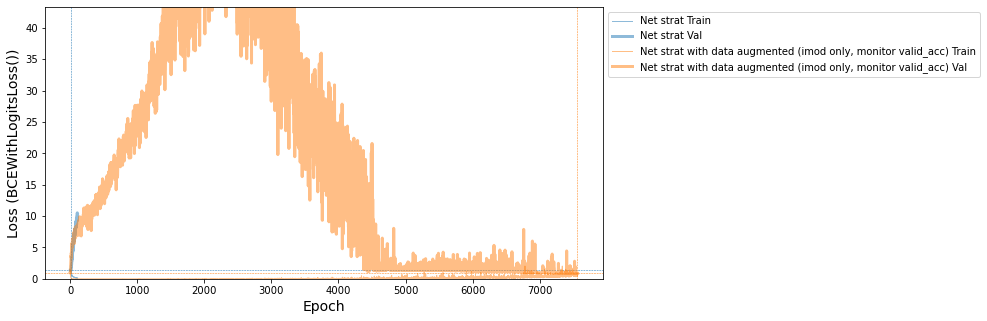

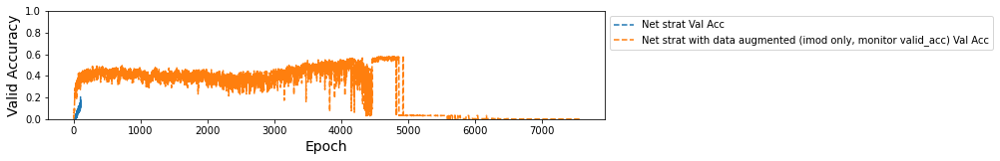

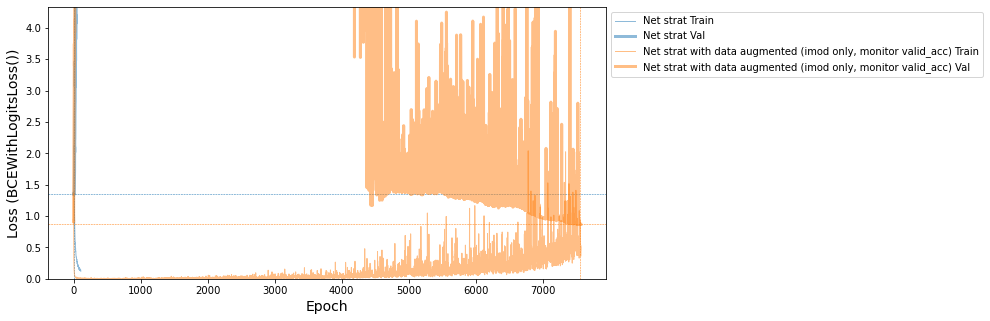

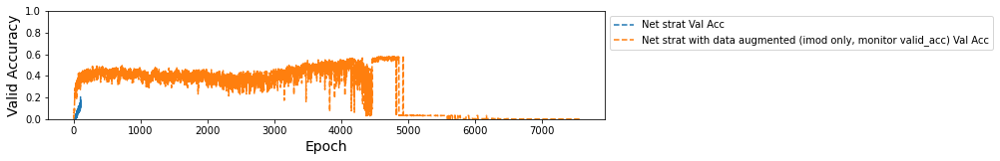

In [70]:
# paused at epoch 1139:
nets = [
    (net,'Net strat'),
    #(net_da,'Net strat with data augmented (imod only)'),
    (net_da,'Net strat with data augmented (imod only, monitor valid_acc)')
]

sk_loss_plot(nets,yscaler=50)
sk_loss_plot(nets,yscaler=5)

In [72]:
_ = view_cls_report(net_da,s['Xtrain_aug'],s['ytrain_aug'],imods_filt)
_ = view_cls_report(net_da,s['Xval'],s['yval'],imods_filt)

alt.VConcatChart(...)

alt.VConcatChart(...)

Running net da


/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:74: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


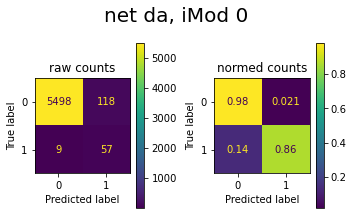

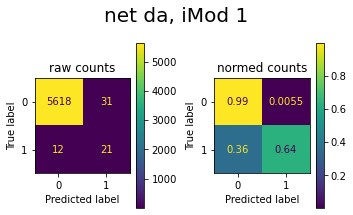

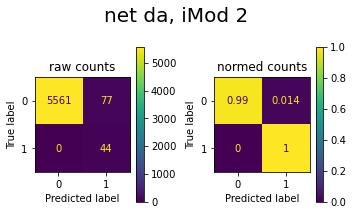

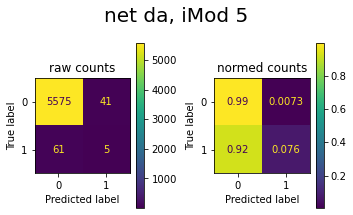

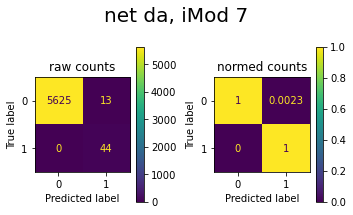

...

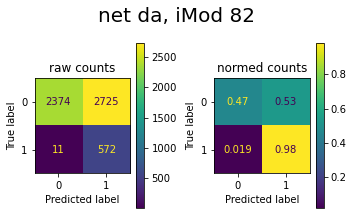

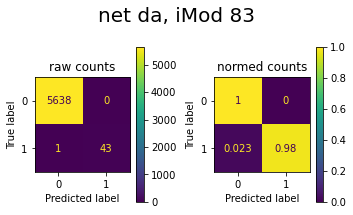

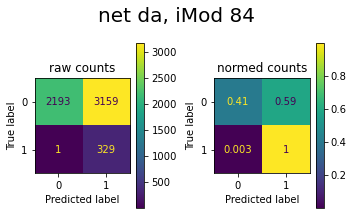

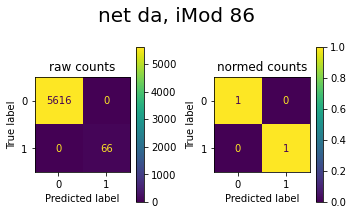

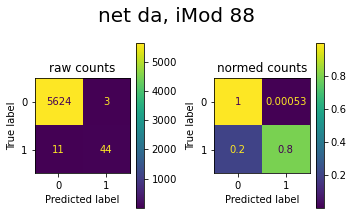

In [73]:
plot_confusion_multi([(net_da,'net da')], s['Xtrain_aug'],s['ytrain_aug'],imods_filt)

Running net da


/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:68: RuntimeWarning: invalid value encountered in long_scalars
/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:74: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


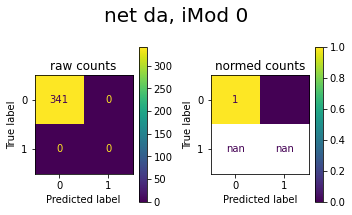

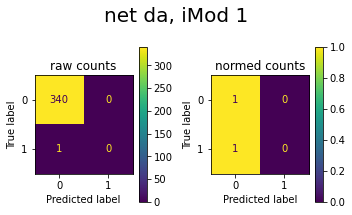

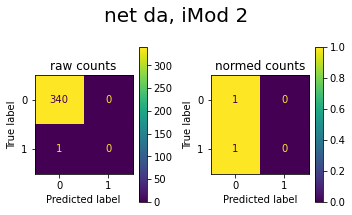

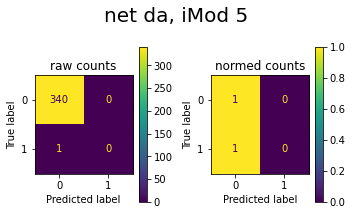

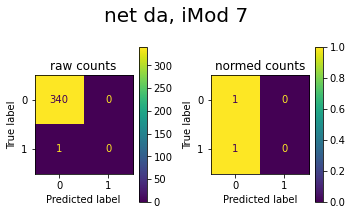

...

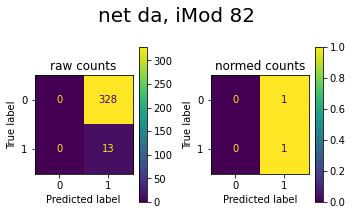

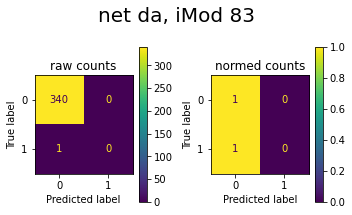

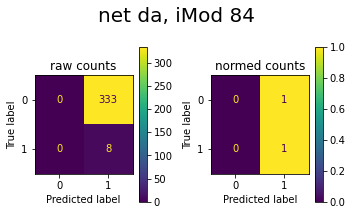

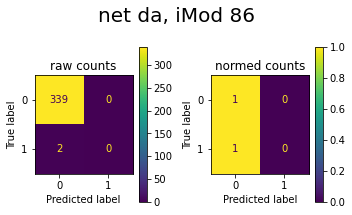

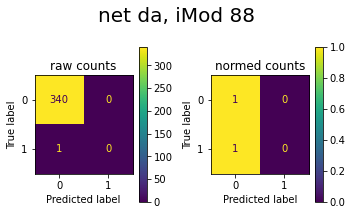

In [74]:
plot_confusion_multi([(net_da,'net da')], s['Xval'],s['yval'],imods_filt)

In [42]:
# keep going....?
net_da.partial_fit(s['Xtrain_aug'], s['ytrain_aug'], epochs=1000)


   1141        0.0072       0.3842       31.3915        0.7003
   1142        0.0051       0.4223       32.6982        0.5578
   1143        0.0057       0.3900       31.6012        0.5557
   1144        0.0028       0.4194       33.4488        0.5564
   1145        0.0061       0.4135       32.8809        0.5603
   1146        0.0044       0.4076       33.5810        0.5560
   1147        0.0059       0.4223       34.5863        0.5549
   1148        0.0037       0.4164       34.5083        0.5552
   1149        0.0052       0.4340       36.2930        0.5542
   1150        0.0037       0.3959       36.7714        0.5552
   1151        0.0135       0.3519       32.8108        0.5565
   1152        0.0047       0.4135       35.1851        0.5602
   1153        0.0031       0.4457       36.4452        0.5570
   1154        0.0061       0.4194       36.1530        0.5593
   1155        0.0121       0.3167       33.0944        0.5671
   1156        0.0070       0.3842       34.4426       

   1272        0.0032       0.3695       39.0537        0.5563
   1273        0.0087       0.3314       36.0751        0.5560
   1274        0.0082       0.3431       35.1942        0.5587
   1275        0.0038       0.3783       37.1259        0.5558
   1276        0.0036       0.3783       36.3266        0.5574
   1277        0.0021       0.4164       38.7159        0.5578
   1278        0.0024       0.4252       40.0743        0.5635
   1279        0.0084       0.3460       37.6558        0.5552
   1280        0.0052       0.3666       37.4121        0.5583
   1281        0.0050       0.3930       39.7098        0.5564
   1282        0.0045       0.3959       39.4768        0.5581
   1283        0.0073       0.3900       39.9639        0.5565
   1284        0.0026       0.4018       40.2825        0.5580
   1285        0.0015       0.4428       42.5535        0.5583
   1286        0.0031       0.4135       40.9273        0.5585
   1287        0.0069       0.3490       38.2475       

   1403        0.0045       0.3431       39.2019        0.5718
   1404        0.0042       0.3783       42.1411        0.5727
   1405        0.0058       0.3754       41.7937        0.5676
   1406        0.0069       0.3607       41.6725        0.5610
   1407        0.0071       0.3783       41.9621        0.5572
   1408        0.0124       0.3900       40.8838        0.5610
   1409        0.0055       0.3842       40.9093        0.5556
   1410        0.0179       0.3343       36.9732        0.5586
   1411        0.0083       0.3812       39.7183        0.5591
   1412        0.0048       0.3900       40.6391        0.5577
   1413        0.0042       0.3930       41.9665        0.5546
   1414        0.0026       0.3783       42.1413        0.5569
   1415        0.0024       0.3900       43.7865        0.5606
   1416        0.0018       0.4164       45.8080        0.5590
   1417        0.0025       0.4164       45.5168        0.5585
   1418        0.0029       0.3988       44.1878       

   1534        0.0187       0.3695       44.0319        0.5574
   1535        0.0100       0.3372       35.9683        0.5565
   1536        0.0155       0.3783       41.5084        0.5575
   1537        0.0085       0.3695       44.0510        0.5613
   1538        0.0052       0.4282       48.5899        0.5595
   1539        0.0160       0.4545       55.3409        0.5566
   1540        0.0077       0.3988       48.4080        0.5565
   1541        0.0081       0.3695       44.2344        0.5605
   1542        0.0117       0.3578       41.9234        0.5563
   1543        0.0057       0.3930       47.2298        0.5564
   1544        0.0097       0.4047       49.4305        0.5750
   1545        0.0084       0.4164       52.8738        0.5779
   1546        0.0053       0.4223       52.6792        0.5690
   1547        0.0072       0.3666       46.8535        0.5659
   1548        0.0164       0.3871       46.3964        0.5609
   1549        0.0045       0.4047       52.1196       

   1665        0.0052       0.3636       56.0396        0.5610
   1666        0.0129       0.2903       50.6415        0.5643
   1667        0.0112       0.3167       56.8134        0.5633
   1668        0.0115       0.2845       48.7925        0.5598
   1669        0.0236       0.3842       62.3848        0.5629
   1670        0.0426       0.3079       45.9105        0.5602
   1671        0.0067       0.3754       54.6841        0.5590
   1672        0.0143       0.3548       53.5931        0.5626
   1673        0.0078       0.3519       51.9913        0.5655
   1674        0.0061       0.3695       53.5768        0.5614
   1675        0.0398       0.3138       49.8945        0.5631
   1676        0.0274       0.3695       51.2311        0.5600
   1677        0.0290       0.3079       45.0645        0.5579
   1678        0.0151       0.3519       47.3545        0.5567
   1679        0.0198       0.3226       44.6412        0.5629
   1680        0.0111       0.3431       47.9461       

   1796        0.0326       0.2962       42.9521        0.5726
   1797        0.0088       0.3607       48.4294        0.5646
   1798        0.0052       0.3754       55.8320        0.5612
   1799        0.0051       0.3460       48.7075        0.5622
   1800        0.0144       0.3079       42.0430        0.5589
   1801        0.0072       0.3314       45.0809        0.5640
   1802        0.0036       0.3783       51.5382        0.5608
   1803        0.0091       0.3314       44.5058        0.5609
   1804        0.0200       0.3343       44.3544        0.5629
   1805        0.0080       0.3226       46.7027        0.5633
   1806        0.0143       0.3372       43.4269        0.5613
   1807        0.0049       0.3636       48.4345        0.5619
   1808        0.0035       0.3695       50.7216        0.5615
   1809        0.0057       0.3636       51.7993        0.5575
   1810        0.0037       0.3695       53.2179        0.5610
   1811        0.0142       0.2903       43.4589       

   1927        0.0056       0.4106       59.9121        0.5617
   1928        0.0028       0.4311       65.2720        0.5612
   1929        0.0026       0.4487       70.1568        0.5633
   1930        0.0218       0.3314       55.1454        0.5655
   1931        0.0050       0.3431       58.4622        0.5698
   1932        0.0078       0.3607       60.2070        0.5768
   1933        0.0102       0.3959       63.2007        0.5774
   1934        0.0028       0.4076       65.6329        0.5709
   1935        0.0076       0.3636       64.6474        0.5612
   1936        0.0114       0.3431       61.7988        0.5626
   1937        0.0102       0.4106       68.5985        0.5619
   1938        0.0060       0.4135       77.6378        0.5620
   1939        0.0222       0.3167       60.1524        0.5619
   1940        0.0172       0.3138       59.0031        0.5641
   1941        0.0088       0.3900       68.5794        0.5614
   1942        0.0122       0.3460       58.9052       

   2058        0.0035       0.3842       69.3604        0.5815
   2059        0.0049       0.3871       69.9201        0.5714
   2060        0.0033       0.3959       71.3214        0.5709
   2061        0.0722       0.3372       55.1760        0.5716
   2062        0.0150       0.3695       65.6999        0.5633
   2063        0.0222       0.2845       50.1433        0.5642
   2064        0.0209       0.3636       63.3746        0.5689
   2065        0.0287       0.3460       58.5461        0.5711
   2066        0.0117       0.3666       61.8574        0.5707
   2067        0.0129       0.3695       62.3853        0.5682
   2068        0.0171       0.3021       50.6993        0.5695
   2069        0.0295       0.3050       55.2773        0.5654
   2070        0.0086       0.3812       63.4420        0.5641
   2071        0.0173       0.3666       57.6477        0.5743
   2072        0.0193       0.3372       59.7443        0.5811
   2073        0.0148       0.3607       63.4347       

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=DNA_2CNN_2FC_Multi(
    (conv_net): Sequential(
      (0): Conv2d(1, 128, kernel_size=(4, 8), stride=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=(1, 3), stride=(1, 3), padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.2, inplace=False)
      (4): Conv2d(128, 64, kernel_size=(1, 8), stride=(1, 1))
      (5): ReLU()
      (6): Dropout(p=0.2, inplace=False)
      (7): Flatten()
      (8): Linear(in_features=5760, out_features=100, bias=True)
      (9): ReLU()
      (10): Linear(in_features=100, out_features=100, bias=True)
      (11): ReLU()
      (12): Linear(in_features=100, out_features=58, bias=True)
    )
  ),
)

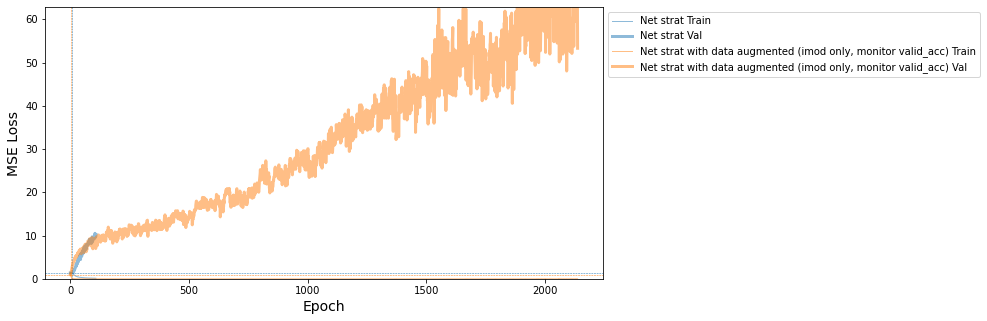

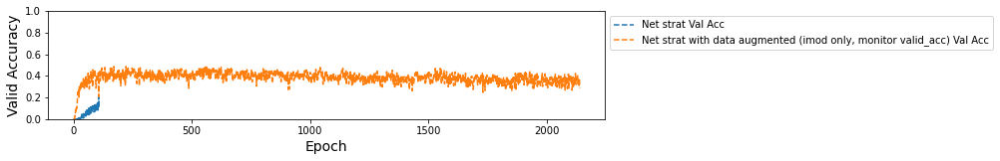

alt.VConcatChart(...)

alt.VConcatChart(...)

In [45]:
sk_loss_plot(nets,yscaler=70)

_ = view_cls_report(net_da,s['Xtrain_aug'],s['ytrain_aug'],imods_filt)
_ = view_cls_report(net_da,s['Xval'],s['yval'],imods_filt)

In [46]:
# keep going....?
net_da.partial_fit(s['Xtrain_aug'], s['ytrain_aug'], epochs=1000)


   2141        0.0388       0.2845       60.7588        0.7194
   2142        0.0227       0.2669       55.6885        0.5754
   2143        0.0079       0.3196       62.0600        0.5587
   2144        0.0046       0.3695       70.3513        0.5589
   2145        0.0072       0.3284       61.2826        0.5603
   2146        0.0385       0.3167       57.3973        0.5582
   2147        0.0099       0.3607       65.0007        0.5642
   2148        0.0070       0.3490       64.5626        0.5772
   2149        0.0048       0.3578       68.1138        0.5679
   2150        0.0039       0.3959       72.5416        0.5672
   2151        0.0143       0.3196       57.9313        0.5573
   2152        0.0126       0.3050       56.7049        0.5613
   2153        0.0105       0.3636       65.1674        0.5577
   2154        0.0069       0.3666       67.9823        0.5590
   2155        0.0042       0.3519       64.6501        0.5569
   2156        0.0117       0.3460       62.8861       

   2272        0.0077       0.3783       83.1971        0.5685
   2273        0.0219       0.2991       66.9879        0.5748
   2274        0.0184       0.3460       79.2346        0.5870
   2275        0.0123       0.3021       62.4091        0.5714
   2276        0.0091       0.3578       74.0723        0.5677
   2277        0.0059       0.3431       77.9092        0.5682
   2278        0.0359       0.2874       58.1215        0.5698
   2279        0.0121       0.3138       66.0895        0.5635
   2280        0.0345       0.3196       62.6893        0.5618
   2281        0.0086       0.3871       68.4401        0.5633
   2282        0.0163       0.3636       66.2893        0.5615
   2283        0.0080       0.3724       74.3590        0.5700
   2284        0.0174       0.3226       65.3552        0.5627
   2285        0.0242       0.2845       56.0231        0.5653
   2286        0.0225       0.2845       60.6307        0.5596
   2287        0.0374       0.2933       61.7927       

   2403        0.0049       0.3754       86.2678        0.5641
   2404        0.0174       0.3343       80.8927        0.5622
   2405        0.0356       0.3226       66.5130        0.5703
   2406        0.0255       0.2815       61.3303        0.5687
   2407        0.0250       0.3226       60.8476        0.5676
   2408        0.0153       0.3343       67.3458        0.5654
   2409        0.0144       0.3284       78.6933        0.5584
   2410        0.0099       0.3519       77.3627        0.5626
   2411        0.0081       0.3431       80.5007        0.5551
   2412        0.0085       0.3842       86.6240        0.5580
   2413        0.0304       0.1760       50.9104        0.5599
   2414        0.0183       0.3226       77.6699        0.5597
   2415        0.0326       0.2962       65.7584        0.5601
   2416        0.0266       0.3021       63.4787        0.5596
   2417        0.0054       0.3548       82.8294        0.5580
   2418        0.0069       0.3695       92.6339       

   2534        0.0197       0.3402       63.4237        0.5587
   2535        0.0166       0.3402       73.0075        0.5623
   2536        0.0163       0.3548       73.8266        0.5656
   2537        0.0100       0.3490       78.1456        0.5700
   2538        0.0183       0.3109       68.8950        0.5713
   2539        0.0140       0.3226       71.7813        0.5734
   2540        0.0082       0.3930       83.5647        0.5640
   2541        0.0208       0.3402       79.4329        0.5619
   2542        0.0059       0.3871       89.9999        0.5630
   2543        0.0146       0.3519       71.0673        0.5615
   2544        0.0208       0.3607       78.6180        0.5601
   2545        0.0129       0.3138       59.7424        0.5584
   2546        0.0077       0.3607       66.4290        0.5571
   2547        0.0096       0.3959       82.0837        0.5611
   2548        0.0045       0.4047       90.0468        0.5594
   2549        0.0183       0.3226       64.4354       

   2665        0.0348       0.3226       86.5930        0.5572
   2666        0.0481       0.3255       83.2001        0.5589
   2667        0.0206       0.2991       74.9518        0.5618
   2668        0.0352       0.2903       81.8384        0.5645
   2669        0.0124       0.3431       97.3871        0.5664
   2670        0.0847       0.3167       82.9730        0.5713
   2671        0.0078       0.3724       95.0595        0.5772
   2672        0.0262       0.4018      110.8304        0.5635
   2673        0.0226       0.3314       87.1375        0.5601
   2674        0.0530       0.2493       73.2003        0.5627
   2675        0.0189       0.2669       80.2754        0.5594
   2676        0.0157       0.3255       86.8212        0.5644
   2677        0.0075       0.3578      101.5953        0.5663
   2678        0.0330       0.2903       85.7173        0.5610
   2679        0.0107       0.3431       96.0414        0.5718
   2680        0.0085       0.3490       94.3463       

   2796        0.0145       0.3695       87.9738        0.5580
   2797        0.0352       0.2727       62.5362        0.5619
   2798        0.0251       0.3783       90.7587        0.5587
   2799        0.0242       0.3519      114.4617        0.5616
   2800        0.0072       0.3607       97.4500        0.5604
   2801        0.0128       0.3490      100.1114        0.5668
   2802        0.0230       0.3109       92.0846        0.5826
   2803        0.0420       0.2669       75.9642        0.5736
   2804        0.0146       0.3783       99.9012        0.5587
   2805        0.0196       0.3109       83.1126        0.5601
   2806        0.0388       0.3372       98.8950        0.5593
   2807        0.0243       0.3519      100.8969        0.5602
   2808        0.0411       0.3695      108.8059        0.5624
   2809        0.0316       0.2991       82.9061        0.5601
   2810        0.0146       0.3666       90.9672        0.5603
   2811        0.0126       0.3842       98.1192       

   2927        0.0297       0.2639       60.6365        0.5635
   2928        0.0213       0.3050       70.1300        0.5591
   2929        0.0136       0.3607       82.6414        0.5621
   2930        0.0314       0.3372       77.9089        0.5567
   2931        0.0523       0.3402       76.8523        0.5644
   2932        0.0499       0.3079       58.4894        0.5665
   2933        0.0449       0.2463       51.7672        0.5760
   2934        0.0326       0.2493       52.6528        0.5735
   2935        0.0319       0.2698       56.2455        0.5730
   2936        0.0280       0.3314       66.1528        0.5720
   2937        0.0255       0.3050       72.4890        0.5669
   2938        0.0144       0.3343       76.4947        0.5607
   2939        0.0504       0.2405       48.2139        0.5605
   2940        0.0209       0.3284       58.7536        0.5622
   2941        0.0355       0.2757       54.8980        0.5606
   2942        0.0213       0.3167       62.7134       

   3058        0.0256       0.2698       51.0887        0.5632
   3059        0.0409       0.3138       58.8791        0.5613
   3060        0.0139       0.3783       76.7925        0.5610
   3061        0.0099       0.3578       57.9263        0.5598
   3062        0.0566       0.1672       34.7459        0.5623
   3063        0.0356       0.2962       52.9575        0.5606
   3064        0.0171       0.3695       66.1130        0.5638
   3065        0.0438       0.3402       54.0170        0.5664
   3066        0.0072       0.3783       63.5361        0.5735
   3067        0.0084       0.3842       67.4186        0.5761
   3068        0.0171       0.3724       61.0116        0.5759
   3069        0.0110       0.3607       52.5969        0.5771
   3070        0.0765       0.2845       43.9085        0.5696
   3071        0.0390       0.3402       56.8065        0.5636
   3072        0.0857       0.2346       44.0069        0.5585
   3073        0.0224       0.3519       57.1283       

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=DNA_2CNN_2FC_Multi(
    (conv_net): Sequential(
      (0): Conv2d(1, 128, kernel_size=(4, 8), stride=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=(1, 3), stride=(1, 3), padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.2, inplace=False)
      (4): Conv2d(128, 64, kernel_size=(1, 8), stride=(1, 1))
      (5): ReLU()
      (6): Dropout(p=0.2, inplace=False)
      (7): Flatten()
      (8): Linear(in_features=5760, out_features=100, bias=True)
      (9): ReLU()
      (10): Linear(in_features=100, out_features=100, bias=True)
      (11): ReLU()
      (12): Linear(in_features=100, out_features=58, bias=True)
    )
  ),
)

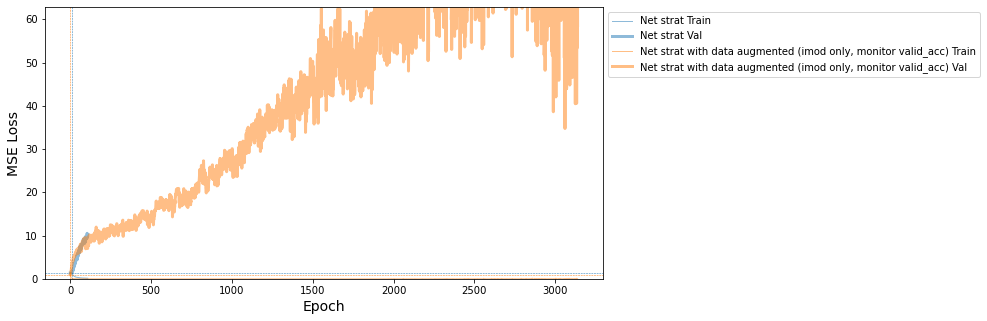

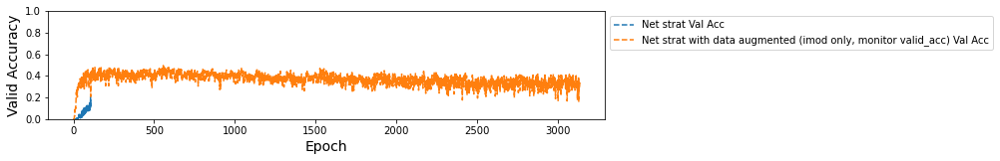

alt.VConcatChart(...)

alt.VConcatChart(...)

In [47]:
sk_loss_plot(nets,yscaler=70)

_ = view_cls_report(net_da,s['Xtrain_aug'],s['ytrain_aug'],imods_filt)
_ = view_cls_report(net_da,s['Xval'],s['yval'],imods_filt)

In [48]:
# keep going....?
net_da.partial_fit(s['Xtrain_aug'], s['ytrain_aug'], epochs=1000)


   3141        0.0432       0.2933       56.6462        0.7312
   3142        0.0215       0.3490       69.3734        0.5626
   3143        0.0077       0.3783       81.4297        0.5654
   3144        0.0256       0.2962       45.5186        0.5641
   3145        0.0661       0.3314       48.4851        0.5666
   3146        0.0201       0.3783       60.0368        0.5635
   3147        0.0317       0.2815       54.3937        0.5638
   3148        0.0206       0.3255       64.0275        0.5649
   3149        0.0128       0.4076       78.6458        0.5730
   3150        0.0363       0.2933       57.2432        0.5875
   3151        0.0239       0.3754       65.0369        0.5929
   3152        0.0114       0.4018       79.0435        0.5896
   3153        0.0278       0.3636       75.4192        0.5816
   3154        0.0778       0.2317       38.4417        0.5769
   3155        0.0407       0.3314       53.7922        0.5689
   3156        0.0306       0.3284       63.4172       

   3272        0.0483       0.3138       72.1907        0.5783
   3273        0.0242       0.3490       69.6771        0.5763
   3274        0.0107       0.3988       84.8453        0.5698
   3275        0.1074       0.1818       41.8055        0.5661
   3276        0.0461       0.2757       53.4939        0.5658
   3277        0.0584       0.2991       49.7853        0.5634
   3278        0.0184       0.3871       69.3232        0.5618
   3279        0.0361       0.3578       54.1617        0.5627
   3280        0.1277       0.1877       37.2282        0.5758
   3281        0.0839       0.2933       48.3912        0.5781
   3282        0.0516       0.3402       51.2224        0.5746
   3283        0.0295       0.3372       56.4072        0.5705
   3284        0.0185       0.3431       53.2530        0.5637
   3285        0.0719       0.3255       49.5245        0.5627
   3286        0.0159       0.3460       56.7541        0.5626
   3287        0.0217       0.3490       59.9043       

   3403        0.0107       0.3783       87.4925        0.5654
   3404        0.0688       0.2258       40.4103        0.5678
   3405        0.0346       0.3490       56.8210        0.5653
   3406        0.0111       0.3930       66.8122        0.5595
   3407        0.0226       0.4282       74.7709        0.5666
   3408        0.0136       0.3988       70.0153        0.5642
   3409        0.0111       0.3812       75.6199        0.5648
   3410        0.0131       0.3372       63.2947        0.5723
   3411        0.0208       0.3402       69.5975        0.5723
   3412        0.0113       0.3226       66.5795        0.5760
   3413        0.0135       0.3842       83.2254        0.5770
   3414        0.2502       0.3519       52.8628        0.5763
   3415        0.1187       0.2845       40.2581        0.5804
   3416        0.0467       0.3021       44.8456        0.5730
   3417        0.0160       0.3695       55.9738        0.5636
   3418        0.0175       0.3284       49.2985       

   3534        0.0225       0.3812       48.1067        0.5653
   3535        0.0129       0.4047       52.5323        0.5670
   3536        0.0495       0.3226       43.3830        0.5624
   3537        0.0720       0.2903       54.3954        0.5654
   3538        0.0198       0.3548       62.6712        0.5667
   3539        0.0289       0.3402       51.9617        0.5659
   3540        0.0445       0.2757       34.0636        0.5645
   3541        0.0272       0.3607       48.6733        0.5671
   3542        0.0228       0.4076       53.0229        0.5722
   3543        0.0123       0.3666       56.8826        0.5746
   3544        0.0410       0.3372       45.8456        0.5750
   3545        0.0100       0.3900       56.3075        0.5670
   3546        0.0712       0.3050       34.9128        0.5681
   3547        0.0551       0.3109       37.6874        0.5636
   3548        0.0233       0.3050       44.6234        0.5636
   3549        0.0204       0.3431       48.3006       

   3665        0.0265       0.3900       40.9746        0.5648
   3666        0.0621       0.4018       46.5479        0.5699
   3667        0.0290       0.3988       43.2667        0.5700
   3668        0.0309       0.3607       37.1643        0.5675
   3669        0.0750       0.3724       35.0197        0.5685
   3670        0.0306       0.2903       33.6483        0.5679
   3671        0.0300       0.3578       52.7045        0.5677
   3672        0.0649       0.3930       36.2649        0.5698
   3673        0.0663       0.3050       33.2776        0.5794
   3674        0.0458       0.3021       32.6616        0.5815
   3675        0.0149       0.3724       44.0818        0.5865
   3676        0.0350       0.3754       40.7380        0.5710
   3677        0.0293       0.3284       36.2316        0.5702
   3678        0.0143       0.3607       47.8447        0.5624
   3679        0.0072       0.3666       47.8063        0.5675
   3680        0.0117       0.3900       41.9446       

   3796        0.0219       0.4487       45.3140        0.5952
   3797        0.0495       0.3724       44.0953        0.5910
   3798        0.0151       0.4223       54.6060        0.5806
   3799        0.0207       0.4340       48.1295        0.5810
   3800        0.0229       0.4282       50.5632        0.5864
   3801        0.0412       0.3607       38.9095        0.5962
   3802        0.0127       0.4340       46.2425        0.6012
   3803        0.0282       0.4457       55.5217        0.6004
   3804        0.1007       0.3372       30.4369        0.6004
   3805        0.0466       0.2434       44.6665        0.5852
   3806        0.0356       0.4164       39.2903        0.5956
   3807        0.0196       0.4399       50.7499        0.5941
   3808        0.0237       0.3783       37.0368        0.5982
   3809        0.0199       0.4164       45.0668        0.5974
   3810        0.0251       0.4311       49.2266        0.5984
   3811        0.0164       0.4604       40.2001       

   3927        0.0253       0.4164       41.0845        0.5938
   3928        0.0247       0.4194       43.0194        0.5993
   3929        0.0331       0.4223       27.8468        0.6037
   3930        0.0406       0.4370       35.7353        0.6017
   3931        0.0307       0.4457       41.8960        0.6026
   3932        0.0343       0.3724       31.7546        0.6027
   3933        0.0378       0.4223       38.8770        0.6013
   3934        0.0126       0.4663       38.4848        0.5973
   3935        0.0214       0.4487       42.6974        0.5926
   3936        0.0343       0.3930       47.1991        0.5914
   3937        0.0129       0.4223       45.9550        0.5931
   3938        0.0399       0.3490       23.8116        0.5853
   3939        0.0491       0.4457       36.4265        0.5889
   3940        0.0184       0.5132       42.8557     +  0.5954
   3941        0.0160       0.4897       51.8956        0.5897
   3942        0.0166       0.4487       53.5229       

   4057        0.0434       0.4399       30.4375        0.5830
   4058        0.0163       0.4751       34.9544        0.5823
   4059        0.0564       0.4282       23.9846        0.5713
   4060        0.0587       0.4604       29.6955        0.5692
   4061        0.0359       0.4604       35.7415        0.5688
   4062        0.0412       0.3636       20.5782        0.5660
   4063        0.0371       0.0909       25.8914        0.5787
   4064        0.0231       0.3842       36.8424        0.5839
   4065        0.0132       0.4106       42.3422        0.5813
   4066        0.0317       0.4487       37.0891        0.5732
   4067        0.0726       0.2757       21.7621        0.5737
   4068        0.0337       0.4252       31.7409        0.5695
   4069        0.0156       0.4516       38.3676        0.5627
   4070        0.0136       0.4839       41.4691        0.5680
   4071        0.0129       0.4897       39.6695        0.5700
   4072        0.0211       0.4956       27.7376       

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=DNA_2CNN_2FC_Multi(
    (conv_net): Sequential(
      (0): Conv2d(1, 128, kernel_size=(4, 8), stride=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=(1, 3), stride=(1, 3), padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.2, inplace=False)
      (4): Conv2d(128, 64, kernel_size=(1, 8), stride=(1, 1))
      (5): ReLU()
      (6): Dropout(p=0.2, inplace=False)
      (7): Flatten()
      (8): Linear(in_features=5760, out_features=100, bias=True)
      (9): ReLU()
      (10): Linear(in_features=100, out_features=100, bias=True)
      (11): ReLU()
      (12): Linear(in_features=100, out_features=58, bias=True)
    )
  ),
)

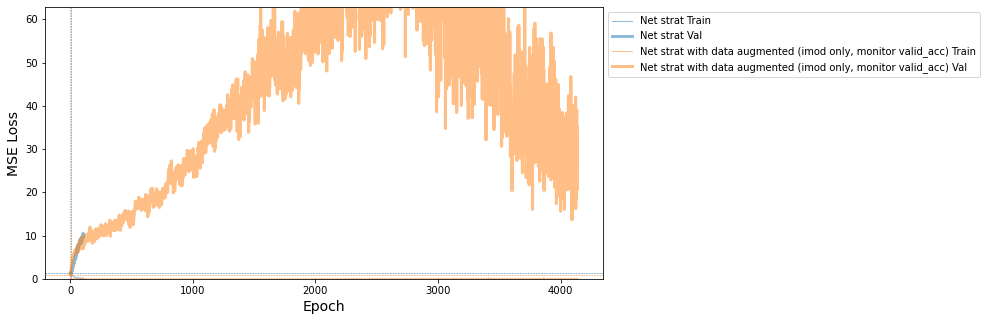

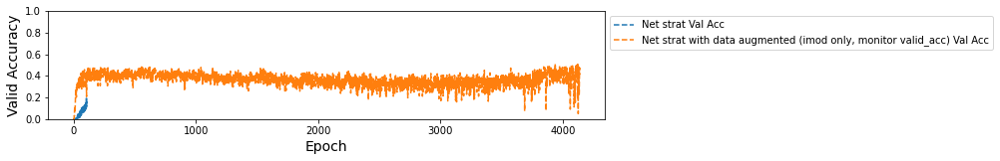

alt.VConcatChart(...)

alt.VConcatChart(...)

In [49]:
sk_loss_plot(nets,yscaler=70)

_ = view_cls_report(net_da,s['Xtrain_aug'],s['ytrain_aug'],imods_filt)
_ = view_cls_report(net_da,s['Xval'],s['yval'],imods_filt)

In [50]:
# keep going....?
net_da.partial_fit(s['Xtrain_aug'], s['ytrain_aug'], epochs=1000)

   4141        0.0146       0.4575       31.9963     +  0.7237
   4142        0.0302       0.4839       33.9492     +  0.5761
   4143        0.0118       0.4516       34.5162        0.5725
   4144        0.0216       0.4018       27.1694        0.5678
   4145        0.0264       0.4633       27.6750        0.5695
   4146        0.0231       0.4575       28.1133        0.5706
   4147        0.0311       0.3754       23.7524        0.5720
   4148        0.0305       0.4575       40.9912        0.5680
   4149        0.0677       0.4164       26.0604        0.5694
   4150        0.0195       0.4194       29.6625        0.5736
   4151        0.0130       0.3900       32.5727        0.5811
   4152        0.0407       0.4663       41.3614        0.5796
   4153        0.0496       0.3402       24.5255        0.5773
   4154        0.0215       0.4575       31.1185        0.5711
   4155        0.0161       0.4018       37.3502        0.5714
   4156        0.0188       0.4575       31.8190       

   4271        0.1358       0.3724       22.4985        0.5863
   4272        0.0329       0.3959       24.6001        0.5882
   4273        0.0248       0.2522       22.7156        0.5933
   4274        0.0464       0.0704       19.7397        0.5884
   4275        0.0234       0.1408       23.0306        0.5882
   4276        0.0190       0.2023       23.9400        0.5872
   4277        0.0290       0.2463       25.4975        0.5859
   4278        0.0214       0.2522       28.5587        0.5847
   4279        0.0397       0.3226       29.9174        0.5925
   4280        0.0665       0.1232       19.4196        0.5961
   4281        0.0310       0.3109       25.1448        0.5967
   4282        0.0178       0.3695       28.9851        0.5941
   4283        0.1201       0.0381       20.7159        0.5943
   4284        0.0458       0.0880       18.3106        0.5968
   4285        0.0228       0.3255       22.6925        0.5901
   4286        0.0477       0.3167       20.5163       

   4402        0.0197       0.4457       22.0184        0.5682
   4403        0.0122       0.5044       27.3643        0.5625
   4404        0.0098       0.5103       27.9212        0.5675
   4405        0.0102       0.4956       29.5475        0.5681
   4406        0.0198       0.4927       27.7279        0.5678
   4407        0.0098       0.4839       26.4911        0.5664
   4408        0.0182       0.4927       30.1869        0.5715
   4409        0.2576       0.2287       14.5134        0.5752
   4410        0.1237       0.0762       16.1691        0.5764
   4411        0.0454       0.3812       21.0398        0.5762
   4412        0.0227       0.4428       24.1273        0.5665
   4413        0.0146       0.4839       27.3955        0.5711
   4414        0.0171       0.4809       24.3662        0.5648
   4415        0.0260       0.5015       25.5154        0.5650
   4416        0.0214       0.3930       24.0890        0.5738
   4417        0.0162       0.3490       18.7436       

   4532        0.1561       0.2199       11.6832        0.5647
   4533        0.0492       0.3431       21.3403        0.5688
   4534        0.0791       0.3167       15.9938        0.5711
   4535        0.0215       0.4663       20.9931        0.5808
   4536        0.0219       0.4780       23.6021        0.5846
   4537        0.2149       0.1994       12.5698        0.5815
   4538        0.0453       0.3284       17.1962        0.5629
   4539        0.0890       0.3079       13.0833        0.5681
   4540        0.0361       0.4164       16.7466        0.5694
   4541        0.0199       0.4370       18.8570        0.5651
   4542        0.0342       0.4575       17.7606        0.5674
   4543        0.1058       0.4018       18.2360        0.5681
   4544        0.0339       0.4194       15.7455        0.5718
   4545        0.0714       0.2405        9.5751        0.5697
   4546        0.0350       0.5015       18.7185        0.5646
   4547        0.0150       0.5073       21.3936       

   4663        0.0852       0.0352       15.6923        0.5757
   4664        0.1682       0.0293       11.9480        0.5746
   4665        0.1568       0.0293       13.6720        0.5878
   4666        0.0772       0.0440       16.1738        0.5885
   4667        0.1037       0.0411       16.2487        0.5851
   4668        0.0504       0.0293        9.9271        0.5755
   4669        0.0507       0.0352       15.6061        0.5765
   4670        0.0546       0.0352       17.9045        0.5834
   4671        0.0533       0.0440       14.5476        0.5726
   4672        0.0328       0.0469       17.8950        0.5674
   4673        0.0567       0.0674       21.4179        0.5707
   4674        0.0737       0.0293        6.7372        0.5688
   4675        0.0610       0.0352       19.0368        0.5717
   4676        0.0958       0.0235        4.8780        0.5683
   4677        0.0771       0.0499       16.3764        0.5673
   4678        0.0231       0.0674       20.1741       

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=DNA_2CNN_2FC_Multi(
    (conv_net): Sequential(
      (0): Conv2d(1, 128, kernel_size=(4, 8), stride=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=(1, 3), stride=(1, 3), padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.2, inplace=False)
      (4): Conv2d(128, 64, kernel_size=(1, 8), stride=(1, 1))
      (5): ReLU()
      (6): Dropout(p=0.2, inplace=False)
      (7): Flatten()
      (8): Linear(in_features=5760, out_features=100, bias=True)
      (9): ReLU()
      (10): Linear(in_features=100, out_features=100, bias=True)
      (11): ReLU()
      (12): Linear(in_features=100, out_features=58, bias=True)
    )
  ),
)

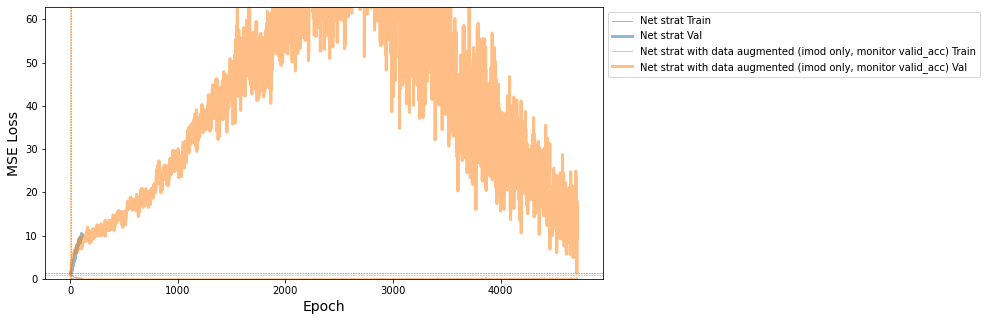

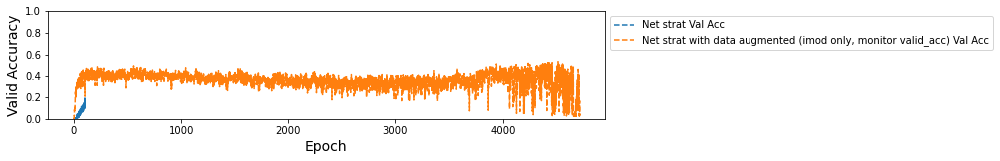

alt.VConcatChart(...)

alt.VConcatChart(...)

In [51]:
sk_loss_plot(nets,yscaler=70)

_ = view_cls_report(net_da,s['Xtrain_aug'],s['ytrain_aug'],imods_filt)
_ = view_cls_report(net_da,s['Xval'],s['yval'],imods_filt)

In [52]:
# keep going....?
net_da.partial_fit(s['Xtrain_aug'], s['ytrain_aug'], epochs=1000)

   4719        0.0469       0.3431       18.4938        0.7484
   4720        0.0321       0.4692       21.1634     +  0.5775
   4721        0.0841       0.3607       14.9053        0.5722
   4722        0.0735       0.2229       13.1578        0.5724
   4723        0.0278       0.2991       14.5363        0.5681
   4724        0.0564       0.4282       18.8563        0.5677
   4725        0.0463       0.0645       10.3735        0.5773
   4726        0.0523       0.2639       16.5593        0.5844
   4727        0.2579       0.0499        8.4625        0.5777
   4728        0.0997       0.0352       10.9082        0.5759
   4729        0.0305       0.3519       20.7035        0.5702
   4730        0.0656       0.3490       18.5013        0.5675
   4731        0.0814       0.2346       13.0239        0.5686
   4732        0.0429       0.0762       12.2636        0.5637
   4733        0.0252       0.3079       18.7527        0.5704
   4734        0.0191       0.3724       22.3673       

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=DNA_2CNN_2FC_Multi(
    (conv_net): Sequential(
      (0): Conv2d(1, 128, kernel_size=(4, 8), stride=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=(1, 3), stride=(1, 3), padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.2, inplace=False)
      (4): Conv2d(128, 64, kernel_size=(1, 8), stride=(1, 1))
      (5): ReLU()
      (6): Dropout(p=0.2, inplace=False)
      (7): Flatten()
      (8): Linear(in_features=5760, out_features=100, bias=True)
      (9): ReLU()
      (10): Linear(in_features=100, out_features=100, bias=True)
      (11): ReLU()
      (12): Linear(in_features=100, out_features=58, bias=True)
    )
  ),
)

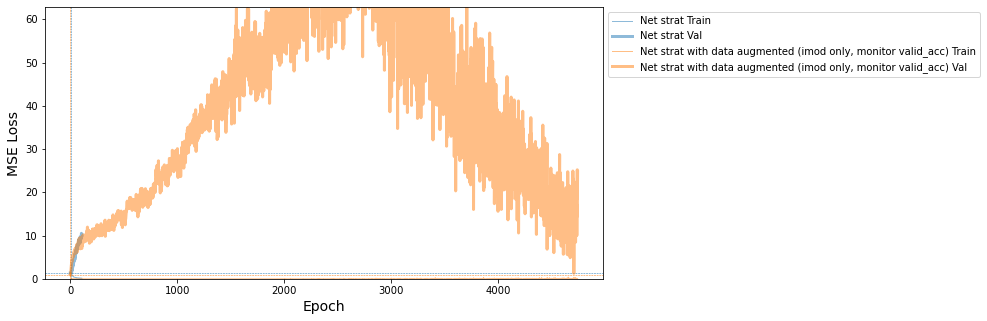

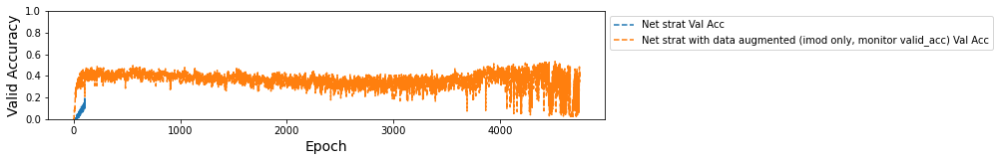

alt.VConcatChart(...)

alt.VConcatChart(...)

In [53]:
sk_loss_plot(nets,yscaler=70)

_ = view_cls_report(net_da,s['Xtrain_aug'],s['ytrain_aug'],imods_filt)
_ = view_cls_report(net_da,s['Xval'],s['yval'],imods_filt)

In [54]:
# keep going....?
net_da.partial_fit(s['Xtrain_aug'], s['ytrain_aug'], epochs=1000)

   4748        0.1229       0.3343       14.0650     +  0.7115
   4749        0.0811       0.1026       14.0389        0.5823
   4750        0.0743       0.4633       21.6047     +  0.5838
   4751        0.0321       0.3167       15.9124        0.5844
   4752        0.0261       0.4663       17.9046     +  0.5776
   4753        0.0272       0.2375       12.5035        0.5679
   4754        0.0412       0.4516       15.3701        0.5694
   4755        0.0290       0.4370       17.0933        0.5699
   4756        0.0961       0.2757       13.7206        0.5657
   4757        0.0520       0.1848       18.9594        0.5679
   4758        0.0353       0.2639       20.0257        0.5666
   4759        0.0748       0.0440        8.3466        0.5656
   4760        0.1569       0.0821       11.6146        0.5676
   4761        0.0745       0.3724       20.2886        0.5720
   4762        0.0597       0.1320       11.5159        0.5668
   4763        0.1195       0.2287       17.1705       

   4878        0.0161       0.4457       16.7511        0.5840
   4879        0.0529       0.4047       13.3150        0.5768
   4880        0.0941       0.4692       17.4321        0.5754
   4881        0.0578       0.2082        9.6128        0.5668
   4882        0.0927       0.2933       11.2176        0.5661
   4883        0.0764       0.2903       11.1066        0.5696
   4884        0.0652       0.3021       11.4275        0.5677
   4885        0.0456       0.4575       19.0266        0.5691
   4886        0.0378       0.1613        8.3228        0.5690
   4887        0.0975       0.0293        4.0898        0.5694
   4888        0.1402       0.2375        9.0050        0.5694
   4889        0.0804       0.3783       19.5792        0.5704
   4890        0.0392       0.1056        9.0082        0.5681
   4891        0.0420       0.3314       13.2793        0.5703
   4892        0.0255       0.4223       16.3825        0.5674
   4893        0.0169       0.4340       17.0096       

   5009        0.0973       0.1114        6.0136        0.5727
   5010        0.0771       0.2463        7.3428        0.5709
   5011        0.1242       0.3343        9.3524        0.5674
   5012        0.0386       0.1642        6.7449        0.5757
   5013        0.0953       0.1760        5.5588        0.5769
   5014        0.0567       0.4692       13.8797        0.5768
   5015        0.1262       0.1701        4.6045        0.5873
   5016        0.1355       0.2258        7.5830        0.5950
   5017        0.0834       0.1584        6.3031        0.5798
   5018        0.0410       0.4252       14.7773        0.5797
   5019        0.0573       0.3255        9.6447        0.5671
   5020        0.0528       0.3783       11.3027        0.5728
   5021        0.0903       0.3343        8.7400        0.5695
   5022        0.0502       0.4340       12.5876        0.5680
   5023        0.0589       0.2581       17.1110        0.5677
   5024        0.0894       0.1818       10.3231       

   5140        0.0517       0.2522       16.6015        0.5696
   5141        0.1034       0.0381        3.7656        0.5699
   5142        0.1249       0.0762        6.7801        0.5766
   5143        0.0447       0.1349       10.6481        0.5706
   5144        0.2128       0.1730        7.9784        0.5711
   5145        0.1334       0.1056        6.1339        0.5736
   5146        0.0688       0.1906        8.3564        0.5724
   5147        0.1055       0.3167       11.6502        0.5700
   5148        0.0402       0.3930       16.5462        0.5686
   5149        0.0865       0.0997        5.8240        0.5712
   5150        0.0297       0.3021       10.3622        0.5661
   5151        0.1248       0.0587        4.7948        0.5715
   5152        0.2375       0.0352        1.4829        0.5709
   5153        0.1016       0.0997        5.9451        0.5744
   5154        0.2011       0.1144        6.5533        0.5858
   5155        0.1427       0.0323        2.9368       

   5271        0.0871       0.0528        3.6690        0.5682
   5272        0.1363       0.0440        1.3380        0.5712
   5273        0.1391       0.0557        4.2742        0.5685
   5274        0.1394       0.0499        3.5912        0.5812
   5275        0.0631       0.0264        7.2915        0.5695
   5276        0.0655       0.0293        8.1454        0.5697
   5277        0.0479       0.0440        7.6048        0.5673
   5278        0.1196       0.0323        1.5846        0.5674
   5279        0.1329       0.0293        5.3315        0.5726
   5280        0.0573       0.0411        7.3886        0.5689
   5281        0.0988       0.0293        4.9164        0.5700
   5282        0.0371       0.0440        6.1346        0.5693
   5283        0.0353       0.0968       13.9819        0.5752
   5284        0.0878       0.0440        7.5559        0.5776
   5285        0.1021       0.0293        1.4208        0.5806
   5286        0.0768       0.0293        1.5296       

   5402        0.0447       0.0352        2.9889        0.5701
   5403        0.0601       0.0293        1.3799        0.5688
   5404        0.0558       0.0293        1.4501        0.5658
   5405        0.0445       0.0293        1.3787        0.5722
   5406        0.0414       0.0293        1.3652        0.5745
   5407        0.0455       0.0293        1.4037        0.5674
   5408        0.0381       0.0293        1.4085        0.5694
   5409        0.0361       0.0293        1.4243        0.5693
   5410        0.2330       0.0323        1.2955        0.5669
   5411        0.1138       0.0293        1.4715        0.5673
   5412        0.0991       0.0293        1.4478        0.5772
   5413        0.0693       0.0293        1.5751        0.5811
   5414        0.0584       0.0352        2.1278        0.5896
   5415        0.0974       0.0323        1.5058        0.5822
   5416        0.0846       0.0323        1.3026        0.5796
   5417        0.0835       0.0293        1.3861       

   5533        0.1949       0.0293        1.9134        0.5829
   5534        0.1192       0.0323        1.3545        0.5842
   5535        0.1186       0.0293        1.3594        0.5843
   5536        0.2826       0.0293        1.3490        0.5768
   5537        0.1428       0.0323        1.3529        0.5665
   5538        0.0603       0.0323        1.6552        0.5703
   5539        0.0521       0.0323        2.0840        0.5716
   5540        0.0906       0.0293        2.0138        0.5710
   5541        0.1150       0.0293        1.6846        0.5697
   5542        0.0828       0.0293        1.3610        0.5752
   5543        0.0901       0.0264        1.3622        0.5799
   5544        0.0651       0.0293        1.3708        0.5827
   5545        0.0586       0.0293        1.3714        0.5808
   5546        0.1906       0.0323        1.3620        0.5724
   5547        0.1081       0.0323        1.4478        0.5690
   5548        0.0814       0.0323        1.3633       

   5664        0.1763       0.0323        1.4291        0.5694
   5665        0.1458       0.0323        1.4609        0.5735
   5666        0.0881       0.0323        1.3799        0.5742
   5667        0.0698       0.0323        1.3853        0.5706
   5668        0.0604       0.0293        1.4241        0.5734
   5669        0.0601       0.0293        1.4281        0.5733
   5670        0.0446       0.0293        1.4341        0.5703
   5671        0.0915       0.0293        1.3558        0.5850
   5672        0.1668       0.0323        1.3593        0.5781
   5673        0.1311       0.0323        1.4450        0.5904
   5674        0.2239       0.0323        1.6949        0.5912
   5675        0.1717       0.0323        1.6665        0.5870
   5676        0.1435       0.0323        1.6192        0.5907
   5677        0.2829       0.0293        1.6826        0.5816
   5678        0.2060       0.0323        1.3793        0.5705
   5679        0.1393       0.0323        1.3485       

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=DNA_2CNN_2FC_Multi(
    (conv_net): Sequential(
      (0): Conv2d(1, 128, kernel_size=(4, 8), stride=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=(1, 3), stride=(1, 3), padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.2, inplace=False)
      (4): Conv2d(128, 64, kernel_size=(1, 8), stride=(1, 1))
      (5): ReLU()
      (6): Dropout(p=0.2, inplace=False)
      (7): Flatten()
      (8): Linear(in_features=5760, out_features=100, bias=True)
      (9): ReLU()
      (10): Linear(in_features=100, out_features=100, bias=True)
      (11): ReLU()
      (12): Linear(in_features=100, out_features=58, bias=True)
    )
  ),
)

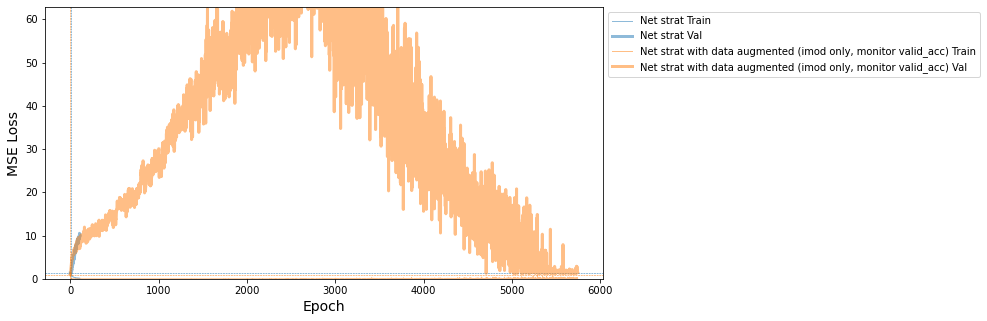

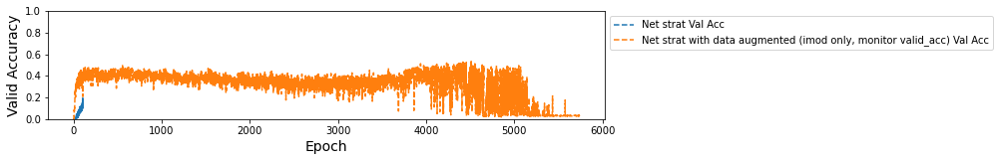

alt.VConcatChart(...)

alt.VConcatChart(...)

In [55]:
sk_loss_plot(nets,yscaler=70)

_ = view_cls_report(net_da,s['Xtrain_aug'],s['ytrain_aug'],imods_filt)
_ = view_cls_report(net_da,s['Xval'],s['yval'],imods_filt)

In [64]:
# apparently i think DNA_2CNN_2FC_Multi should still work for multi-label classification
valid_ds = Dataset(s['Xval'], s['yval'])
# weight by the distribution of examples in AUGmented training set?
bce_pos_weights = get_pos_weights(s['ytrain_aug'])

net_da2 = NeuralNetClassifier(
    m.DNA_2CNN_2FC_Multi, # my pytorch model
    criterion=torch.nn.BCEWithLogitsLoss(pos_weight=bce_pos_weights),
    train_split=predefined_split(valid_ds), # stratified =True
    module__seq_len=300, # pass arg to pytorch model
    module__n_tasks=y.shape[1],
    module__num_filters1=64,
    module__num_filters2=32,
    module__kernel_size1=8,
    module__kernel_size2=4,
    module__conv_pool_size1=3, 
    module__conv_pool_size2=1,
    module__fc_node_num1 = 50,
    module__fc_node_num2 = 100,
    module__dropout1 = 0.2,
    module__dropout2 = 0.2,
    max_epochs=8000,
    lr=0.0001,
    device=DEVICE,  # uncomment this to train with CUDA
     callbacks=[
         #EarlyStopping(patience=300),
         EarlyStopping(patience=3000,monitor='valid_acc',lower_is_better=False),
         #Checkpoint(load_best=True,monitor='valid_acc_best'),
         Checkpoint(monitor='valid_acc_best'),
         GradientNormClipping()
     ],
    optimizer=torch.optim.Adam,
    #optimizer=torch.optim.SGD,
    iterator_train__shuffle=True,
    #train_split=predefined_split(valid_ds)
    #train_split=None
)

0| pos:66.0  neg:5616.0
val: tensor(85.0909, dtype=torch.float64)
1| pos:33.0  neg:5649.0
val: tensor(171.1818, dtype=torch.float64)
2| pos:44.0  neg:5638.0
val: tensor(128.1363, dtype=torch.float64)
3| pos:66.0  neg:5616.0
val: tensor(85.0909, dtype=torch.float64)
4| pos:44.0  neg:5638.0
val: tensor(128.1363, dtype=torch.float64)
5| pos:66.0  neg:5616.0
val: tensor(85.0909, dtype=torch.float64)
6| pos:55.0  neg:5627.0
val: tensor(102.3091, dtype=torch.float64)
7| pos:55.0  neg:5627.0
val: tensor(102.3091, dtype=torch.float64)
8| pos:44.0  neg:5638.0
val: tensor(128.1363, dtype=torch.float64)
9| pos:55.0  neg:5627.0
val: tensor(102.3091, dtype=torch.float64)
10| pos:176.0  neg:5506.0
val: tensor(31.2841, dtype=torch.float64)
11| pos:77.0  neg:5605.0
val: tensor(72.7922, dtype=torch.float64)
12| pos:77.0  neg:5605.0
val: tensor(72.7922, dtype=torch.float64)
13| pos:88.0  neg:5594.0
val: tensor(63.5682, dtype=torch.float64)
14| pos:297.0  neg:5385.0
val: tensor(18.1313, dtype=torch.float

In [65]:
net_da2.fit(s['Xtrain_aug'], s['ytrain_aug'])


  epoch    train_loss    valid_acc    valid_loss    cp     dur
-------  ------------  -----------  ------------  ----  ------
      1        1.3581       0.0000        0.9352     +  0.5108
      2        1.3552       0.0000        0.9347        0.3763
      3        1.3495       0.0000        0.9335        0.3764
      4        1.3383       0.0000        0.9311        0.3758
      5        1.3210       0.0000        0.9263        0.3759
      6        1.2903       0.0000        0.9177        0.3757
      7        1.2415       0.0000        0.8998        0.3750
      8        1.1698       0.0000        0.8815        0.3744
      9        1.0721       0.0000        0.8734        0.3743
     10        0.9718       0.0000        0.8779        0.3743
     11        0.8712       0.0029        0.8900     +  0.3744
     12        0.7889       0.0029        0.9143        0.3744
     13        0.7156       0.0029        0.9458        0.3744
     14        0.6572       0.0029        0.9763       

    110        0.0422       0.1848        3.7921        0.3752
    111        0.0406       0.2287        3.9607     +  0.3748
    112        0.0412       0.1730        3.8956        0.3752
    113        0.0400       0.1906        3.8970        0.3759
    114        0.0395       0.2141        3.9906        0.3737
    115        0.0394       0.1906        3.9643        0.3745
    116        0.0376       0.1994        4.0704        0.3739
    117        0.0368       0.2375        4.0632     +  0.3732
    118        0.0372       0.1906        4.0050        0.3728
    119        0.0346       0.2258        4.1471        0.3727
    120        0.0346       0.2434        4.1227     +  0.3743
    121        0.0347       0.2493        4.1501     +  0.3755
    122        0.0349       0.2405        4.1925        0.3743
    123        0.0322       0.2581        4.1980     +  0.3747
    124        0.0310       0.2170        4.2151        0.3747
    125        0.0331       0.2346        4.1984       

    230        0.0059       0.3754        6.0209        0.3743
    231        0.0061       0.4194        6.0235     +  0.3756
    232        0.0054       0.3636        6.0162        0.3761
    233        0.0057       0.4164        6.1466        0.3753
    234        0.0049       0.4047        6.1265        0.3754
    235        0.0052       0.4106        6.1883        0.3755
    236        0.0062       0.4076        6.1422        0.3755
    237        0.0049       0.4223        6.2125     +  0.3756
    238        0.0052       0.3959        6.1628        0.3756
    239        0.0043       0.3842        6.2477        0.3758
    240        0.0044       0.4252        6.2991     +  0.3753
    241        0.0044       0.4047        6.3375        0.3755
    242        0.0046       0.4047        6.1914        0.3746
    243        0.0052       0.4106        6.1681        0.3742
    244        0.0041       0.4252        6.3372        0.3756
    245        0.0044       0.3900        6.2684       

    355        0.0014       0.4692        7.5568        0.3758
    356        0.0018       0.4809        7.5538     +  0.3759
    357        0.0014       0.4721        7.5295        0.3767
    358        0.0014       0.4663        7.5052        0.3761
    359        0.0013       0.4751        7.5416        0.3760
    360        0.0014       0.4663        7.5354        0.3759
    361        0.0014       0.4633        7.4816        0.3761
    362        0.0013       0.4604        7.5500        0.3759
    363        0.0014       0.4604        7.6528        0.3754
    364        0.0014       0.4721        7.5601        0.3749
    365        0.0014       0.4516        7.5662        0.3757
    366        0.0013       0.4839        7.6806     +  0.3754
    367        0.0012       0.4545        7.5752        0.3754
    368        0.0010       0.4780        7.6396        0.3754
    369        0.0011       0.4751        7.7242        0.3755
    370        0.0010       0.4633        7.6871       

    483        0.0006       0.4751        8.3918        0.3762
    484        0.0007       0.4516        8.3352        0.3761
    485        0.0006       0.4663        8.4431        0.3764
    486        0.0008       0.4604        8.2479        0.3764
    487        0.0005       0.4721        8.5269        0.3766
    488        0.0005       0.4809        8.5120        0.3764
    489        0.0007       0.4692        8.4381        0.3769
    490        0.0007       0.4692        8.3108        0.3766
    491        0.0007       0.4663        8.3573        0.3764
    492        0.0008       0.4516        8.2478        0.3766
    493        0.0006       0.4780        8.3078        0.3762
    494        0.0005       0.4927        8.4848        0.3760
    495        0.0005       0.4780        8.4212        0.3752
    496        0.0007       0.4692        8.5174        0.3754
    497        0.0010       0.4927        8.4047        0.3754
    498        0.0007       0.4633        8.2836       

    612        0.0003       0.4839        9.1180        0.3759
    613        0.0004       0.4839        9.0576        0.3760
    614        0.0003       0.4751        9.1153        0.3751
    615        0.0003       0.4809        9.0081        0.3753
    616        0.0003       0.4956        9.2135        0.3758
    617        0.0005       0.4575        9.0532        0.3753
    618        0.0005       0.4897        8.8997        0.3753
    619        0.0006       0.4721        8.7968        0.3756
    620        0.0004       0.4839        8.9859        0.3757
    621        0.0003       0.4927        9.1077        0.3754
    622        0.0003       0.4897        9.1366        0.3753
    623        0.0002       0.4809        9.1353        0.3754
    624        0.0007       0.4575        8.9107        0.3757
    625        0.0003       0.4692        8.9545        0.3759
    626        0.0005       0.4575        8.9545        0.3755
    627        0.0004       0.4956        9.1010       

    742        0.0002       0.4897        9.6477        0.3754
    743        0.0006       0.4956        9.4674        0.3759
    744        0.0003       0.4985        9.5849        0.3756
    745        0.0002       0.4985        9.5787        0.3762
    746        0.0004       0.4985        9.4598        0.3753
    747        0.0002       0.4956        9.5011        0.3754
    748        0.0003       0.5073        9.5689        0.3755
    749        0.0002       0.5073        9.6417        0.3754
    750        0.0005       0.4927        9.3280        0.3760
    751        0.0003       0.5015        9.3666        0.3759
    752        0.0002       0.5132        9.6157        0.3758
    753        0.0003       0.4839        9.4336        0.3754
    754        0.0002       0.5132        9.6877        0.3759
    755        0.0002       0.5073        9.5882        0.3764
    756        0.0001       0.5132        9.7585        0.3759
    757        0.0001       0.5103        9.7127       

    872        0.0001       0.5279       10.1110     +  0.3760
    873        0.0001       0.5220       10.1583        0.3778
    874        0.0003       0.4985       10.0290        0.3766
    875        0.0002       0.4956       10.0371        0.3761
    876        0.0003       0.5044       10.0469        0.3762
    877        0.0002       0.5191       10.0598        0.3760
    878        0.0002       0.5161       10.0672        0.3773
    879        0.0003       0.5191        9.9920        0.3771
    880        0.0001       0.5103        9.9449        0.3778
    881        0.0002       0.4985        9.8131        0.3776
    882        0.0002       0.5132       10.1685        0.3772
    883        0.0004       0.4809        9.8624        0.3769
    884        0.0004       0.4927        9.9281        0.3773
    885        0.0005       0.4927        9.9092        0.3773
    886        0.0001       0.5161        9.9973        0.3778
    887        0.0001       0.5132       10.0635       

   1002        0.0001       0.5132       10.4789        0.3750
   1003        0.0001       0.5132       10.5435        0.3749
   1004        0.0001       0.5191       10.6828        0.3756
   1005        0.0001       0.5220       10.7120        0.3750
   1006        0.0001       0.4985       10.5475        0.3746
   1007        0.0001       0.5279       10.5918        0.3754
   1008        0.0005       0.5161       10.1709        0.3750
   1009        0.0001       0.5161       10.2280        0.3753
   1010        0.0001       0.5132       10.3246        0.3753
   1011        0.0001       0.5015       10.3508        0.3754
   1012        0.0001       0.5308       10.5088        0.3752
   1013        0.0001       0.5337       10.6307     +  0.3751
   1014        0.0002       0.5073       10.5024        0.3780
   1015        0.0002       0.5132       10.5372        0.3767
   1016        0.0003       0.5103       10.5712        0.3768
   1017        0.0002       0.5279       10.4343       

   1132        0.0001       0.5220       10.6646        0.3763
   1133        0.0001       0.5220       10.7361        0.3755
   1134        0.0001       0.5161       10.5998        0.3752
   1135        0.0001       0.5132       10.6493        0.3755
   1136        0.0001       0.5015       10.5751        0.3755
   1137        0.0002       0.5103       10.7775        0.3755
   1138        0.0001       0.5132       10.7832        0.3755
   1139        0.0001       0.5132       10.7329        0.3750
   1140        0.0001       0.5132       10.7758        0.3751
   1141        0.0001       0.5044       10.9180        0.3758
   1142        0.0001       0.5044       10.7645        0.3757
   1143        0.0001       0.5161       10.6916        0.3753
   1144        0.0001       0.5161       10.8203        0.3760
   1145        0.0001       0.5191       10.9823        0.3763
   1146        0.0001       0.5191       11.0171        0.3764
   1147        0.0001       0.5220       11.0791       

   1262        0.0001       0.5279       10.8459        0.3764
   1263        0.0002       0.5337       10.8444        0.3762
   1264        0.0000       0.5337       10.9516        0.3757
   1265        0.0002       0.5279       10.8628        0.3777
   1266        0.0001       0.5367       10.9833        0.3760
   1267        0.0001       0.5249       10.7304        0.3766
   1268        0.0001       0.5367       10.8160        0.3768
   1269        0.0001       0.5396       10.7006        0.3771
   1270        0.0003       0.5396       10.7886        0.3766
   1271        0.0002       0.4897       10.6251        0.3763
   1272        0.0002       0.5308       10.7577        0.3757
   1273        0.0001       0.5337       10.8003        0.3758
   1274        0.0001       0.5249       10.6881        0.3766
   1275        0.0002       0.5308       10.7475        0.3759
   1276        0.0000       0.5396       10.8749        0.3773
   1277        0.0001       0.5220       10.8687       

   1392        0.0001       0.5279       11.0655        0.3769
   1393        0.0001       0.5220       11.0887        0.3768
   1394        0.0000       0.5279       11.1557        0.3768
   1395        0.0001       0.5220       11.1391        0.3760
   1396        0.0001       0.5367       11.2291        0.3767
   1397        0.0000       0.5308       11.1940        0.3769
   1398        0.0001       0.5249       11.2090        0.3766
   1399        0.0001       0.5249       11.3257        0.3803
   1400        0.0001       0.5249       11.3638        0.3762
   1401        0.0001       0.5132       11.1458        0.3759
   1402        0.0000       0.5308       11.3567        0.3763
   1403        0.0000       0.5308       11.4543        0.3767
   1404        0.0001       0.5220       11.2667        0.3786
   1405        0.0001       0.5279       11.1790        0.3775
   1406        0.0001       0.5103       11.1828        0.3776
   1407        0.0001       0.5103       11.0269       

   1522        0.0001       0.5308       11.4663        0.3784
   1523        0.0000       0.5279       11.4932        0.3784
   1524        0.0001       0.4809       11.3112        0.3782
   1525        0.0001       0.5015       11.4100        0.3782
   1526        0.0001       0.5279       11.5446        0.3781
   1527        0.0001       0.5249       11.5098        0.3777
   1528        0.0000       0.5367       11.5062        0.3778
   1529        0.0000       0.5308       11.5631        0.3780
   1530        0.0000       0.5249       11.5899        0.3779
   1531        0.0002       0.5249       11.3553        0.3780
   1532        0.0001       0.5308       11.3512        0.3788
   1533        0.0000       0.5279       11.4752        0.3778
   1534        0.0001       0.5191       11.4655        0.3789
   1535        0.0002       0.5308       11.5935        0.3799
   1536        0.0001       0.5161       11.5313        0.3793
   1537        0.0000       0.5308       11.5135       

   1652        0.0000       0.5367       11.9333        0.3788
   1653        0.0002       0.5249       11.7423        0.3782
   1654        0.0001       0.5367       11.9128        0.3790
   1655        0.0000       0.5455       12.0464        0.3782
   1656        0.0001       0.5337       11.9251        0.3788
   1657        0.0000       0.5396       12.1390        0.3783
   1658        0.0000       0.5337       12.1359        0.3784
   1659        0.0002       0.5308       11.8970        0.3784
   1660        0.0001       0.5220       11.8546        0.3785
   1661        0.0000       0.5161       11.8185        0.3790
   1662        0.0000       0.5367       12.0287        0.3806
   1663        0.0001       0.5103       11.7739        0.3799
   1664        0.0001       0.5103       11.6626        0.3788
   1665        0.0002       0.5015       11.6094        0.3803
   1666        0.0001       0.5308       11.8054        0.3796
   1667        0.0001       0.5161       11.7345       

   1783        0.0000       0.5396       12.5259        0.3794
   1784        0.0000       0.5367       12.5834        0.3800
   1785        0.0000       0.5308       12.5129        0.3795
   1786        0.0000       0.5337       12.5611        0.3798
   1787        0.0002       0.5220       12.1932        0.3797
   1788        0.0001       0.5367       12.3753        0.3794
   1789        0.0003       0.5191       12.0269        0.3794
   1790        0.0001       0.5249       12.1271        0.3795
   1791        0.0001       0.5308       12.2527        0.3793
   1792        0.0000       0.5308       12.1704        0.3805
   1793        0.0000       0.5337       12.3174        0.3797
   1794        0.0001       0.5396       12.3550        0.3795
   1795        0.0000       0.5220       12.3411        0.3795
   1796        0.0000       0.5308       12.3481        0.3802
   1797        0.0000       0.5279       12.4003        0.3792
   1798        0.0005       0.4927       11.9318       

   1913        0.0003       0.5308       12.0647        0.3801
   1914        0.0001       0.4897       11.7939        0.3805
   1915        0.0002       0.5249       11.8576        0.3798
   1916        0.0001       0.5308       11.7967        0.3805
   1917        0.0000       0.5279       11.8069        0.3797
   1918        0.0001       0.5161       11.8022        0.3803
   1919        0.0000       0.5367       11.9946        0.3797
   1920        0.0000       0.5425       12.0446        0.3802
   1921        0.0000       0.5396       12.1206        0.3799
   1922        0.0001       0.5220       12.1622        0.3808
   1923        0.0000       0.5337       12.3245        0.3799
   1924        0.0001       0.5367       12.3251        0.3803
   1925        0.0001       0.5367       12.3372        0.3808
   1926        0.0000       0.5308       12.1850        0.3805
   1927        0.0002       0.5308       12.1963        0.3808
   1928        0.0001       0.5220       12.3259       

   2044        0.0000       0.5103       12.3449        0.3810
   2045        0.0002       0.5044       12.3083        0.3815
   2046        0.0001       0.5220       12.3465        0.3813
   2047        0.0000       0.5220       12.4547        0.3802
   2048        0.0000       0.5220       12.4744        0.3804
   2049        0.0000       0.5279       12.5023        0.3810
   2050        0.0001       0.5103       12.3342        0.3808
   2051        0.0000       0.5279       12.5103        0.3806
   2052        0.0000       0.5396       12.5648        0.3809
   2053        0.0001       0.5367       12.4554        0.3802
   2054        0.0000       0.5425       12.5797        0.3798
   2055        0.0001       0.5103       12.3339        0.3799
   2056        0.0001       0.5308       12.4883        0.3804
   2057        0.0003       0.5220       12.2826        0.3813
   2058        0.0000       0.5308       12.4567        0.3809
   2059        0.0001       0.5308       12.4210       

   2175        0.0000       0.5249       12.6356        0.3815
   2176        0.0000       0.5073       12.6059        0.3808
   2177        0.0000       0.5220       12.6986        0.3808
   2178        0.0001       0.5015       12.5949        0.3810
   2179        0.0000       0.5249       12.6986        0.3808
   2180        0.0000       0.5249       12.7305        0.3805
   2181        0.0000       0.5249       12.6621        0.3808
   2182        0.0003       0.5396       12.6221        0.3813
   2183        0.0000       0.5337       12.5652        0.3811
   2184        0.0002       0.5249       12.4512        0.3807
   2185        0.0000       0.5396       12.4937        0.3813
   2186        0.0001       0.5161       12.4852        0.3819
   2187        0.0001       0.5337       12.5018        0.3815
   2188        0.0001       0.5308       12.6319        0.3807
   2189        0.0000       0.5279       12.6814        0.3813
   2190        0.0000       0.5132       12.7257       

   2306        0.0000       0.5396       12.9684        0.3815
   2307        0.0002       0.5249       12.6079        0.3808
   2308        0.0001       0.5249       12.8372        0.3814
   2309        0.0001       0.5161       12.7414        0.3815
   2310        0.0001       0.5220       12.7813        0.3809
   2311        0.0000       0.5308       12.9172        0.3812
   2312        0.0000       0.5220       12.9000        0.3812
   2313        0.0000       0.5249       12.8889        0.3818
   2314        0.0000       0.5249       12.9079        0.3816
   2315        0.0000       0.5220       12.8286        0.3822
   2316        0.0001       0.5279       12.9932        0.3821
   2317        0.0000       0.5279       13.0536        0.3837
   2318        0.0000       0.5367       13.1062        0.3823
   2319        0.0000       0.5279       13.0441        0.3809
   2320        0.0000       0.5308       13.0652        0.3811
   2321        0.0000       0.5367       13.0796       

   2436        0.0000       0.5279       13.4979        0.3822
   2437        0.0000       0.5308       13.5071        0.3824
   2438        0.0000       0.5337       13.5733        0.3826
   2439        0.0000       0.5337       13.6254        0.3822
   2440        0.0000       0.5220       13.5480        0.3815
   2441        0.0000       0.5396       13.6808        0.3823
   2442        0.0000       0.5367       13.7101        0.3817
   2443        0.0002       0.5015       13.3502        0.3818
   2444        0.0003       0.4956       12.9642        0.3823
   2445        0.0001       0.5367       13.1053        0.3820
   2446        0.0000       0.5455       13.2960        0.3814
   2447        0.0002       0.5161       13.0177        0.3817
   2448        0.0000       0.5425       13.1215        0.3817
   2449        0.0000       0.5425       13.1863        0.3817
   2450        0.0001       0.4956       13.0580        0.3814
   2451        0.0001       0.5367       13.1828       

   2567        0.0002       0.5220       12.5770        0.3816
   2568        0.0002       0.5308       12.7140        0.3817
   2569        0.0000       0.5279       12.8405        0.3816
   2570        0.0000       0.5308       12.8747        0.3814
   2571        0.0004       0.5191       12.7065        0.3813
   2572        0.0000       0.5308       12.8918        0.3815
   2573        0.0001       0.5337       12.8732        0.3819
   2574        0.0000       0.5337       12.8253        0.3824
   2575        0.0000       0.5337       12.8970        0.3821
   2576        0.0000       0.5367       12.9105        0.3820
   2577        0.0000       0.5337       12.8604        0.3825
   2578        0.0001       0.5396       12.8734        0.3820
   2579        0.0000       0.5367       12.8582        0.3827
   2580        0.0000       0.5337       12.9335        0.3817
   2581        0.0000       0.5337       13.0158        0.3815
   2582        0.0001       0.5337       13.0041       

   2697        0.0000       0.5455       13.5739        0.3838
   2698        0.0000       0.5220       13.4921        0.3830
   2699        0.0001       0.5367       13.2673        0.3824
   2700        0.0000       0.5513       13.3358        0.3829
   2701        0.0000       0.5513       13.4785        0.3827
   2702        0.0001       0.5425       13.3952        0.3843
   2703        0.0001       0.5367       13.3557        0.3835
   2704        0.0000       0.5425       13.4770        0.3824
   2705        0.0000       0.5513       13.5763        0.3826
   2706        0.0001       0.5396       13.5167        0.3828
   2707        0.0000       0.5513       13.5111        0.3828
   2708        0.0000       0.5513       13.5458        0.3833
   2709        0.0000       0.5455       13.5786        0.3827
   2710        0.0001       0.5337       13.5809        0.3839
   2711        0.0000       0.5337       13.5835        0.3841
   2712        0.0000       0.5425       13.6904       

   3063        0.0000       0.5455       14.0294        0.3838
   3064        0.0000       0.5484       14.0951        0.3836
   3065        0.0000       0.5513       14.1211        0.3841
   3066        0.0000       0.5455       14.0436        0.3832
   3067        0.0000       0.5484       14.1934        0.3833
   3068        0.0001       0.5308       14.0262        0.3831
   3069        0.0000       0.5396       14.2528        0.3836
   3070        0.0000       0.5455       14.3952        0.3833
   3071        0.0000       0.5455       14.4017        0.3844
   3072        0.0000       0.5367       14.3428        0.3835
   3073        0.0000       0.5367       14.3150        0.3841
   3074        0.0000       0.5308       14.2234        0.3835
   3075        0.0000       0.5396       14.3089        0.3835
   3076        0.0000       0.5337       14.1957        0.3838
   3077        0.0001       0.5249       14.0641        0.3835
   3078        0.0000       0.5367       14.1917       

   3193        0.0001       0.5249       14.1060        0.3839
   3194        0.0004       0.5279       13.9149        0.3837
   3195        0.0003       0.5396       14.0343        0.3839
   3196        0.0001       0.5425       13.9613        0.3836
   3197        0.0000       0.5103       13.8773        0.3843
   3198        0.0001       0.5337       13.9651        0.3838
   3199        0.0000       0.5367       14.0576        0.3839
   3200        0.0000       0.5337       14.1197        0.3837
   3201        0.0000       0.5367       14.1703        0.3833
   3202        0.0000       0.5425       14.1592        0.3834
   3203        0.0000       0.5396       14.1082        0.3837
   3204        0.0001       0.5279       14.1189        0.3835
   3205        0.0000       0.5249       14.0959        0.3846
   3206        0.0001       0.4956       14.0088        0.3841
   3207        0.0002       0.5279       13.9558        0.3853
   3208        0.0001       0.5279       13.9230       

   3324        0.0000       0.5484       14.9507        0.3845
   3325        0.0000       0.5396       14.5053        0.3863
   3326        0.0000       0.5308       14.5173        0.3847
   3327        0.0000       0.5396       14.4084        0.3877
   3328        0.0000       0.5455       14.3454        0.3851
   3329        0.0000       0.5484       14.4863        0.3852
   3330        0.0000       0.5484       14.6621        0.3852
   3331        0.0000       0.5455       14.7390        0.3850
   3332        0.0000       0.5367       14.7398        0.3843
   3333        0.0001       0.5455       14.7514        0.3870
   3334        0.0000       0.5396       14.7303        0.3843
   3335        0.0000       0.5396       14.7069        0.3856
   3336        0.0000       0.5455       14.8062        0.3854
   3337        0.0000       0.5308       14.5665        0.3867
   3338        0.0000       0.5425       14.6430        0.3857
   3339        0.0000       0.5455       14.6527       

   3454        0.0000       0.5513       14.9870        0.3845
   3455        0.0000       0.5513       14.9893        0.3852
   3456        0.0000       0.5513       15.0008        0.3844
   3457        0.0000       0.5513       14.9467        0.3848
   3458        0.0000       0.5543       14.9201        0.3842
   3459        0.0000       0.5513       14.7906        0.3846
   3460        0.0000       0.5513       14.7321        0.3843
   3461        0.0000       0.5484       14.7609        0.3857
   3462        0.0000       0.5455       14.7499        0.3850
   3463        0.0000       0.5425       14.7565        0.3851
   3464        0.0000       0.5396       14.7886        0.3857
   3465        0.0000       0.5484       14.8669        0.3853
   3466        0.0000       0.5455       14.8946        0.3848
   3467        0.0000       0.5455       14.8523        0.3860
   3468        0.0000       0.5484       14.8346        0.3850
   3469        0.0000       0.5396       14.8926       

   3585        0.0000       0.5337       14.1335        0.3836
   3586        0.0001       0.5367       14.0259        0.3847
   3587        0.0000       0.5337       14.1554        0.3852
   3588        0.0000       0.5367       14.2030        0.3840
   3589        0.0000       0.5425       14.2610        0.3882
   3590        0.0001       0.5425       14.2607        0.3864
   3591        0.0002       0.5367       14.2801        0.3879
   3592        0.0001       0.5337       14.1172        0.3863
   3593        0.0000       0.5279       14.0185        0.3853
   3594        0.0000       0.5279       14.0402        0.3861
   3595        0.0000       0.5161       13.9677        0.3873
   3596        0.0000       0.5249       14.1046        0.3869
   3597        0.0000       0.5308       14.2667        0.3861
   3598        0.0000       0.5279       14.3693        0.3860
   3599        0.0001       0.5015       14.2884        0.3864
   3600        0.0001       0.5132       14.1863       

   3716        0.0000       0.5513       15.2670        0.3898
   3717        0.0000       0.5572       15.3356        0.3911
   3718        0.0000       0.5513       15.2995        0.3910
   3719        0.0000       0.5367       15.3159        0.3909
   3720        0.0001       0.5161       15.1112        0.3898
   3721        0.0001       0.5543       15.1176        0.3871
   3722        0.0000       0.5513       15.1065        0.3891
   3723        0.0000       0.5543       15.2101        0.3889
   3724        0.0000       0.5455       15.1179        0.3875
   3725        0.0000       0.5484       15.2413        0.3879
   3726        0.0000       0.5455       15.1708        0.3871
   3727        0.0000       0.5484       14.9460        0.3884
   3728        0.0000       0.5572       14.9325        0.3889
   3729        0.0000       0.5484       14.8413        0.3885
   3730        0.0001       0.5308       14.7924        0.3896
   3731        0.0001       0.5425       15.0007       

   3847        0.0000       0.5484       15.3008        0.3861
   3848        0.0000       0.5513       15.3002        0.3872
   3849        0.0000       0.5220       14.9923        0.3873
   3850        0.0000       0.5484       15.1299        0.3862
   3851        0.0000       0.5513       15.1063        0.3871
   3852        0.0001       0.5425       15.1072        0.3861
   3853        0.0000       0.5484       15.0906        0.3859
   3854        0.0000       0.5513       15.1107        0.3856
   3855        0.0000       0.5543       15.1212        0.3864
   3856        0.0000       0.5543       15.1469        0.3864
   3857        0.0000       0.5543       15.1992        0.3866
   3858        0.0000       0.5543       15.2798        0.3865
   3859        0.0000       0.5543       15.2986        0.3862
   3860        0.0000       0.5572       15.2449        0.3858
   3861        0.0000       0.5513       15.1564        0.3857
   3862        0.0001       0.5455       14.9684       

   3977        0.0000       0.5572       14.8013        0.3885
   3978        0.0000       0.5513       14.8450        0.3880
   3979        0.0000       0.5513       14.9169        0.3885
   3980        0.0000       0.5543       14.9239        0.3872
   3981        0.0000       0.5543       14.9296        0.3867
   3982        0.0001       0.5161       14.4714        0.3872
   3983        0.0001       0.5161       14.3391        0.3878
   3984        0.0000       0.5308       14.4413        0.3880
   3985        0.0000       0.5308       14.4983        0.3883
   3986        0.0000       0.5337       14.4470        0.3876
   3987        0.0000       0.5367       14.5622        0.3867
   3988        0.0000       0.5308       14.5824        0.3870
   3989        0.0000       0.5455       14.8301        0.3882
   3990        0.0000       0.5513       14.8242        0.3871
   3991        0.0000       0.5513       14.8899        0.3869
   3992        0.0000       0.5513       14.9681       

   4108        0.0000       0.5543       15.1974        0.3869
   4109        0.0000       0.5543       15.2495        0.3877
   4110        0.0000       0.5455       14.9895        0.3874
   4111        0.0000       0.5425       14.9002        0.3871
   4112        0.0000       0.5337       14.9662        0.3862
   4113        0.0000       0.5396       15.2466        0.3872
   4114        0.0000       0.5484       15.3308        0.3868
   4115        0.0000       0.5455       15.2109        0.3868
   4116        0.0000       0.5455       15.3135        0.3867
   4117        0.0000       0.5484       15.3679        0.3865
   4118        0.0000       0.5425       15.4258        0.3874
   4119        0.0001       0.5337       15.1674        0.3874
   4120        0.0000       0.5513       15.5748        0.3877
   4121        0.0000       0.5425       15.3172        0.3866
   4122        0.0000       0.5484       15.3600        0.3865
   4123        0.0000       0.5455       15.4087       

   4239        0.0000       0.5279       15.3180        0.3868
   4240        0.0000       0.5367       15.5138        0.3864
   4241        0.0001       0.5220       15.1189        0.3870
   4242        0.0001       0.5337       15.3009        0.3867
   4243        0.0000       0.5543       15.4294        0.3873
   4244        0.0000       0.5484       15.4579        0.3859
   4245        0.0002       0.5220       15.3648        0.3862
   4246        0.0000       0.5455       15.4687        0.3868
   4247        0.0000       0.5455       15.4844        0.3874
   4248        0.0000       0.5455       15.4818        0.3869
   4249        0.0003       0.5455       15.3340        0.3869
   4250        0.0000       0.5455       15.3382        0.3864
   4251        0.0000       0.5367       15.4208        0.3862
   4252        0.0000       0.5425       15.5086        0.3862
   4253        0.0000       0.5484       15.6263        0.3862
   4254        0.0000       0.5161       15.3761       

   4369        0.0000       0.5484       15.2259        0.3897
   4370        0.0000       0.5513       15.3181        0.3903
   4371        0.0000       0.5513       15.4488        0.3921
   4372        0.0000       0.5543       15.3508        0.3901
   4373        0.0000       0.5543       15.3284        0.3914
   4374        0.0000       0.5513       15.4677        0.3910
   4375        0.0000       0.5484       15.5777        0.3910
   4376        0.0000       0.5543       15.7104        0.3903
   4377        0.0000       0.5543       15.7178        0.3917
   4378        0.0000       0.5543       15.7886        0.3903
   4379        0.0000       0.5543       15.8744        0.3900
   4380        0.0000       0.5543       15.8922        0.3884
   4381        0.0000       0.5543       15.9142        0.3877
   4382        0.0000       0.5601       15.9081        0.3875
   4383        0.0000       0.5630       15.7700        0.3875
   4384        0.0000       0.5660       15.6465       

   4500        0.0000       0.5455       15.2421        0.3891
   4501        0.0000       0.5455       15.2556        0.3885
   4502        0.0000       0.5543       15.3833        0.3888
   4503        0.0000       0.5513       15.3827        0.3883
   4504        0.0000       0.5513       15.4800        0.3890
   4505        0.0000       0.5513       15.4815        0.3889
   4506        0.0000       0.5543       15.5243        0.3892
   4507        0.0000       0.5513       15.6552        0.3891
   4508        0.0000       0.5513       15.6861        0.3887
   4509        0.0000       0.5513       15.6791        0.3890
   4510        0.0000       0.5513       15.6843        0.3890
   4511        0.0000       0.5513       15.6721        0.3887
   4512        0.0004       0.5132       14.8121        0.3890
   4513        0.0001       0.5279       14.9094        0.3880
   4514        0.0000       0.5279       14.9318        0.3887
   4515        0.0000       0.5308       14.9857       

   4631        0.0000       0.5455       15.3672        0.3881
   4632        0.0001       0.5308       15.2990        0.3886
   4633        0.0000       0.5455       15.5606        0.3888
   4634        0.0000       0.5484       15.6622        0.3882
   4635        0.0000       0.5425       15.4073        0.3889
   4636        0.0001       0.5308       15.4461        0.3886
   4637        0.0000       0.5572       15.7023        0.3877
   4638        0.0000       0.5484       15.6786        0.3881
   4639        0.0000       0.5572       15.7173        0.3879
   4640        0.0001       0.5279       15.2373        0.3888
   4641        0.0000       0.5484       15.0121        0.3889
   4642        0.0000       0.5543       15.0757        0.3886
   4643        0.0000       0.5513       15.3806        0.3885
   4644        0.0000       0.5513       15.3354        0.3876
   4645        0.0000       0.5513       15.3813        0.3867
   4646        0.0000       0.5513       15.3527       

   4761        0.0000       0.5425       15.2138        0.3902
   4762        0.0001       0.5425       15.1350        0.3893
   4763        0.0001       0.5484       14.9764        0.3889
   4764        0.0000       0.5513       15.0590        0.3898
   4765        0.0001       0.5308       14.8119        0.3894
   4766        0.0000       0.5396       14.8839        0.3898
   4767        0.0000       0.5455       14.9911        0.3891
   4768        0.0000       0.5396       14.9378        0.3895
   4769        0.0000       0.5513       15.0315        0.3887
   4770        0.0000       0.5455       15.0294        0.3898
   4771        0.0000       0.5425       15.0812        0.3889
   4772        0.0001       0.5513       15.1183        0.3884
   4773        0.0000       0.5484       15.1302        0.3891
   4774        0.0000       0.5513       15.1801        0.3896
   4775        0.0000       0.5513       15.2614        0.3898
   4776        0.0000       0.5543       15.3141       

   4892        0.0000       0.5455       15.5750        0.3903
   4893        0.0000       0.5425       15.4591        0.3902
   4894        0.0000       0.5455       15.4716        0.3896
   4895        0.0000       0.5367       15.2844        0.3898
   4896        0.0000       0.5308       15.2848        0.3897
   4897        0.0000       0.5337       15.3433        0.3894
   4898        0.0000       0.5220       15.3960        0.3890
   4899        0.0000       0.5279       15.4826        0.3895
   4900        0.0000       0.5337       15.5382        0.3895
   4901        0.0000       0.5367       15.4332        0.3899
   4902        0.0001       0.5249       15.4017        0.3886
   4903        0.0000       0.5367       15.2339        0.3905
   4904        0.0000       0.5337       15.2021        0.3891
   4905        0.0000       0.5367       15.2811        0.3894
   4906        0.0000       0.5484       15.5361        0.3891
   4907        0.0001       0.5513       15.4124       

   5023        0.0000       0.5337       16.5087        0.3914
   5024        0.0000       0.5337       16.4031        0.3902
   5025        0.0000       0.5396       16.4840        0.3912
   5026        0.0001       0.5015       15.7521        0.3898
   5027        0.0001       0.5249       16.0046        0.3898
   5028        0.0000       0.5249       15.9358        0.3900
   5029        0.0001       0.5279       15.6064        0.3904
   5030        0.0000       0.5367       15.7927        0.3908
   5031        0.0000       0.5425       15.8922        0.3901
   5032        0.0000       0.5396       15.8378        0.3903
   5033        0.0000       0.5396       15.8957        0.3895
   5034        0.0000       0.5337       15.8965        0.3903
   5035        0.0001       0.5308       15.9438        0.3906
   5036        0.0000       0.5279       16.1301        0.3899
   5037        0.0000       0.5279       16.2071        0.3909
   5038        0.0002       0.5249       15.8326       

   5154        0.0001       0.5367       15.7204        0.3890
   5155        0.0000       0.5249       15.4798        0.3895
   5156        0.0000       0.5367       15.5315        0.3889
   5157        0.0002       0.4780       15.4803        0.3889
   5158        0.0001       0.5191       15.4434        0.3892
   5159        0.0000       0.5308       15.5579        0.3883
   5160        0.0000       0.5279       15.6436        0.3887
   5161        0.0000       0.5337       15.6407        0.3889
   5162        0.0000       0.5425       15.7505        0.3890
   5163        0.0000       0.5367       15.6987        0.3888
   5164        0.0004       0.5132       15.4162        0.3883
   5165        0.0002       0.5308       15.4707        0.3889
   5166        0.0001       0.5132       15.3240        0.3897
   5167        0.0001       0.5220       15.3092        0.3890
   5168        0.0000       0.5308       15.4033        0.3895
   5169        0.0000       0.5337       15.5184       

   5285        0.0000       0.5455       16.4626        0.3906
   5286        0.0000       0.5279       16.2497        0.3919
   5287        0.0000       0.5279       16.1647        0.3916
   5288        0.0000       0.5425       16.3432        0.3920
   5289        0.0000       0.5455       16.3461        0.3924
   5290        0.0000       0.5425       16.2719        0.3907
   5291        0.0000       0.5337       16.2086        0.3912
   5292        0.0000       0.5337       16.2454        0.3917
   5293        0.0000       0.5337       16.2084        0.3923
   5294        0.0001       0.5279       15.7115        0.3919
   5295        0.0000       0.5308       15.7871        0.3925
   5296        0.0000       0.5279       15.8788        0.3920
   5297        0.0001       0.5249       15.6237        0.3919
   5298        0.0002       0.5367       15.6134        0.3911
   5299        0.0000       0.5367       15.9432        0.3918
   5300        0.0000       0.5337       15.9110       

   5416        0.0003       0.5396       16.3269        0.3912
   5417        0.0000       0.5367       16.4789        0.3907
   5418        0.0003       0.4721       15.6073        0.3916
   5419        0.0001       0.5220       16.0532        0.3914
   5420        0.0000       0.5161       16.1341        0.3920
   5421        0.0000       0.5279       16.1904        0.3912
   5422        0.0000       0.5367       16.2323        0.3913
   5423        0.0000       0.5367       16.3780        0.3917
   5424        0.0000       0.5367       16.4601        0.3914
   5425        0.0000       0.5279       16.3469        0.3924
   5426        0.0000       0.5132       16.0788        0.3915
   5427        0.0001       0.5337       16.1393        0.3916
   5428        0.0000       0.5337       16.3350        0.3916
   5429        0.0000       0.5396       16.2156        0.3911
   5430        0.0001       0.5367       16.0091        0.3910
   5431        0.0000       0.5337       15.9612       

   5547        0.0000       0.5337       16.8628        0.3927
   5548        0.0000       0.5367       16.8380        0.3929
   5549        0.0000       0.5367       16.8935        0.3926
   5550        0.0000       0.5396       16.9044        0.3922
   5551        0.0000       0.5396       16.8600        0.3918
   5552        0.0000       0.5249       16.7490        0.3922
   5553        0.0000       0.5220       16.6506        0.3928
   5554        0.0000       0.5308       16.7788        0.3925
   5555        0.0000       0.5220       16.6118        0.3924
   5556        0.0000       0.5337       17.0210        0.3918
   5557        0.0003       0.5191       16.5436        0.3920
   5558        0.0000       0.5337       16.7269        0.3922
   5559        0.0000       0.5308       16.7594        0.3927
   5560        0.0001       0.4839       16.5020        0.3926
   5561        0.0000       0.5249       16.7902        0.3925
   5562        0.0000       0.5249       16.9172       

   5678        0.0000       0.5396       16.9963        0.3944
   5679        0.0000       0.5367       17.1373        0.3956
   5680        0.0000       0.5396       17.1844        0.3938
   5681        0.0000       0.5367       17.1857        0.3934
   5682        0.0001       0.5396       16.8102        0.4073
   5683        0.0000       0.5396       17.0552        0.4107
   5684        0.0000       0.5337       16.8532        0.3996
   5685        0.0000       0.5337       16.8845        0.3938
   5686        0.0000       0.5425       16.9666        0.3935
   5687        0.0000       0.5425       17.0044        0.3934
   5688        0.0000       0.5396       16.9766        0.3940
   5689        0.0000       0.5367       17.0942        0.3931
   5690        0.0000       0.5367       17.0688        0.3927
   5691        0.0000       0.5425       17.1756        0.3940
   5692        0.0000       0.5367       17.1264        0.3932
   5693        0.0000       0.5367       17.2009       

   5809        0.0000       0.5367       16.2171        0.3928
   5810        0.0000       0.5484       16.3288        0.3927
   5811        0.0000       0.5484       16.3280        0.3940
   5812        0.0000       0.5484       16.3486        0.3940
   5813        0.0002       0.5161       16.0600        0.3945
   5814        0.0001       0.5455       16.2661        0.3934
   5815        0.0001       0.5279       16.0837        0.3935
   5816        0.0000       0.5455       16.1803        0.3926
   5817        0.0000       0.5455       16.3165        0.3937
   5818        0.0001       0.5191       16.3813        0.3933
   5819        0.0000       0.5191       16.3235        0.3932
   5820        0.0000       0.5279       16.2914        0.3947
   5821        0.0000       0.5367       16.3578        0.3933
   5822        0.0000       0.5337       16.4347        0.3940
   5823        0.0000       0.5367       16.4580        0.3945
   5824        0.0000       0.5396       16.5312       

   5940        0.0000       0.5367       15.7400        0.3936
   5941        0.0000       0.5425       15.9122        0.3928
   5942        0.0000       0.5484       15.9428        0.3935
   5943        0.0000       0.5484       15.9616        0.3932
   5944        0.0000       0.5484       16.0007        0.3935
   5945        0.0000       0.5513       16.0850        0.3936
   5946        0.0000       0.5484       16.2774        0.3929
   5947        0.0000       0.5455       16.1783        0.3926
   5948        0.0000       0.5367       16.0394        0.3942
   5949        0.0000       0.5396       16.1249        0.3945
   5950        0.0000       0.5455       16.2231        0.3942
   5951        0.0000       0.5425       16.2865        0.3939
   5952        0.0003       0.5425       16.4210        0.3943
   5953        0.0001       0.5455       16.4134        0.3936
   5954        0.0000       0.5220       16.2219        0.3938
   5955        0.0001       0.5249       15.9432       

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



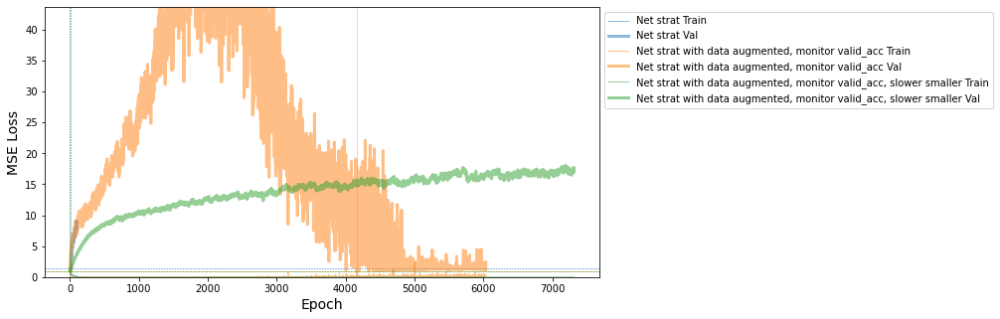

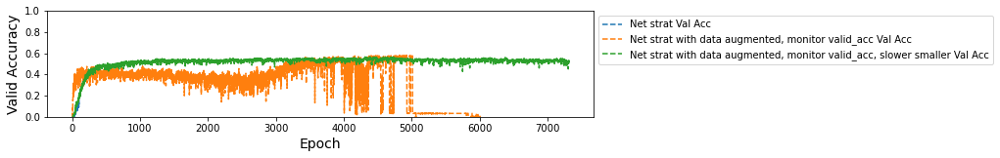

In [66]:
nets = [
    (net,'Net strat'),
    (net_da,'Net strat with data augmented, monitor valid_acc'),
    (net_da2,'Net strat with data augmented, monitor valid_acc, slower smaller')
]

sk_loss_plot(nets,yscaler=50)

In [67]:
cls_full_train_df = view_cls_report(net_da2,s['Xtrain_aug'],s['ytrain_aug'],imods_filt)
cls_test_df = view_cls_report(net_da2,s['Xval'],s['yval'],imods_filt)

alt.VConcatChart(...)

alt.VConcatChart(...)

In [ ]:
# load that old checkpoint?

In [68]:
from skorch.callbacks import LoadInitState

cp = Checkpoint(dirname='checkpt')
load_state = LoadInitState(cp)


In [70]:
net_da_load = NeuralNetClassifier(
    m.DNA_2CNN_2FC_Multi, # my pytorch model
    criterion=torch.nn.BCEWithLogitsLoss(pos_weight=bce_pos_weights),
    train_split=predefined_split(valid_ds), # stratified =True
    module__seq_len=300, # pass arg to pytorch model
    module__n_tasks=y.shape[1],
    module__num_filters1=128,
    module__num_filters2=64,
    module__kernel_size1=8,
    module__kernel_size2=8,
    module__conv_pool_size1=3, 
    module__conv_pool_size2=1,
    module__fc_node_num1 = 100,
    module__fc_node_num2 = 100,
    module__dropout1 = 0.2,
    module__dropout2 = 0.2,
    max_epochs=8000,
    lr=0.001,
    device=DEVICE,  # uncomment this to train with CUDA
     callbacks=[cp, load_state],
    optimizer=torch.optim.Adam,
    #optimizer=torch.optim.SGD,
    iterator_train__shuffle=True,
    #train_split=predefined_split(valid_ds)
    #train_split=None
)

In [72]:
net_da_load.fit(s['Xtrain_aug'], s['ytrain_aug'], epochs=100)

  epoch    train_loss    valid_acc    valid_loss    cp     dur
-------  ------------  -----------  ------------  ----  ------
      1        1.3545       0.0000        0.9211     +  0.6976
      2        1.1809       0.0000        0.9224        0.5570
      3        0.7692       0.0000        1.1228        0.5556
      4        0.4996       0.0029        1.5941        0.5562
      5        0.3589       0.0029        1.7514        0.5563
      6        0.2791       0.0088        2.1292        0.5560
      7        0.2247       0.0147        2.3167        0.5561
      8        0.1908       0.0147        2.5609        0.5567
      9        0.1591       0.0645        2.7959        0.5565
     10        0.1325       0.0235        3.0083        0.5563
     11        0.1125       0.0499        3.1361        0.5563
     12        0.0961       0.1085        3.5209        0.5563
     13        0.0815       0.1437        3.5599        0.5573
     14        0.0733       0.1466        3.7782       

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=DNA_2CNN_2FC_Multi(
    (conv_net): Sequential(
      (0): Conv2d(1, 128, kernel_size=(4, 8), stride=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=(1, 3), stride=(1, 3), padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.2, inplace=False)
      (4): Conv2d(128, 64, kernel_size=(1, 8), stride=(1, 1))
      (5): ReLU()
      (6): Dropout(p=0.2, inplace=False)
      (7): Flatten()
      (8): Linear(in_features=5760, out_features=100, bias=True)
      (9): ReLU()
      (10): Linear(in_features=100, out_features=100, bias=True)
      (11): ReLU()
      (12): Linear(in_features=100, out_features=58, bias=True)
    )
  ),
)

TypeError: 'NoneType' object is not subscriptable

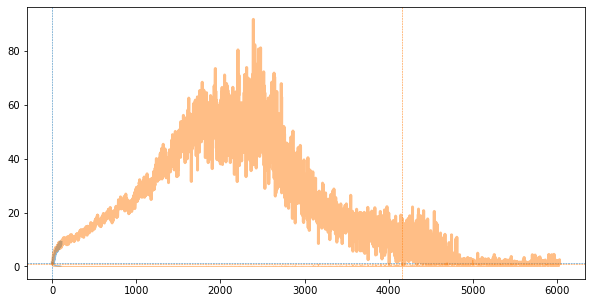

In [71]:
nets = [
    (net,'Net strat'),
    (net_da,'Net strat with data augmented, monitor valid_acc'),
    #(net_da2,'Net strat with data augmented, monitor valid_acc, slower smaller')
    (net_da_load,'net load')
]

sk_loss_plot(nets,yscaler=50)

In [74]:
import pickle

In [75]:
# save that weird model
# saving
with open('strange_loss_model.pkl', 'wb') as f:
    pickle.dump(net_da, f)




In [ ]:
# longer training time to see if it comes down, monitor valid_acc

In [171]:
# keep going....?
net_da.partial_fit(s['Xtrain_aug'], s['ytrain_aug'], epochs=1000)


Re-initializing module because the following parameters were re-set: conv_pool_size1, conv_pool_size2, dropout1, dropout2, fc_node_num1, fc_node_num2, kernel_size1, kernel_size2, n_tasks, num_filters1, num_filters2, seq_len.
Re-initializing criterion.
Re-initializing optimizer.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.3584       0.0000        0.9328  0.6999
      2        1.3309       0.0000        0.9045  0.5534
      3        0.9989       0.0000        0.9658  0.5512
      4        0.6216       0.0000        1.2848  0.5515
      5        0.4493       0.0000        1.6411  0.5502
      6        0.3500       0.0147        1.9036  0.5513
      7        0.2834       0.0117        2.1834  0.5503
      8        0.2501       0.0205        2.2225  0.5506
      9        0.2110       0.0293        2.4778  0.5507
     10        0.1858       0.0528        2.6610  0.5511
     11        0.1633       0.0352   

    126        0.0157       0.2903        6.9028  0.5570
    127        0.0184       0.3138        6.9138  0.5571
    128        0.0139       0.3021        6.9177  0.5581
    129        0.0186       0.2874        6.7234  0.5573
    130        0.0200       0.2493        6.1470  0.5577
    131        0.0205       0.2815        6.6101  0.5553
    132        0.0157       0.2639        6.3806  0.5531
    133        0.0132       0.2962        7.4089  0.5528
    134        0.0146       0.3314        6.8818  0.5527
    135        0.0162       0.2815        6.7121  0.5532
    136        0.0116       0.3519        7.0924  0.5534
    137        0.0101       0.2698        7.5313  0.5540
    138        0.0145       0.2786        6.7188  0.5529
    139        0.0135       0.2933        6.9309  0.5540
    140        0.0113       0.3490        7.5404  0.5527
    141        0.0160       0.2639        6.8790  0.5539
    142        0.0169       0.2639        6.8650  0.5555
    143        0.0116       0.3

    268        0.0054       0.3783        8.6634  0.5520
    269        0.0069       0.3578        8.6543  0.5516
    270        0.0135       0.3050        7.4646  0.5545
    271        0.0087       0.3109        7.2749  0.5552
    272        0.0072       0.3167        8.2008  0.5579
    273        0.0078       0.3343        8.2148  0.5581
    274        0.0055       0.3109        8.6116  0.5578
    275        0.0091       0.3519        7.9011  0.5577
    276        0.0051       0.3050        8.2662  0.5549
    277        0.0045       0.4018        9.0088  0.5601
    278        0.0065       0.4018        9.1078  0.5595
    279        0.0089       0.3372        8.8675  0.5559
    280        0.0050       0.3519        9.1914  0.5617
    281        0.0048       0.3548        9.4448  0.5586
    282        0.0068       0.3314        8.6804  0.5515
    283        0.0082       0.3783        8.8225  0.5510
    284        0.0097       0.3138        8.1922  0.5510
    285        0.0079       0.3

    412        0.0061       0.3724        9.6974  0.5590
    413        0.0059       0.3460       10.0064  0.5593
    414        0.0033       0.4135       10.6660  0.5579
    415        0.0042       0.3959       10.2246  0.5618
    416        0.0036       0.3636       10.3508  0.5588
    417        0.0082       0.3548        9.7164  0.5588
    418        0.0085       0.3255        9.0913  0.5592
    419        0.0046       0.4194       10.0275  0.5595
    420        0.0036       0.4370       10.4305  0.5603
    421        0.0062       0.3871       10.2133  0.5559
    422        0.0059       0.3636        9.6401  0.5582
    423        0.0039       0.4370       10.4373  0.5561
    424        0.0046       0.3959       10.2168  0.5596
    425        0.0027       0.4428       10.7092  0.5588
    426        0.0037       0.4047       10.5789  0.5541
    427        0.0044       0.3812       10.2824  0.5519
    428        0.0046       0.4018       10.5391  0.5527
    429        0.0034       0.3

    555        0.0067       0.3842       11.6430  0.5609
    556        0.0055       0.3724       11.6955  0.5590
    557        0.0071       0.3930       11.6995  0.5597
    558        0.0028       0.3754       11.8745  0.5580
    559        0.0057       0.3842       11.8130  0.5578
    560        0.0033       0.3607       12.1093  0.5620
    561        0.0061       0.3695       11.8713  0.5634
    562        0.0090       0.3372       11.5534  0.5583
    563        0.0050       0.3695       11.3558  0.5604
    564        0.0037       0.3695       11.4259  0.5590
    565        0.0048       0.3724       11.8377  0.5599
    566        0.0029       0.3842       11.9579  0.5636
    567        0.0044       0.4135       11.8003  0.5600
    568        0.0043       0.3930       11.8924  0.5602
    569        0.0047       0.3871       11.7560  0.5620
    570        0.0037       0.3226       10.7319  0.5563
    571        0.0064       0.3519       10.0040  0.5636
    572        0.0060       0.3

    699        0.0062       0.3402       12.4279  0.5591
    700        0.0036       0.3754       12.2809  0.5601
    701        0.0051       0.3812       12.2527  0.5537
    702        0.0021       0.4340       13.1683  0.5523
    703        0.0050       0.3402       12.4196  0.5574
    704        0.0056       0.3607       12.0923  0.5607
    705        0.0064       0.3636       13.9508  0.5560
    706        0.0084       0.3754       12.3718  0.5530
    707        0.0089       0.3548       12.3216  0.5536
    708        0.0039       0.3548       12.2707  0.5537
    709        0.0038       0.3255       11.7597  0.5533
    710        0.0063       0.3343       12.4940  0.5530
    711        0.0061       0.3314       12.3572  0.5527
    712        0.0078       0.3900       12.4054  0.5530
    713        0.0034       0.3871       12.8137  0.5533
    714        0.0065       0.3871       12.0810  0.5535
    715        0.0039       0.3783       11.8843  0.5568
    716        0.0046       0.3

    843        0.0035       0.3783       14.6240  0.5583
    844        0.0033       0.3519       14.1397  0.5575
    845        0.0023       0.4047       15.0659  0.5578
    846        0.0136       0.3431       13.0350  0.5583
    847        0.0105       0.3519       13.8096  0.5581
    848        0.0049       0.3783       13.9222  0.5620
    849        0.0035       0.3490       14.3953  0.5623
    850        0.0052       0.3812       15.0493  0.5633
    851        0.0055       0.3372       14.2536  0.5585
    852        0.0051       0.3754       14.7605  0.5559
    853        0.0021       0.4194       15.4742  0.5572
    854        0.0023       0.4018       15.4397  0.5587
    855        0.0024       0.4223       15.8159  0.5562
    856        0.0072       0.3490       14.3401  0.5562
    857        0.0038       0.3666       14.9729  0.5585
    858        0.0030       0.3490       15.0669  0.5566
    859        0.0028       0.3871       15.5888  0.5568
    860        0.0025       0.4

    987        0.0016       0.4340       16.5546  0.5614
    988        0.0018       0.4399       16.7192  0.5610
    989        0.0038       0.4018       15.8160  0.5603
    990        0.0019       0.4399       17.0818  0.5604
    991        0.0021       0.4370       16.5645  0.5618
    992        0.0049       0.3842       15.8515  0.5615
    993        0.0029       0.4076       16.2815  0.5595
    994        0.0027       0.4399       16.4631  0.5628
    995        0.0014       0.4663       17.8221  0.5656
    996        0.0032       0.4428       16.8721  0.5650
    997        0.0033       0.4047       17.0345  0.5691
    998        0.0053       0.3695       16.0900  0.5638
    999        0.0046       0.4076       17.8284  0.5611
   1000        0.0039       0.4311       17.5833  0.5591


<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=DNA_2CNN_2FC_Multi(
    (conv_net): Sequential(
      (0): Conv2d(1, 128, kernel_size=(4, 8), stride=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=(1, 3), stride=(1, 3), padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.2, inplace=False)
      (4): Conv2d(128, 64, kernel_size=(1, 8), stride=(1, 1))
      (5): ReLU()
      (6): Dropout(p=0.2, inplace=False)
      (7): Flatten()
      (8): Linear(in_features=5760, out_features=100, bias=True)
      (9): ReLU()
      (10): Linear(in_features=100, out_features=100, bias=True)
      (11): ReLU()
      (12): Linear(in_features=100, out_features=58, bias=True)
    )
  ),
)

In [175]:
net_da2.partial_fit(s['Xtrain_aug'], s['ytrain_aug'], epochs=100)


    102        0.0090       0.3490        7.9144  0.6922
    103        0.0156       0.3021        7.6148  0.5549
    104        0.0159       0.2815        7.6667  0.5568
    105        0.0106       0.3314        7.9514  0.5560
    106        0.0099       0.3460        7.9627  0.5547
    107        0.0123       0.3402        7.8531  0.5537
    108        0.0134       0.3196        7.7053  0.5587
    109        0.0096       0.3812        8.5232  0.5666
    110        0.0099       0.3138        7.8587  0.5626


<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=DNA_2CNN_2FC_Multi(
    (conv_net): Sequential(
      (0): Conv2d(1, 128, kernel_size=(4, 8), stride=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=(1, 3), stride=(1, 3), padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.2, inplace=False)
      (4): Conv2d(128, 64, kernel_size=(1, 8), stride=(1, 1))
      (5): ReLU()
      (6): Dropout(p=0.2, inplace=False)
      (7): Flatten()
      (8): Linear(in_features=5760, out_features=100, bias=True)
      (9): ReLU()
      (10): Linear(in_features=100, out_features=100, bias=True)
      (11): ReLU()
      (12): Linear(in_features=100, out_features=58, bias=True)
    )
  ),
)

Running net da


/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:61: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


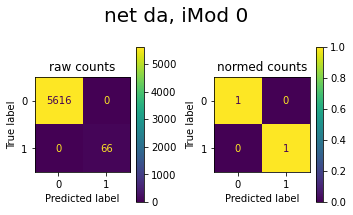

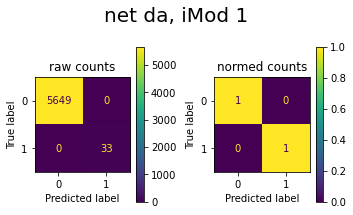

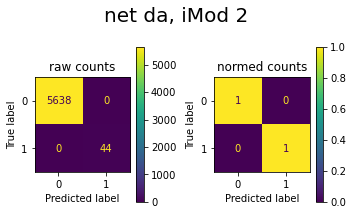

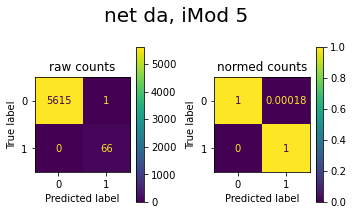

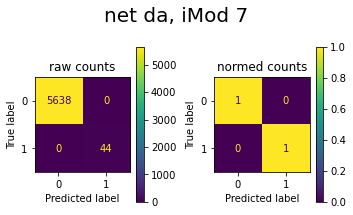

...

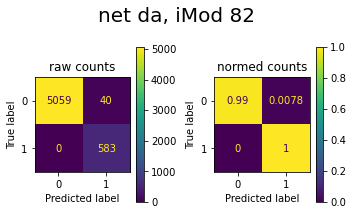

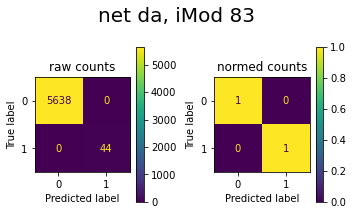

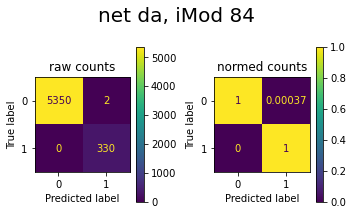

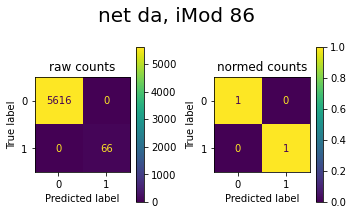

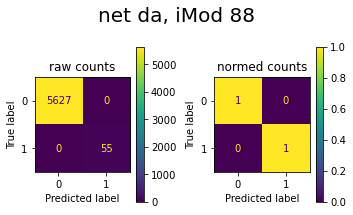

In [149]:
plot_confusion_multi([(net_da,'net da')], s['Xtrain_aug'],s['ytrain_aug'],imods_filt)

Running net da


/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in long_scalars
/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:61: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


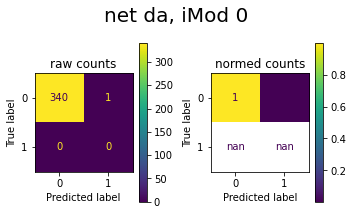

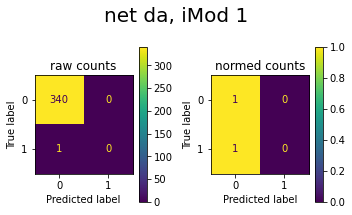

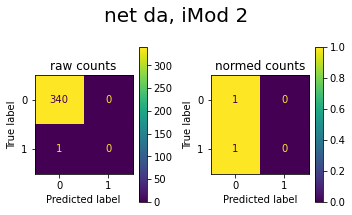

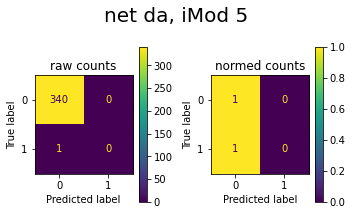

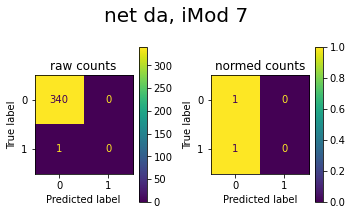

...

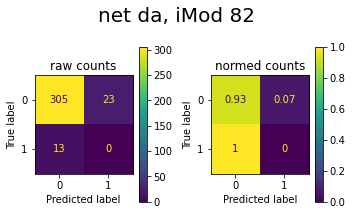

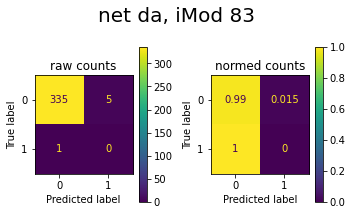

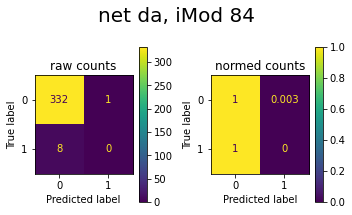

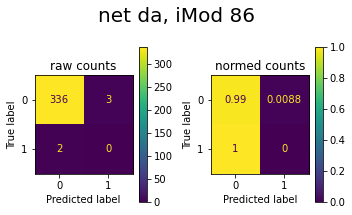

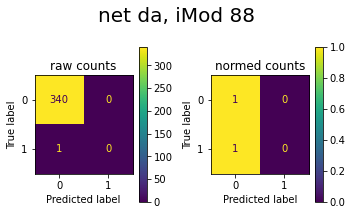

In [152]:
plot_confusion_multi([(net_da,'net da')], s['Xval'],s['yval'],imods_filt)

In [150]:
# trying with monitoring valid acc

In [151]:
1+1

2

## fiddle with params with bce weights

In [36]:
# apparently i think DNA_2CNN_2FC_Multi should still work for multi-label classification
valid_ds = Dataset(Xval_strat, yval_strat)

net_strat_bcew_tink5 = NeuralNetClassifier(
    m.DNA_2CNN_2FC_Multi, # my pytorch model
    criterion=torch.nn.BCEWithLogitsLoss(pos_weight=bce_pos_weights),
    train_split=predefined_split(valid_ds), # stratified =True
    module__seq_len=300, # pass arg to pytorch model
    module__n_tasks=y.shape[1],
    module__num_filters1=64,
    module__num_filters2=8,
    module__kernel_size1=8,
    module__kernel_size2=3,
    module__conv_pool_size1=3, 
    module__conv_pool_size2=1,
    module__fc_node_num1 = 50,
    module__fc_node_num2 = 50,
    module__dropout1 = 0.2,
    module__dropout2 = 0.4,
    max_epochs=2000,
    lr=0.0001,
    batch_size=256,
    device=DEVICE,  # uncomment this to train with CUDA
     callbacks=[
         EarlyStopping(patience=1000),
         #Checkpoint(load_best=True),
         GradientNormClipping()
     ],
    optimizer=torch.optim.AdamW,
    optimizer__weight_decay=1e-3,
    #optimizer=torch.optim.SGD,
    iterator_train__shuffle=True,
    #train_split=predefined_split(valid_ds)
    #train_split=None
)

In [37]:
net_strat_bcew_tink5.fit(Xtrain_strat,ytrain_strat)

  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.3846       0.0000        1.3554  0.1788
      2        1.3844       0.0000        1.3554  0.1199
      3        1.3848       0.0000        1.3554  0.1027
      4        1.3844       0.0000        1.3554  0.0898
      5        1.3837       0.0000        1.3553  0.0883
      6        1.3836       0.0000        1.3553  0.0880
      7        1.3836       0.0000        1.3554  0.0879
      8        1.3835       0.0000        1.3554  0.0876
      9        1.3841       0.0000        1.3555  0.0877
     10        1.3844       0.0000        1.3555  0.0876
     11        1.3837       0.0000        1.3555  0.0880
     12        1.3830       0.0000        1.3555  0.0880
     13        1.3829       0.0000        1.3555  0.0877
     14        1.3830       0.0000        1.3556  0.0892
     15        1.3828       0.0000        1.3556  0.0879
     16        1.3826       0.0

    129        1.0254       0.0000        1.5327  0.0901
    130        1.0328       0.0000        1.5337  0.0892
    131        1.0176       0.0000        1.5313  0.0889
    132        1.0262       0.0000        1.5209  0.0888
    133        1.0258       0.0000        1.5276  0.0891
    134        1.0223       0.0000        1.5327  0.0890
    135        1.0191       0.0000        1.5537  0.0890
    136        1.0100       0.0000        1.5521  0.0888
    137        0.9803       0.0000        1.5861  0.0890
    138        0.9910       0.0000        1.5824  0.0890
    139        0.9940       0.0000        1.5866  0.0895
    140        0.9776       0.0000        1.6033  0.0893
    141        0.9632       0.0000        1.6157  0.0890
    142        0.9541       0.0000        1.6203  0.0890
    143        0.9364       0.0000        1.6166  0.0891
    144        0.9614       0.0000        1.6459  0.0891
    145        0.9276       0.0000        1.6728  0.0899
    146        0.9333       0.0

    264        0.5785       0.0117        2.7620  0.0899
    265        0.5643       0.0088        2.7836  0.0891
    266        0.5671       0.0029        2.8764  0.0895
    267        0.5668       0.0029        2.9162  0.0908
    268        0.5475       0.0029        2.9234  0.0895
    269        0.5619       0.0117        2.9082  0.0888
    270        0.5652       0.0059        2.8878  0.0886
    271        0.5465       0.0088        2.8884  0.0887
    272        0.5433       0.0088        2.9148  0.0888
    273        0.5259       0.0147        2.9678  0.0887
    274        0.5677       0.0176        2.9593  0.0890
    275        0.5370       0.0117        2.9587  0.0894
    276        0.5458       0.0088        2.9791  0.0897
    277        0.5409       0.0147        2.9491  0.0896
    278        0.5296       0.0147        3.0000  0.0908
    279        0.5374       0.0117        2.9982  0.0892
    280        0.5418       0.0029        2.9004  0.0890
    281        0.5299       0.0

    402        0.3909       0.0293        4.0215  0.0902
    403        0.3767       0.0411        4.0490  0.0900
    404        0.3897       0.0411        4.0599  0.0901
    405        0.3699       0.0381        4.0050  0.0908
    406        0.4089       0.0440        3.9907  0.0912
    407        0.3821       0.0440        4.0284  0.0911
    408        0.3704       0.0411        4.1004  0.0911
    409        0.3864       0.0323        4.0897  0.0915
    410        0.3829       0.0323        4.0261  0.0909
    411        0.3933       0.0293        4.0008  0.0914
    412        0.3806       0.0264        4.0556  0.0912
    413        0.3858       0.0293        4.0685  0.0926
    414        0.3747       0.0411        4.1202  0.0923
    415        0.3911       0.0352        4.1318  0.0923
    416        0.3794       0.0381        4.0961  0.0919
    417        0.3721       0.0352        4.0865  0.0905
    418        0.3696       0.0381        4.0915  0.0914
    419        0.3706       0.0

    542        0.2793       0.0557        4.9504  0.0900
    543        0.2960       0.0528        4.9768  0.0904
    544        0.2936       0.0469        5.0383  0.0905
    545        0.2932       0.0587        5.0536  0.0899
    546        0.2910       0.0528        5.0141  0.0908
    547        0.2712       0.0587        5.0854  0.0909
    548        0.2824       0.0674        5.1721  0.0901
    549        0.3013       0.0557        5.1167  0.0901
    550        0.2855       0.0528        4.9967  0.0916
    551        0.2815       0.0499        4.9714  0.0900
    552        0.2944       0.0587        5.0117  0.0898
    553        0.2773       0.0762        5.0933  0.0895
    554        0.2833       0.0762        5.1340  0.0898
    555        0.2899       0.0674        5.1020  0.0901
    556        0.2792       0.0528        5.1175  0.0896
    557        0.2821       0.0528        5.1320  0.0893
    558        0.2770       0.0616        5.1343  0.0894
    559        0.2896       0.0

    682        0.2332       0.0880        5.9928  0.0909
    683        0.2234       0.0968        6.0202  0.0892
    684        0.2268       0.0880        5.9754  0.0909
    685        0.2269       0.0792        5.9119  0.0897
    686        0.2465       0.0762        5.8683  0.0897
    687        0.2195       0.0880        5.8304  0.0892
    688        0.2271       0.0938        5.9202  0.0900
    689        0.2363       0.0938        5.9196  0.0902
    690        0.2261       0.0762        5.8319  0.0909
    691        0.2311       0.0704        5.7977  0.0902
    692        0.2246       0.0792        5.7746  0.0904
    693        0.2250       0.0880        5.8693  0.0898
    694        0.2202       0.0938        6.0045  0.0907
    695        0.2174       0.0968        6.0411  0.0911
    696        0.2264       0.0792        6.0030  0.0906
    697        0.2308       0.0645        5.9450  0.0934
    698        0.2329       0.0762        5.9146  0.0913
    699        0.2106       0.0

    823        0.1897       0.1173        6.7034  0.0896
    824        0.1791       0.1056        6.7566  0.0896
    825        0.1783       0.1202        6.8173  0.0901
    826        0.1739       0.1173        6.8478  0.0898
    827        0.1892       0.1261        6.8292  0.0901
    828        0.1924       0.1232        6.7823  0.0897
    829        0.1873       0.0938        6.7036  0.0900
    830        0.1916       0.1056        6.7135  0.1595
    831        0.1941       0.1085        6.7246  0.0902
    832        0.1830       0.1202        6.7135  0.0897
    833        0.1774       0.1232        6.7735  0.0903
    834        0.1877       0.1261        6.8256  0.0903
    835        0.1830       0.1261        6.8724  0.0897
    836        0.1806       0.1290        6.9390  0.0911
    837        0.1895       0.1349        6.9014  0.0904
    838        0.1840       0.1202        6.8006  0.0897
    839        0.1834       0.1202        6.7896  0.0891
    840        0.2002       0.1

    964        0.1661       0.1408        7.4025  0.0903
    965        0.1570       0.1261        7.3522  0.0908
    966        0.1641       0.1202        7.3512  0.0900
    967        0.1658       0.1320        7.4098  0.0896
    968        0.1604       0.1408        7.4852  0.0904
    969        0.1613       0.1496        7.5363  0.0917
    970        0.1538       0.1496        7.5578  0.0923
    971        0.1570       0.1496        7.6271  0.0920
    972        0.1539       0.1466        7.6282  0.0925
    973        0.1428       0.1496        7.6782  0.0924
    974        0.1624       0.1378        7.6388  0.0931
    975        0.1591       0.1349        7.5267  0.0930
    976        0.1550       0.1290        7.4372  0.0918
    977        0.1553       0.1408        7.4729  0.0934
    978        0.1570       0.1554        7.4864  0.0933
    979        0.1606       0.1437        7.4836  0.0920
    980        0.1499       0.1320        7.5175  0.0915
    981        0.1491       0.1

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=DNA_2CNN_2FC_Multi(
    (conv_net): Sequential(
      (0): Conv2d(1, 64, kernel_size=(4, 8), stride=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=(1, 3), stride=(1, 3), padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.2, inplace=False)
      (4): Conv2d(64, 8, kernel_size=(1, 3), stride=(1, 1))
      (5): ReLU()
      (6): Dropout(p=0.4, inplace=False)
      (7): Flatten()
      (8): Linear(in_features=760, out_features=50, bias=True)
      (9): ReLU()
      (10): Linear(in_features=50, out_features=50, bias=True)
      (11): ReLU()
      (12): Linear(in_features=50, out_features=58, bias=True)
    )
  ),
)

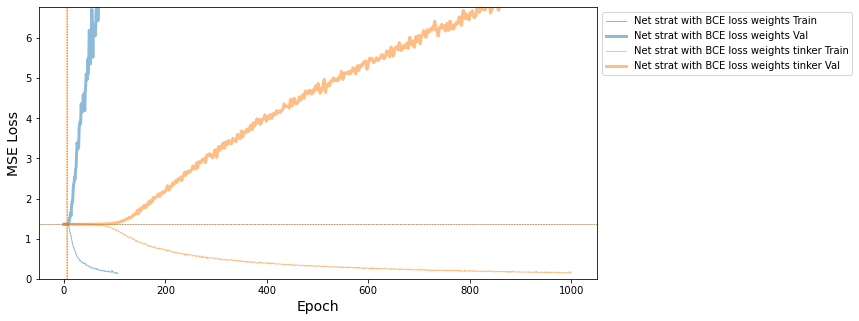

In [38]:
nets = [
    #(net_strat_val,'Net strat with val'),
    (net_strat_bcew,'Net strat with BCE loss weights'),
#     (net_strat_bcew_tink,'Net strat with BCE loss weights tinker'),
#     (net_strat_bcew_tink2,'Net strat with BCE loss weights tinker'),
#     (net_strat_bcew_tink3,'Net strat with BCE loss weights tinker'),
#     (net_strat_bcew_tink4,'Net strat with BCE loss weights tinker'),
    (net_strat_bcew_tink5,'Net strat with BCE loss weights tinker'),
]


sk_loss_plot(nets,yscaler=5)

In [39]:
cls_full_train_df = view_cls_report(net_strat_bcew_tink5,Xtrain_strat,ytrain_strat,imods_filt)
cls_test_df = view_cls_report(net_strat_bcew_tink5,Xval_strat,yval_strat,imods_filt)
cls_test_df = view_cls_report(net_strat_bcew_tink5,Xtest_strat,ytest_strat,imods_filt)

alt.VConcatChart(...)

alt.VConcatChart(...)

alt.VConcatChart(...)

Running bce weight tinkering


/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


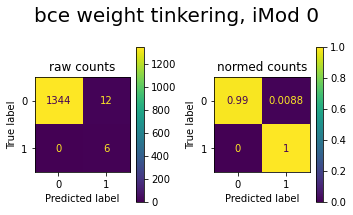

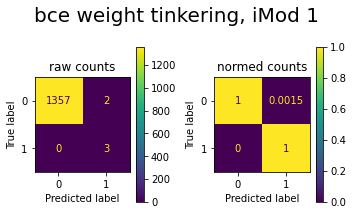

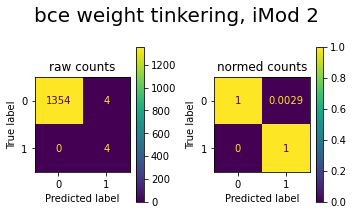

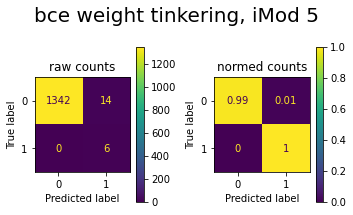

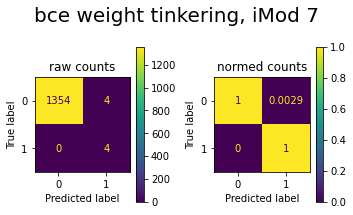

...

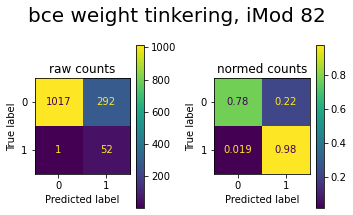

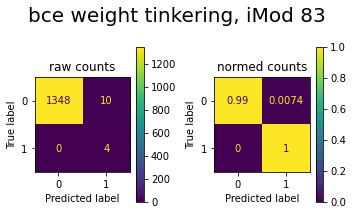

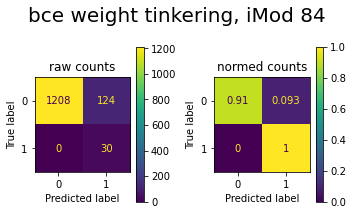

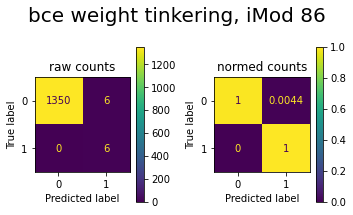

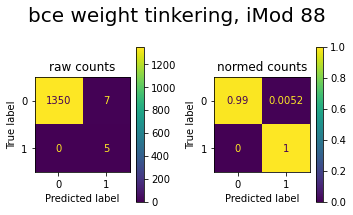

In [40]:
plot_confusion_multi([(net_strat_bcew_tink5,'bce weight tinkering')], Xtrain_strat,ytrain_strat,imods_filt)

In [41]:
#plot_confusion_multi([(net_strat_bcew_tink4,'bce weight tinkering')], Xval_strat,yval_strat,imods_filt)

In [42]:
#plot_confusion_multi([(net_strat_bcew_tink4,'bce weight tinkering')], Xtest_strat,ytest_strat,imods_filt)

In [43]:
net_strat_bcew_tink5.get_params()

{'module': models.DNA_2CNN_2FC_Multi,
 'criterion': BCEWithLogitsLoss(),
 'optimizer': torch.optim.adamw.AdamW,
 'lr': 0.0001,
 'max_epochs': 2000,
 'batch_size': 256,
 'iterator_train': torch.utils.data.dataloader.DataLoader,
 'iterator_valid': torch.utils.data.dataloader.DataLoader,
 'dataset': skorch.dataset.Dataset,
 'train_split': functools.partial(<function _make_split at 0x7f992046b0e0>, valid_ds=<skorch.dataset.Dataset object at 0x7f98c3a9e0d0>),
 'callbacks': [<skorch.callbacks.training.EarlyStopping at 0x7f985c3bd390>,
 'predict_nonlinearity': 'auto',
 'warm_start': False,
 'verbose': 1,
 'device': device(type='cuda'),
 '_kwargs': {'module__seq_len': 300,
  'module__n_tasks': 58,
  'module__num_filters1': 64,
  'module__num_filters2': 8,
  'module__kernel_size1': 8,
  'module__kernel_size2': 3,
  'module__conv_pool_size1': 3,
  'module__conv_pool_size2': 1,
  'module__fc_node_num1': 50,
  'module__fc_node_num2': 50,
  'module__dropout1': 0.2,
  'module__dropout2': 0.4,
  'opt

# SKORCH search

In [279]:
from sklearn.model_selection import RandomizedSearchCV


In [287]:
valid_ds = Dataset(Xval_strat, yval_strat)

net_search = NeuralNetClassifier(
    m.DNA_2CNN_2FC_Multi,
    #m.DNA_2CNN_Multi,
    #m.DNA_CNN_Multi,
    #train_split=ValidSplit(0.2),
    #train_split=None,
    #train_split=ValidSplit(k_fold.split(Xtrain_strat,ytrain_strat)),
    #train_split=k_fold,
    train_split=predefined_split(valid_ds),
    criterion=torch.nn.BCEWithLogitsLoss(pos_weight=bce_pos_weights),
    module__seq_len=300,
    module__n_tasks=y.shape[1],
    max_epochs=2000,
    #lr=0.001,
    device=DEVICE,
    callbacks=[
         #EarlyStopping(patience=100),
         EarlyStopping(patience=300),
         #Checkpoint(load_best=True),
         GradientNormClipping()
     ],
    verbose=0,

)


In [288]:
params = {
    'lr': [0.001, 0.0005, 0.0001,],#loguniform(0.0001, 0.01)
    'batch_size':[32,64,128,256],
    'module__num_filters1': [16,32,64,128],
    'module__num_filters2': [16,32,64,128],
    'module__kernel_size1': [4,8,16,32],
    'module__kernel_size2': [4,8,16,32],
    'module__conv_pool_size1': [2,4],
    'module__fc_node_num1': [10,50,100,500],
    'module__fc_node_num2': [10,50,100,500],
    'module__dropout1': [0.0,0.2,0.4],
    'module__dropout2': [0.0,0.2,0.4],
    'optimizer':[torch.optim.SGD, torch.optim.Adam,torch.optim.AdamW,torch.optim.RMSprop]
    #'optimizer':[torch.optim.Adam,torch.optim.AdamW,torch.optim.RMSprop]
}

In [291]:
search = RandomizedSearchCV(
    net_search, 
    params, 
    n_iter=500, 
    #scoring='neg_mean_squared_error', 
    #scoring=['precision','recall','f1_macro'], 
    scoring=['f1_macro'], 
    refit='f1_macro',
    n_jobs=-1, 
    #cv=3,#cv, 
    #cv=k_fold.split(Xtrain_strat,ytrain_strat),
    #cv=k_fold,
    random_state=7,
    verbose=1
)

In [292]:
search.fit(Xtrain_strat,ytrain_strat)

Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 53.9min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed: 116.7min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed: 209.4min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 323.3min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 473.1min
[Parallel(n_jobs=-1)]: Done 2442 tasks      | elapsed: 638.9min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed: 649.9min finished


RandomizedSearchCV(estimator=<class 'skorch.classifier.NeuralNetClassifier'>[uninitialized](
  module=<class 'models.DNA_2CNN_2FC_Multi'>,
  module__n_tasks=58,
  module__seq_len=300,
),
                   n_iter=500, n_jobs=-1,
                   param_distributions={'batch_size': [32, 64, 128, 256],
                                        'lr': [0.001, 0.0005, 0.0001],
                                        'module__conv_pool_size1': [2, 4],
                                        'module__dropout1': [0.0, 0.2, 0.4],
                                        'module__drop...
                                        'module__kernel_size1': [4, 8, 16, 32],
                                        'module__kernel_size2': [4, 8, 16, 32],
                                        'module__num_filters1': [16, 32, 64,
                                                                 128],
                                        'module__num_filters2': [16, 32, 64,
                                

In [293]:
1+3

4

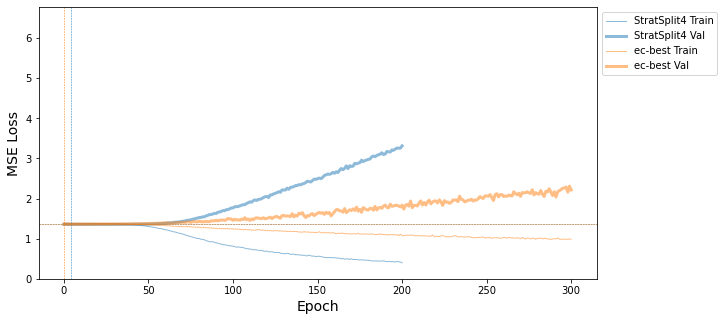

In [295]:
netss = [
    #(net_randsplit,"RandSplit"),
    (net_strat_bcew_tink4,"StratSplit4"),
    (search.best_estimator_,'ec-best')
]

sk_loss_plot(netss)

### inspect hyperparam search results

In [296]:
search.best_estimator_

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=DNA_2CNN_2FC_Multi(
    (conv_net): Sequential(
      (0): Conv2d(1, 16, kernel_size=(4, 16), stride=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=(1, 2), stride=(1, 2), padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.4, inplace=False)
      (4): Conv2d(16, 128, kernel_size=(1, 4), stride=(1, 1))
      (5): ReLU()
      (6): Dropout(p=0.4, inplace=False)
      (7): Flatten()
      (8): Linear(in_features=17792, out_features=10, bias=True)
      (9): ReLU()
      (10): Linear(in_features=10, out_features=500, bias=True)
      (11): ReLU()
      (12): Linear(in_features=500, out_features=58, bias=True)
    )
  ),
)

In [297]:
search.best_params_

{'optimizer': torch.optim.rmsprop.RMSprop,
 'module__num_filters2': 128,
 'module__num_filters1': 16,
 'module__kernel_size2': 4,
 'module__kernel_size1': 16,
 'module__fc_node_num2': 500,
 'module__fc_node_num1': 10,
 'module__dropout2': 0.4,
 'module__dropout1': 0.4,
 'module__conv_pool_size1': 2,
 'lr': 0.0001,
 'batch_size': 256}

In [298]:
res_df = pd.DataFrame(search.cv_results_)
res_df['opt_name'] = res_df['param_optimizer'].apply(lambda x: x.__name__)
res_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_optimizer,param_module__num_filters2,param_module__num_filters1,param_module__kernel_size2,param_module__kernel_size1,param_module__fc_node_num2,...,params,split0_test_f1_macro,split1_test_f1_macro,split2_test_f1_macro,split3_test_f1_macro,split4_test_f1_macro,mean_test_f1_macro,std_test_f1_macro,rank_test_f1_macro,opt_name
0,134.922935,6.769828,0.038413,0.005305,<class 'torch.optim.rmsprop.RMSprop'>,128,64,16,4,10,...,{'optimizer': <class 'torch.optim.rmsprop.RMSp...,0.003260,0.004375,0.002258,0.002014,0.006863,0.003754,0.001764,391,RMSprop
1,32.628558,0.521362,0.016442,0.001764,<class 'torch.optim.sgd.SGD'>,32,16,32,4,50,...,"{'optimizer': <class 'torch.optim.sgd.SGD'>, '...",0.003396,0.002384,0.009041,0.007039,0.015340,0.007440,0.004627,188,SGD
2,36.742397,0.480560,0.016439,0.002489,<class 'torch.optim.adam.Adam'>,64,32,4,16,10,...,"{'optimizer': <class 'torch.optim.adam.Adam'>,...",0.004886,0.008092,0.009910,0.008286,0.011626,0.008560,0.002237,121,Adam
3,47.250834,4.226117,0.017608,0.001342,<class 'torch.optim.adamw.AdamW'>,32,128,32,8,100,...,{'optimizer': <class 'torch.optim.adamw.AdamW'...,0.002302,0.002866,0.014504,0.007294,0.017081,0.008809,0.006013,105,AdamW
4,21.798534,1.560944,0.013442,0.000632,<class 'torch.optim.rmsprop.RMSprop'>,16,32,32,4,10,...,{'optimizer': <class 'torch.optim.rmsprop.RMSp...,0.004010,0.004750,0.017375,0.008271,0.020626,0.011006,0.006763,36,RMSprop
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,43.590408,1.275636,0.020677,0.001830,<class 'torch.optim.adam.Adam'>,128,32,32,8,50,...,"{'optimizer': <class 'torch.optim.adam.Adam'>,...",0.016850,0.003789,0.003445,0.010357,0.010156,0.008920,0.004955,96,Adam
496,40.046049,0.327979,0.019808,0.002273,<class 'torch.optim.adam.Adam'>,64,128,8,32,100,...,"{'optimizer': <class 'torch.optim.adam.Adam'>,...",0.012868,0.005307,0.007493,0.008356,0.025948,0.011995,0.007399,20,Adam
497,28.925875,5.456215,0.016243,0.001518,<class 'torch.optim.rmsprop.RMSprop'>,128,32,4,16,50,...,{'optimizer': <class 'torch.optim.rmsprop.RMSp...,0.008383,0.003202,0.002090,0.004075,0.017090,0.006968,0.005492,229,RMSprop
498,61.296736,7.202483,0.021766,0.002760,<class 'torch.optim.sgd.SGD'>,16,128,8,8,500,...,"{'optimizer': <class 'torch.optim.sgd.SGD'>, '...",0.004099,0.005103,0.004883,0.008098,0.007594,0.005955,0.001587,282,SGD


In [300]:
sm_res_df = res_df[[
    "rank_test_f1_macro",
    "mean_test_f1_macro",
    "param_module__num_filters1",
    "param_module__num_filters2",
    "param_module__kernel_size1",
    "param_module__kernel_size2",
    "param_lr",
    "param_module__fc_node_num1",
    "param_module__fc_node_num2",
    "opt_name"]]

In [301]:
sm_res_df

,rank_test_f1_macro,mean_test_f1_macro,param_module__num_filters1,param_module__num_filters2,param_module__kernel_size1,param_module__kernel_size2,param_lr,param_module__fc_node_num1,param_module__fc_node_num2,opt_name
0,391,0.003754,64,128,4,16,0.0005,500,10,RMSprop
1,188,0.007440,16,32,4,32,0.0001,100,50,SGD
2,121,0.008560,32,64,16,4,0.001,10,10,Adam
3,105,0.008809,128,32,8,32,0.0001,100,100,AdamW
4,36,0.011006,32,16,4,32,0.001,50,10,RMSprop
...,...,...,...,...,...,...,...,...,...,...
495,96,0.008920,32,128,8,32,0.0005,50,50,Adam
496,20,0.011995,128,64,32,8,0.0001,50,100,Adam
497,229,0.006968,32,128,16,4,0.001,10,50,RMSprop
498,282,0.005955,128,16,8,8,0.0005,10,500,SGD


In [303]:
alt.Chart(sm_res_df).mark_point().encode(
    x='rank_test_f1_macro:Q',
    y='mean_test_f1_macro:Q',
    color=alt.Color('param_lr:N',scale=alt.Scale(scheme='tableau10')),
#     column='param_module__num_filters:N',
#     detail='model_desc:N',
    #shape="param_module__kernel_size1:N"
    
).interactive()

alt.Chart(...)

In [305]:
alt.Chart(sm_res_df).mark_point(size=100).encode(
    x=alt.X('param_module__kernel_size1:O',title="kernel size 1"),
    y='mean_test_f1_macro:Q',
    color=alt.Color('param_lr:N',scale=alt.Scale(scheme='tableau10')),
    column='param_module__num_filters1:N',
#     detail='model_desc:N',
    shape="opt_name:N",
    tooltip=["rank_test_f1_macro:O","param_module__num_filters1:N","param_module__kernel_size1:N","param_lr:N","param_module__fc_node_num1:N"]
    
).interactive()

alt.Chart(...)

In [306]:
alt.Chart(sm_res_df).mark_boxplot(extent='min-max').encode(
    x=alt.X('param_module__num_filters1:O'),#title="kernel size 1"),
    y='mean_test_f1_macro:Q',
    #color=alt.Color('param_lr:N',scale=alt.Scale(scheme='tableau10')),
    column='opt_name:N',
    row='param_lr:N',
).interactive(
).properties(
    height=100,
    width=100
)

alt.Chart(...)

In [307]:
alt.Chart(sm_res_df[~sm_res_df['opt_name'].isin(['SGD'])]).mark_boxplot(extent='min-max').encode(
    x=alt.X('param_module__num_filters1:O'),#title="kernel size 1"),
    y='mean_test_f1_macro:Q',
    #color=alt.Color('param_lr:N',scale=alt.Scale(scheme='tableau10')),
    column='opt_name:N',
    row='param_lr:N',
).interactive(
).properties(
    height=100,
    width=100
)

alt.Chart(...)

In [308]:
alt.Chart(sm_res_df).mark_point(size=100).encode(
    x=alt.X('param_module__num_filters1:O'),#title="kernel size 1"),
    y='mean_test_f1_macro:Q',
    color=alt.Color('rank_test_f1_macro:Q',scale=alt.Scale(scheme='viridis')),
    column='param_module__kernel_size1:N',
    shape='opt_name:N',
    row='param_lr:N',
).interactive(
).properties(
    height=100,
    width=100
)

alt.Chart(...)

In [310]:
alt.Chart(sm_res_df).mark_point(size=100).encode(
    x=alt.X('param_module__fc_node_num1:O'),#title="kernel size 1"),
    y='mean_test_f1_macro:Q',
    color=alt.Color('rank_test_f1_macro:Q',scale=alt.Scale(scheme='viridis')),
    column='param_module__fc_node_num2:N',
    shape='opt_name:N',
    row='param_lr:N',
).interactive(
).properties(
    height=100,
    width=100
)

alt.Chart(...)

In [311]:
res_df.to_csv('ec_iMod_out/hyper_clf_weightedLoss.tsv',sep='\t',index=False)

In [313]:
# best estimator predictions
cls_full_train_df = view_cls_report(search.best_estimator_,Xtrain_strat,ytrain_strat,imods_filt)
cls_full_val_df = view_cls_report(search.best_estimator_,Xval_strat,yval_strat,imods_filt)
cls_full_test_df = view_cls_report(search.best_estimator_,Xtest_strat,ytest_strat,imods_filt)


alt.VConcatChart(...)

/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


alt.VConcatChart(...)

alt.VConcatChart(...)

Running searchbest train


/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


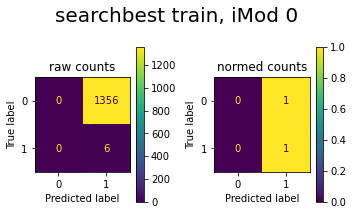

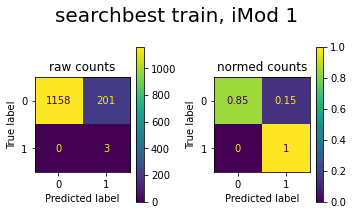

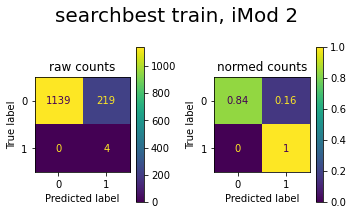

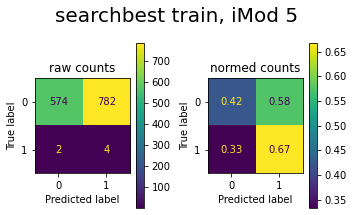

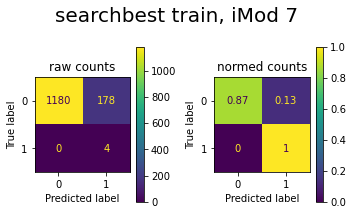

...

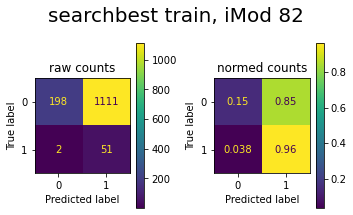

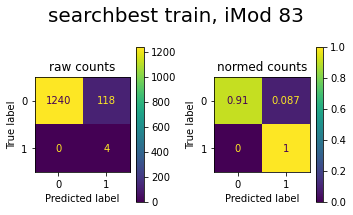

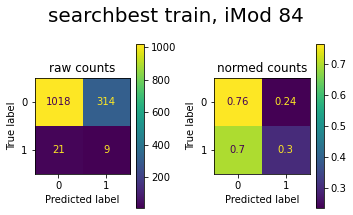

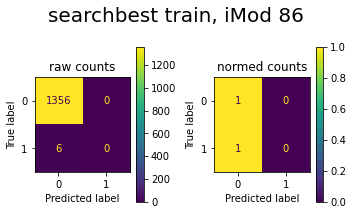

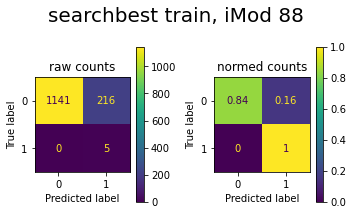

In [314]:
plot_confusion_multi([(search.best_estimator_,'searchbest train')], Xtrain_strat,ytrain_strat,imods_filt)

Running searchbest val


/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: invalid value encountered in long_scalars
/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


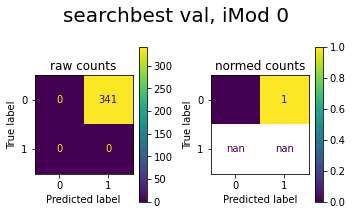

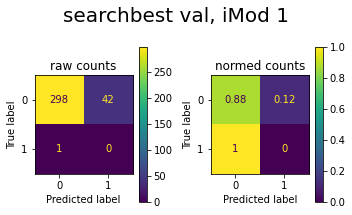

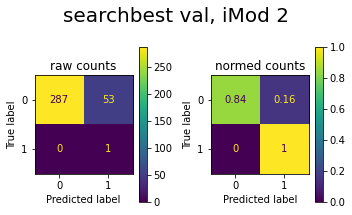

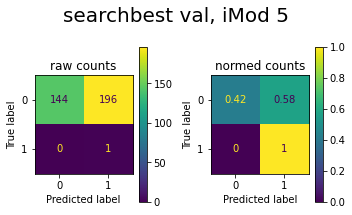

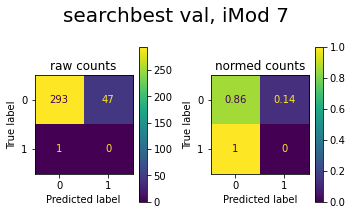

...

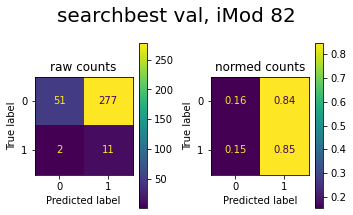

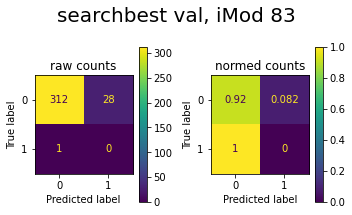

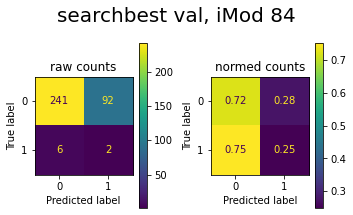

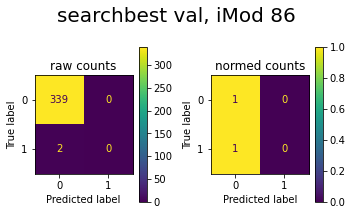

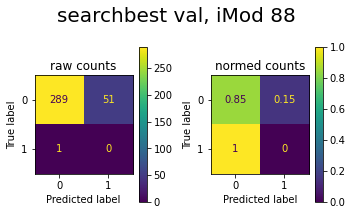

In [315]:
plot_confusion_multi([(search.best_estimator_,'searchbest val')], Xval_strat,yval_strat,imods_filt)

## try cros_val_predict

In [ ]:
# {'optimizer': torch.optim.adam.Adam,
#  'module__num_filters2': 128,
#  'module__num_filters1': 128,
#  'module__kernel_size2': 16,
#  'module__kernel_size1': 4,
#  'module__fc_node_num1': 500,
#  'module__dropout2': 0.4,
#  'module__dropout1': 0.0,
#  'module__conv_pool_size1': 4,
#  'lr': 0.01}

In [74]:
net_cvp = NeuralNetClassifier(
        m.DNA_2CNN_2FC_Multi, # my pytorch model
        criterion=torch.nn.BCEWithLogitsLoss(),
        #train_split=ValidSplit(0.2),
        #train_split=ValidSplit(k_fold.split(Xtrain_strat,ytrain_strat)),
        train_split=None,
        module__seq_len=300, # pass arg to pytorch model
        module__n_tasks=ytrain.shape[1],
        module__num_filters1=128,
        module__num_filters2=64,
        module__kernel_size1=8,
        module__kernel_size2=8,
        module__conv_pool_size1=3, 
        module__conv_pool_size2=1,
        module__fc_node_num1 = 100,
        module__fc_node_num2 = 100,
        module__dropout1 = 0.2,
        module__dropout2 = 0.2,
        max_epochs=2000,
        lr=0.01,
        device=DEVICE,
         callbacks=[
             EarlyStopping(patience=200,monitor='train_loss'),
             # suggested monitoring train loss when i want to do gridsearchcv with early stop?
             # https://github.com/skorch-dev/skorch/issues/837
             #Checkpoint(load_best=True),
             GradientNormClipping()
         ],
        optimizer=torch.optim.Adam,
        iterator_train__shuffle=True,
        #train_split=predefined_split(valid_ds)
        #train_split=None,
        verbose=1
    )

In [75]:
from sklearn.model_selection import cross_val_predict

In [76]:
y_pred = cross_val_predict(net_cvp, Xtrain_strat, ytrain_strat, cv=5)

# these instructions for using skorch with cross_val_predict don't work
# https://skorch.readthedocs.io/en/latest/user/dataset.html?highlight=fold#validsplit

# when train_split=None, then "valid loss" is not in history
# when train_split is left default, it says StratifiedCV needs a suitable y

  epoch    train_loss     dur
-------  ------------  ------
      1        0.5955  0.0902
      2        0.1069  0.0893
      3        0.0700  0.0672
      4        0.0555  0.0666
      5        0.0519  0.0659
      6        0.0500  0.0603
      7        0.0489  0.0582
      8        0.0483  0.0583
      9        0.0483  0.0579
     10        0.0482  0.0589
     11        0.0484  0.0579
     12        0.0480  0.0546
     13        0.0482  0.0576
     14        0.0481  0.0568
     15        0.0482  0.0570
     16        0.0481  0.0566
     17        0.0478  0.0570
     18        0.0479  0.0573
     19        0.0480  0.0577
     20        0.0482  0.0584
     21        0.0480  0.0583
     22        0.0474  0.0579
     23        0.0474  0.0584
     24        0.0475  0.0580
     25        0.0473  0.0587
     26        0.0475  0.0579
     27        0.0471  0.0580
     28        0.0468  0.0579
     29        0.0467  0.0580
     30        0.0475  0.0579
     31        0.0467  0.0579
     32   

    241        0.0040  0.0555
    242        0.0042  0.0554
    243        0.0048  0.0555
    244        0.0046  0.0555
    245        0.0056  0.0559
    246        0.0044  0.0558
    247        0.0041  0.0557
    248        0.0039  0.0556
    249        0.0042  0.0562
    250        0.0039  0.0563
    251        0.0050  0.0559
    252        0.0035  0.0559
    253        0.0051  0.0562
    254        0.0055  0.0564
    255        0.0051  0.0559
    256        0.0049  0.0558
    257        0.0048  0.0556
    258        0.0043  0.0556
    259        0.0032  0.0557
    260        0.0041  0.0557
    261        0.0041  0.0561
    262        0.0053  0.0556
    263        0.0037  0.0556
    264        0.0036  0.0555
    265        0.0048  0.0558
    266        0.0035  0.0559
    267        0.0043  0.0559
    268        0.0038  0.0556
    269        0.0039  0.0556
    270        0.0046  0.0557
    271        0.0048  0.0559
    272        0.0034  0.0561
    273        0.0041  0.0560
    274   

    512        0.0060  0.0582
    513        0.0043  0.0582
    514        0.0047  0.0585
    515        0.0046  0.0586
    516        0.0044  0.0578
    517        0.0053  0.0577
    518        0.0054  0.0579
    519        0.0048  0.0578
    520        0.0041  0.0576
    521        0.0032  0.0577
    522        0.0041  0.0578
    523        0.0040  0.0577
    524        0.0043  0.0577
    525        0.0036  0.0575
    526        0.0025  0.0576
    527        0.0043  0.0575
    528        0.0034  0.0576
    529        0.0039  0.0573
    530        0.0046  0.0574
    531        0.0039  0.0578
    532        0.0045  0.0575
    533        0.0029  0.0576
    534        0.0039  0.0578
    535        0.0039  0.0578
    536        0.0041  0.0576
    537        0.0043  0.0579
    538        0.0040  0.0577
    539        0.0043  0.0580
    540        0.0049  0.0576
    541        0.0033  0.0578
    542        0.0047  0.0575
    543        0.0041  0.0576
    544        0.0037  0.0579
    545   

      2        0.1280  0.0578
      3        0.0697  0.0594
      4        0.0581  0.0584
      5        0.0525  0.0580
      6        0.0507  0.0581
      7        0.0489  0.0585
      8        0.0486  0.0586
      9        0.0484  0.0581
     10        0.0486  0.0574
     11        0.0481  0.0575
     12        0.0482  0.0577
     13        0.0481  0.0576
     14        0.0482  0.0573
     15        0.0485  0.0574
     16        0.0485  0.0574
     17        0.0478  0.0576
     18        0.0482  0.0569
     19        0.0481  0.0574
     20        0.0480  0.0579
     21        0.0478  0.0576
     22        0.0475  0.0566
     23        0.0476  0.0555
     24        0.0475  0.0558
     25        0.0473  0.0559
     26        0.0474  0.0559
     27        0.0473  0.0555
     28        0.0472  0.0555
     29        0.0471  0.0557
     30        0.0468  0.0565
     31        0.0470  0.0551
     32        0.0469  0.0552
     33        0.0466  0.0551
     34        0.0467  0.0555
     35   

    242        0.0029  0.0555
    243        0.0029  0.0556
    244        0.0027  0.0556
    245        0.0029  0.0557
    246        0.0034  0.0575
    247        0.0027  0.0585
    248        0.0036  0.0589
    249        0.0029  0.0586
    250        0.0045  0.0586
    251        0.0036  0.0584
    252        0.0033  0.0584
    253        0.0038  0.0585
    254        0.0037  0.0588
    255        0.0043  0.0583
    256        0.0034  0.0582
    257        0.0040  0.0584
    258        0.0032  0.0585
    259        0.0036  0.0592
    260        0.0036  0.0593
    261        0.0031  0.0587
    262        0.0031  0.0586
    263        0.0027  0.0583
    264        0.0032  0.0579
    265        0.0025  0.0589
    266        0.0033  0.0585
    267        0.0037  0.0584
    268        0.0032  0.0582
    269        0.0038  0.0585
    270        0.0032  0.0580
    271        0.0047  0.0579
    272        0.0038  0.0571
    273        0.0037  0.0571
    274        0.0026  0.0579
    275   

    514        0.0042  0.0586
    515        0.0042  0.0590
    516        0.0031  0.0592
    517        0.0031  0.0587
    518        0.0047  0.0586
    519        0.0042  0.0583
    520        0.0038  0.0592
    521        0.0042  0.0591
    522        0.0033  0.0586
    523        0.0045  0.0587
    524        0.0041  0.0585
    525        0.0047  0.0587
    526        0.0037  0.0594
    527        0.0053  0.0584
    528        0.0041  0.0586
    529        0.0057  0.0587
    530        0.0039  0.0585
    531        0.0032  0.0586
    532        0.0023  0.0586
    533        0.0026  0.0587
    534        0.0026  0.0583
    535        0.0034  0.0589
    536        0.0038  0.0586
    537        0.0031  0.0590
    538        0.0040  0.0587
    539        0.0038  0.0584
    540        0.0027  0.0589
    541        0.0038  0.0585
    542        0.0063  0.0586
    543        0.0039  0.0587
    544        0.0051  0.0585
    545        0.0041  0.0582
    546        0.0045  0.0584
    547   

     89        0.0056  0.0551
     90        0.0052  0.0551
     91        0.0049  0.0548
     92        0.0048  0.0550
     93        0.0050  0.0545
     94        0.0044  0.0563
     95        0.0047  0.0550
     96        0.0043  0.0551
     97        0.0035  0.0552
     98        0.0034  0.0552
     99        0.0031  0.0551
    100        0.0030  0.0551
    101        0.0037  0.0552
    102        0.0028  0.0551
    103        0.0031  0.0551
    104        0.0028  0.0552
    105        0.0029  0.0551
    106        0.0033  0.0549
    107        0.0039  0.0550
    108        0.0035  0.0552
    109        0.0042  0.0556
    110        0.0036  0.0553
    111        0.0048  0.0552
    112        0.0035  0.0551
    113        0.0039  0.0551
    114        0.0031  0.0551
    115        0.0031  0.0551
    116        0.0037  0.0552
    117        0.0030  0.0546
    118        0.0026  0.0575
    119        0.0036  0.0574
    120        0.0031  0.0564
    121        0.0031  0.0561
    122   

    357        0.0020  0.0571
    358        0.0035  0.0572
    359        0.0029  0.0571
    360        0.0024  0.0572
    361        0.0021  0.0584
    362        0.0020  0.0577
    363        0.0022  0.0575
    364        0.0028  0.0577
    365        0.0036  0.0577
    366        0.0032  0.0560
    367        0.0043  0.0559
    368        0.0022  0.0560
    369        0.0033  0.0563
    370        0.0038  0.0560
    371        0.0020  0.0558
    372        0.0036  0.0557
    373        0.0049  0.0556
    374        0.0041  0.0558
    375        0.0044  0.0561
    376        0.0064  0.0560
    377        0.0059  0.0559
    378        0.0059  0.0560
    379        0.0042  0.0561
    380        0.0051  0.0558
    381        0.0052  0.0560
    382        0.0042  0.0554
    383        0.0030  0.0555
    384        0.0035  0.0554
    385        0.0041  0.0564
    386        0.0036  0.0562
    387        0.0028  0.0562
    388        0.0035  0.0559
    389        0.0036  0.0559
    390   

    190        0.0028  0.0550
    191        0.0032  0.0549
    192        0.0040  0.0550
    193        0.0034  0.0549
    194        0.0035  0.0549
    195        0.0041  0.0547
    196        0.0037  0.0547
    197        0.0040  0.0549
    198        0.0045  0.0548
    199        0.0045  0.0548
    200        0.0046  0.0549
    201        0.0044  0.0547
    202        0.0046  0.0546
    203        0.0043  0.0546
    204        0.0040  0.0547
    205        0.0040  0.0547
    206        0.0052  0.0549
    207        0.0050  0.0546
    208        0.0041  0.0548
    209        0.0034  0.0548
    210        0.0032  0.0550
    211        0.0031  0.0552
    212        0.0037  0.0550
    213        0.0037  0.0550
    214        0.0037  0.0550
    215        0.0032  0.0549
    216        0.0038  0.0550
    217        0.0042  0.0550
    218        0.0036  0.0549
    219        0.0032  0.0549
    220        0.0030  0.0548
    221        0.0039  0.0547
    222        0.0038  0.0550
    223   

    461        0.0025  0.0549
    462        0.0020  0.0549
    463        0.0019  0.0547
    464        0.0024  0.0548
    465        0.0017  0.0552
    466        0.0022  0.0554
    467        0.0028  0.0553
    468        0.0037  0.0551
    469        0.0029  0.0551
    470        0.0032  0.0550
    471        0.0034  0.0550
    472        0.0052  0.0550
    473        0.0050  0.0551
    474        0.0030  0.0551
    475        0.0040  0.0551
    476        0.0043  0.0550
    477        0.0029  0.0550
    478        0.0028  0.0549
    479        0.0032  0.0546
    480        0.0035  0.0548
    481        0.0042  0.0548
    482        0.0025  0.0549
    483        0.0037  0.0550
    484        0.0036  0.0550
    485        0.0038  0.0550
    486        0.0040  0.0548
    487        0.0035  0.0550
    488        0.0036  0.0550
    489        0.0021  0.0553
    490        0.0033  0.0552
    491        0.0029  0.0550
    492        0.0029  0.0551
    493        0.0032  0.0553
    494   

    187        0.0349  0.0550
    188        0.0349  0.0550
    189        0.0349  0.0551
    190        0.0349  0.0550
    191        0.0351  0.0551
    192        0.0349  0.0551
    193        0.0351  0.0552
    194        0.0350  0.0551
    195        0.0350  0.0549
    196        0.0350  0.0550
    197        0.0349  0.0556
    198        0.0348  0.0554
    199        0.0350  0.0557
    200        0.0350  0.0553
    201        0.0349  0.0550
    202        0.0349  0.0550
    203        0.0349  0.0549
    204        0.0349  0.0548
    205        0.0349  0.0549
    206        0.0349  0.0550
    207        0.0350  0.0549
    208        0.0349  0.0547
    209        0.0349  0.0551
    210        0.0349  0.0550
    211        0.0349  0.0552
    212        0.0348  0.0551
    213        0.0348  0.0549
    214        0.0349  0.0550
    215        0.0348  0.0548
    216        0.0349  0.0548
    217        0.0349  0.0548
Stopping since train_loss has not improved in the last 200 epochs.


In [77]:
netts = [
    #(search.best_estimator_,'ec-best_oldarch'),
    (net_cvp, 'manual cvp?')
]

sk_loss_plot(netts)

# errors because cross_val_predict doesn't actually train the model...?

TypeError: 'NoneType' object is not subscriptable

<Figure size 720x360 with 0 Axes>

In [78]:
net_cvp

<class 'skorch.classifier.NeuralNetClassifier'>[uninitialized](
  module=<class 'models.DNA_2CNN_2FC_Multi'>,
  module__conv_pool_size1=3,
  module__conv_pool_size2=1,
  module__dropout1=0.2,
  module__dropout2=0.2,
  module__fc_node_num1=100,
  module__fc_node_num2=100,
  module__kernel_size1=8,
  module__kernel_size2=8,
  module__n_tasks=58,
  module__num_filters1=128,
  module__num_filters2=64,
  module__seq_len=300,
)

In [79]:
y_pred

array([[0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [80]:
def view_cls_report2(yt,yp,imods):
    '''
    For a given model and set of X,y examples, save and display 
    a summary of the primary classification metrics
    '''
    # get the classification report
    cls_rep = classification_report(yt, yp,target_names=imods,output_dict=True)
    
    # conver the dict into a df for viewing
    cls_df = pd.DataFrame.from_dict(cls_rep,orient='index')
    cls_df.index.name='imod'
    cls_df = cls_df.reset_index()
    
    # drop the micro/macro average colums
    cls_df = cls_df.drop(cls_df[~cls_df['imod'].isin(imods)].index)
    # convert to int for sorting
    cls_df['imod'] = cls_df['imod'].apply(lambda x: int(x))
    
    # melt the df for altair
    cls_melt = cls_df.melt(
        id_vars=['imod','support'],
        value_vars=['precision','recall','f1-score'],
        var_name='metric',
        value_name='score')
    
    #alt_cls_summary(cls_melt)
    display(alt_cls_summary2(cls_melt))

    return cls_df

In [81]:
# from cross_val_predict preds
view_cls_report2(ytrain_strat,y_pred,imods_filt)

/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ubuntu/anaconda3/envs/torchp/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


alt.VConcatChart(...)

,imod,precision,recall,f1-score,support
0,0,0.0,0.0,0.0,6
1,1,0.0,0.0,0.0,3
2,2,0.0,0.0,0.0,4
3,5,0.0,0.0,0.0,6
4,7,0.0,0.0,0.0,4
5,8,0.0,0.0,0.0,6
6,10,0.0,0.0,0.0,5
7,11,0.0,0.0,0.0,5
8,12,0.0,0.0,0.0,4
9,13,0.0,0.0,0.0,5


YTRUE torch.Size([1362, 92])
**** ave r2:     -0.0005887257365900982
**** r2 overall: -0.0005887258745234803
YTRUE torch.Size([341, 92])
**** ave r2:     -0.0030626685740936716
**** r2 overall: -0.003062669608321528


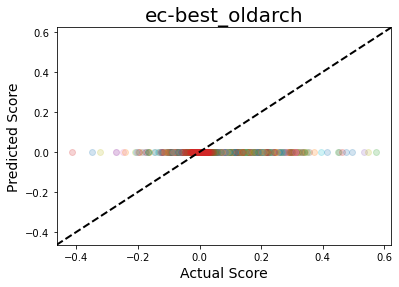

NotInitializedError: This NeuralNetRegressor instance is not initialized yet. Call 'initialize' or 'fit' with appropriate arguments before using this method.

In [60]:
view_preds(nets,make_legend=False)

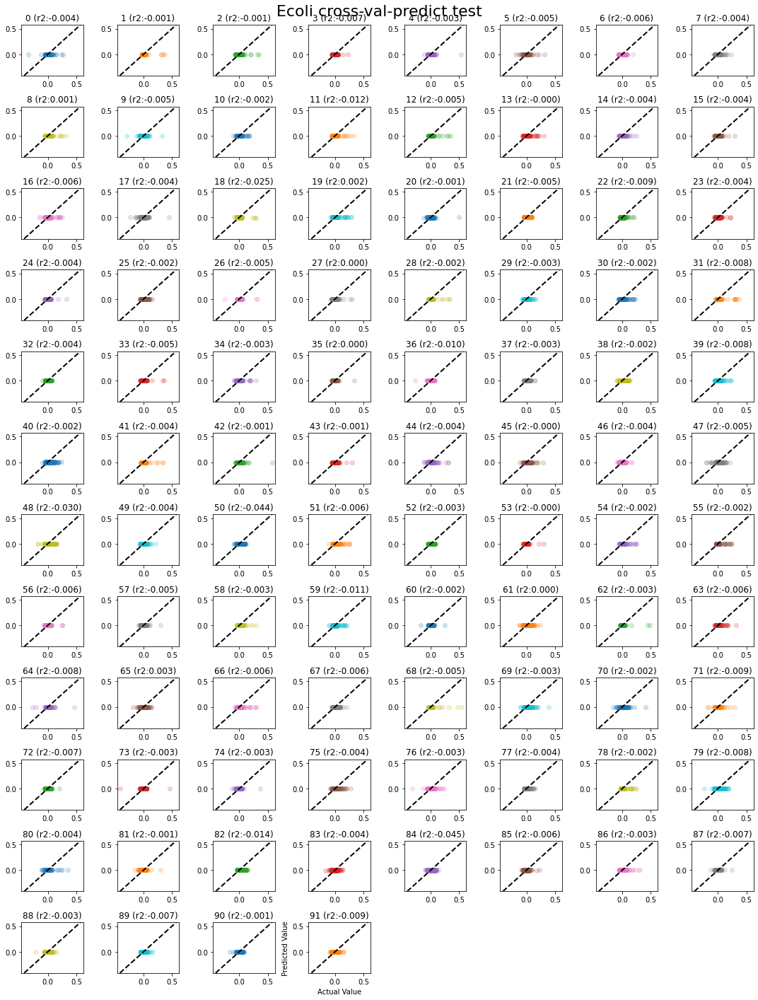

In [61]:
view_multi_parity("Ecoli cross-val-predict test", 
    y, 
    y_pred,
    rigid=True)

# Next ideas
* Retry with data aug 
* gradient clipping


# NOTE: 
--> using "load_best" = True seems to work now?? Stops on the final one